In [1]:
import pandas as pd
import datetime
import calendar
import statsmodels.formula.api as sm
import matplotlib.pylab as plt
import numpy as np

In [66]:
features_df = pd.read_csv("features.csv")
stores_df = pd.read_csv("stores.csv")
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

In [3]:
seasons_dict = {
    1:"Winter",
    2:"Winter",
    3:"Spring",
    4:"Spring",
    5:"Spring",
    6:"Summer",
    7:"Summer",
    8:"Summer",
    9:"Fall",
    10:"Fall",
    11:"Fall",
    12:"Winter"
}

In [4]:
master_df = train_df.merge(stores_df, on='Store', how='left')
master_df = master_df.merge(features_df, on=['Store', 'Date'], how='left')

In [5]:
master_df['MarkDown1'] = master_df['MarkDown1'].fillna(0)
master_df['MarkDown2'] = master_df['MarkDown2'].fillna(0)
master_df['MarkDown3'] = master_df['MarkDown3'].fillna(0)
master_df['MarkDown4'] = master_df['MarkDown4'].fillna(0)
master_df['MarkDown5'] = master_df['MarkDown5'].fillna(0)
master_df['isHoliday'] = master_df['IsHoliday_x']
master_df = master_df.drop(columns=['IsHoliday_x', 'IsHoliday_y'])
master_df['Date'] = pd.to_datetime(master_df['Date'], format='%Y-%m-%d')
master_df['Week_Number'] = master_df['Date'].dt.week
master_df['Quarter'] = master_df['Date'].dt.quarter
master_df['Month'] = master_df['Date'].dt.month.apply(lambda x: calendar.month_abbr[x])
master_df['Season'] = (master_df['Date'].apply(lambda dt: (dt.month%12 + 3)//3)).map(seasons_dict)

In [6]:
master_df.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isHoliday,Week_Number,Quarter,Month,Season
0,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,5,1,Feb,Winter
1,1,1,2010-02-12,46039.49,A,151315,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,6,1,Feb,Winter
2,1,1,2010-02-19,41595.55,A,151315,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,7,1,Feb,Winter
3,1,1,2010-02-26,19403.54,A,151315,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,8,1,Feb,Winter
4,1,1,2010-03-05,21827.90,A,151315,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,9,1,Mar,Winter


In [7]:
master_df.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isHoliday,Week_Number,Quarter,Month,Season
0,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,5,1,Feb,Winter
1,1,1,2010-02-12,46039.49,A,151315,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,6,1,Feb,Winter
2,1,1,2010-02-19,41595.55,A,151315,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,7,1,Feb,Winter
3,1,1,2010-02-26,19403.54,A,151315,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,8,1,Feb,Winter
4,1,1,2010-03-05,21827.90,A,151315,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,9,1,Mar,Winter


In [8]:
result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 2)]).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.315
Date:                Wed, 18 Jul 2018   Prob (F-statistic):            0.00786
Time:                        19:55:24   Log-Likelihood:            -1.2106e+05
No. Observations:               10238   AIC:                         2.421e+05
Df Residuals:                   10226   BIC:                         2.422e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -1.084e-06   2.95e-0

In [9]:
master_df.describe()
#master_df.to_csv("master.csv")

,Store,Dept,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Week_Number,Quarter
count,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123,136727.915739,60.090059,3.361027,2590.074819,879.974298,468.087665,1083.132268,1662.772385,171.201947,7.960289,25.826762,2.482767
std,12.785297,30.492054,22711.183519,60980.583328,18.447931,0.458515,6052.385934,5084.538801,5528.873453,3894.529945,4207.629321,39.159276,1.863296,14.151887,1.071341
min,1.000000,1.000000,-4988.940000,34875.000000,-2.060000,2.472000,0.000000,-265.760000,-29.100000,0.000000,0.000000,126.064000,3.879000,1.000000,1.000000
25%,11.000000,18.000000,2079.650000,93638.000000,46.680000,2.933000,0.000000,0.000000,0.000000,0.000000,0.000000,132.022667,6.891000,14.000000,2.000000
50%,22.000000,37.000000,7612.030000,140167.000000,62.090000,3.452000,0.000000,0.000000,0.000000,0.000000,0.000000,182.318780,7.866000,26.000000,2.000000
75%,33.000000,74.000000,20205.852500,202505.000000,74.280000,3.738000,2809.050000,2.200000,4.540000,425.290000,2168.040000,212.416993,8.572000,38.000000,3.000000
max,45.000000,99.000000,693099.360000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,52.000000,4.000000


In [10]:
result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 1)]).fit()
print(result.summary())

result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 2)]).fit()
print(result.summary())

result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 3)]).fit()
print(result.summary())

result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 4)]).fit()
print(result.summary())

result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 5)]).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.290
Date:                Wed, 18 Jul 2018   Prob (F-statistic):              0.223
Time:                        19:55:25   Log-Likelihood:            -1.1933e+05
No. Observations:               10244   AIC:                         2.387e+05
Df Residuals:                   10232   BIC:                         2.388e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          1.766e-07    2.2e-0

In [11]:
master_df[(master_df['Store'] == 1) & (master_df['Quarter'] == 1)].describe()

,Store,Dept,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Week_Number,Quarter
count,2376.0,2376.000000,2376.000000,2376.0,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.0
mean,1.0,44.225589,21502.405274,151315.0,52.258258,3.157235,3966.692420,1961.729949,17.343779,2544.977243,1900.700013,215.531776,7.676141,7.185185,1.0
std,0.0,29.741929,27384.514596,0.0,9.174786,0.388876,7067.545476,4495.325962,39.701227,7051.589770,2788.900007,4.143648,0.298330,3.417264,0.0
min,1.0,1.000000,-863.000000,151315.0,35.400000,2.514000,0.000000,0.000000,0.000000,0.000000,0.000000,211.018042,7.348000,1.000000,1.0
25%,1.0,19.750000,3447.550000,151315.0,45.320000,2.976000,0.000000,0.000000,0.000000,0.000000,0.000000,211.404742,7.348000,5.000000,1.0
50%,1.0,37.500000,10889.605000,151315.0,53.560000,3.157000,0.000000,0.000000,0.000000,0.000000,0.000000,213.823333,7.742000,7.000000,1.0
75%,1.0,72.000000,30289.552500,151315.0,58.760000,3.473000,6118.560000,1082.740000,9.800000,671.430000,3402.660000,220.172015,7.742000,10.000000,1.0
max,1.0,99.000000,158241.980000,151315.0,69.970000,3.845000,34577.060000,21813.160000,160.530000,32403.870000,8483.000000,221.361012,8.106000,13.000000,1.0


In [12]:
week_array = []
store_array = []

for i in range(1, 46):
    store_array.append(i)
total_stores_sales = {}

for i in range(1, 46):
    week_array.append(i)
    current_store_array = []
    for j in range(1, 53):
        current_dp = master_df[(master_df['Store'] == i) & (master_df['Week_Number'] == j)]
        sales_array = current_dp['Weekly_Sales'].tolist()
        sum_sales = 0
        for k in range(1, len(sales_array)):
            sum_sales = sum_sales + sales_array[k]
        current_store_array.append(sum_sales)
    total_stores_sales[i] = current_store_array

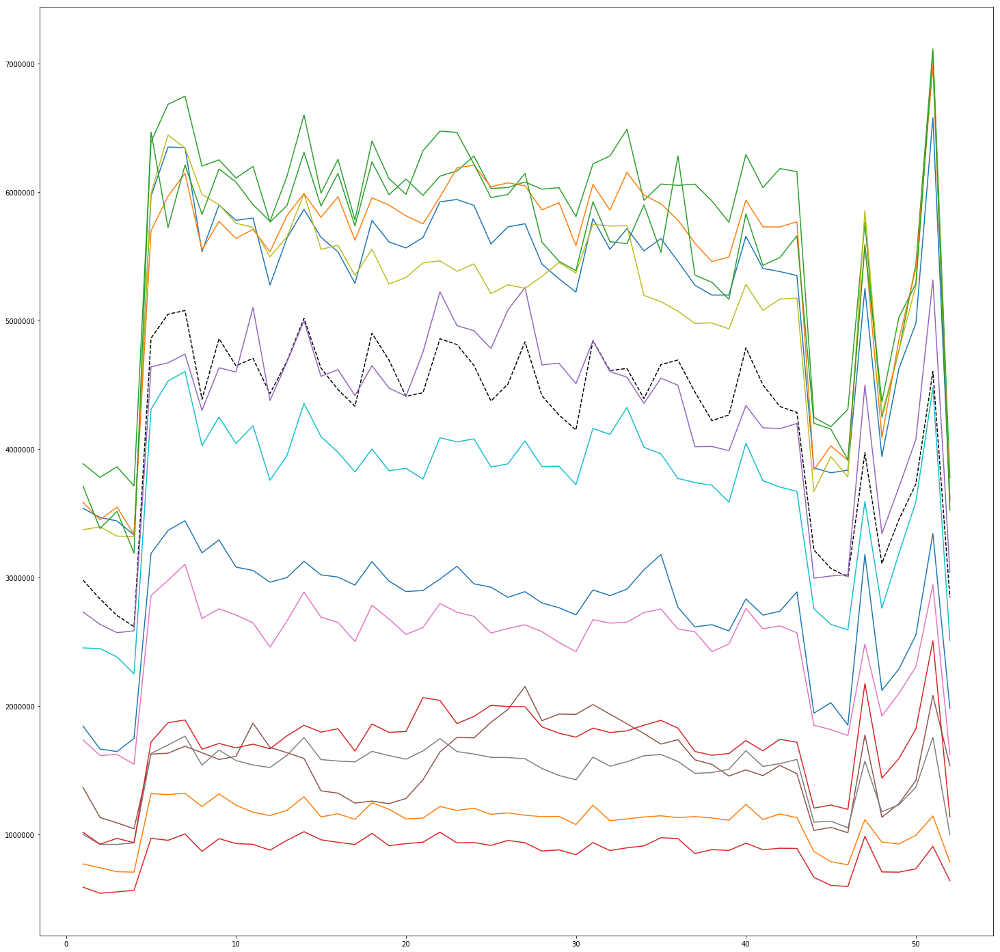

In [13]:
store_array = []
for i in range(1, 53):
    store_array.append(i)

#for i in range(1, 46):
    #total_stores_sales[i].pop(0)
    
plt.plot(store_array,total_stores_sales[1],"k--")
plt.plot(store_array,total_stores_sales[2])
plt.plot(store_array,total_stores_sales[3])
plt.plot(store_array,total_stores_sales[4])
plt.plot(store_array,total_stores_sales[5])
plt.plot(store_array,total_stores_sales[6])
plt.plot(store_array,total_stores_sales[7])
plt.plot(store_array,total_stores_sales[8])
plt.plot(store_array,total_stores_sales[9])
plt.plot(store_array,total_stores_sales[10])
plt.plot(store_array,total_stores_sales[11])
plt.plot(store_array,total_stores_sales[12])
plt.plot(store_array,total_stores_sales[13])
plt.plot(store_array,total_stores_sales[14])
plt.plot(store_array,total_stores_sales[15])

fig = plt.gcf()
fig.set_size_inches(25,25)
plt.show()

In [14]:
print(total_stores_sales[2][1])

3466759.32


In [15]:
weekly_total_array = []

for i in range(52):
    weekly_sum = 0
    for j in range(1, 46):
        weekly_sum = weekly_sum + total_stores_sales[j][i]
    weekly_total_array.append(weekly_sum)
    
print(weekly_total_array)

[87207935.44000001, 82123863.94999997, 82111755.27, 78782339.45, 141107626.29999998, 144225095.94000003, 146071957.49999994, 133184545.96, 139950456.44, 137229283.09, 135916119.07999998, 130958230.25999998, 136703731.92999998, 145236126.29000002, 136176536.90999997, 137895177.51000002, 130351802.38000001, 141820036.94, 137035191.81000006, 135357540.22, 140299894.08, 146593793.20999998, 144498562.74000004, 142816534.57, 139513219.76, 142414153.89000002, 146374081.85, 137211558.90999997, 135591498.90999994, 131776493.19999999, 143064226.45000002, 139492566.94, 140724032.85999998, 140164518.32999998, 139085059.64999998, 140047934.25, 130392878.93000004, 127720867.82, 127406445.66, 138991766.96, 132671122.41000004, 132877323.61999999, 133241687.89000002, 93093042.81000003, 93961127.03999996, 90883180.69999997, 131682585.43, 98358609.67, 109939927.62, 120117751.87, 155697302.7, 85853804.95]


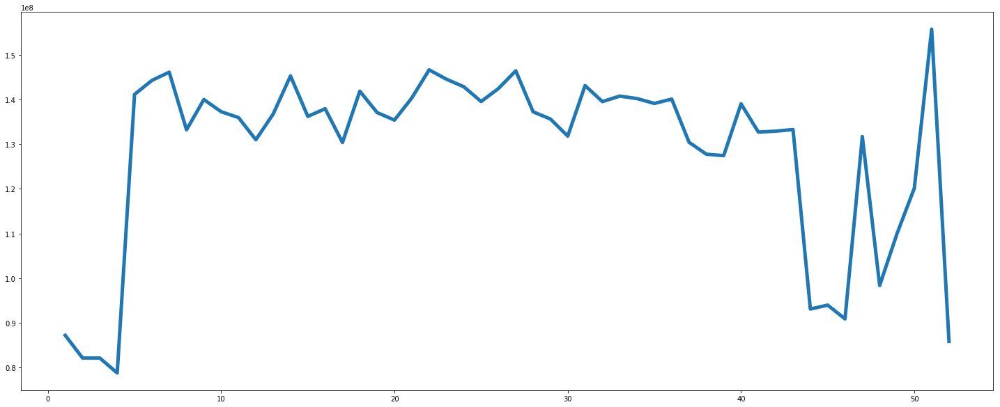

In [16]:
plt.plot(store_array,weekly_total_array, linewidth = 5)
fig = plt.gcf()
fig.set_size_inches(25,10)
plt.show()

In [17]:
sales_dict = {}
for store in range(1, 46):
    for dept in range(1, 100):
        current_key = str(store) + "," + str(dept)
        sales_dict[current_key] = 0

In [18]:
result = sm.ols(formula="Weekly_Sales ~ isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment + Week_Number", data=master_df[(master_df['Store'] == 1) & (master_df['Dept'] == 1)]).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Weekly_Sales   R-squared:                       0.275
Model:                            OLS   Adj. R-squared:                  0.215
Method:                 Least Squares   F-statistic:                     4.528
Date:                Wed, 18 Jul 2018   Prob (F-statistic):           8.49e-06
Time:                        19:55:34   Log-Likelihood:                -1494.3
No. Observations:                 143   AIC:                             3013.
Df Residuals:                     131   BIC:                             3048.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -9.032e-07   5.87e-06     -0.154      0.878   -1.25e-05    1.07e-05
isHoliday[T.True]  -144.8330   3236.662     -0.045      0.964   -6547.722    6258.056
Fuel_Price         1821.3247   3268.271      0.557      0.578   -4644.094    8286.743
Temperature        -408.5091     61.686     -6.622      0.000    -530.539    -286.479
Size                 -0.1367      0.888     -0.154      0.878      -1.893       1.620
MarkDown1             0.1410      0.288      0.490      0.625      -0.428       0.710
MarkDown2            -0.2022      0.186     -1.088      0.279      -0.570       0.166
MarkDown3            -0.1604      0.171     -0.937      0.351      -0.499       0.178
MarkDown4             0.0411      0.321      0.128      0.898      -0.594       0.676
MarkDown5            -0.5835      0.366     -1.592      0.114      -1.308       0.142
CPI                 224.0355    555.419      0.403      0.687    -874.716    1322.787
Unemployment       1883.8868   3836.450      0.491      0.624   -5705.526    9473.299
Week_Number         129.3682     60.724      2.130      0.035       9.241     249.495
==============================================================================
Omnibus:                       73.825   Durbin-Watson:                   1.197
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              257.640
Skew:                           2.014   Prob(JB):                     1.13e-56
Kurtosis:                       8.197   Cond. No.                     7.86e+20
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.31e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [19]:
#for store in range(1, 46):
#    week_array.append(i)
#    current_store_array = []
#    for dept in range(1, 100):
#        for j in range(1, 53):
#            current_dp = master_df[(master_df['Store'] == store) & (master_df['Dept'] == dept) & (master_df['Week_Number'] == j)]
#            sales_array = current_dp['Weekly_Sales'].tolist()
#            sum_sales = 0
#            for k in range(1, len(sales_array)):
#                sum_sales = sum_sales + sales_array[k]
#            current_key = str(store) + "," + str(dept)
#            sales_dict[current_key] = sum_sales

In [20]:
master_df = master_df.join(pd.get_dummies(master_df['Store'], prefix='Store'))
master_df = master_df.join(pd.get_dummies(master_df['Dept'], prefix='Dept'))
master_df = master_df.join(pd.get_dummies(master_df['Week_Number'], prefix='Week_Number'))

In [21]:
master_df.describe()

,Store,Dept,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,...,Week_Number_43,Week_Number_44,Week_Number_45,Week_Number_46,Week_Number_47,Week_Number_48,Week_Number_49,Week_Number_50,Week_Number_51,Week_Number_52
count,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,...,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123,136727.915739,60.090059,3.361027,2590.074819,879.974298,468.087665,1083.132268,...,0.021005,0.013957,0.013979,0.013941,0.014135,0.014097,0.014133,0.014166,0.014192,0.014104
std,12.785297,30.492054,22711.183519,60980.583328,18.447931,0.458515,6052.385934,5084.538801,5528.873453,3894.529945,...,0.143400,0.117314,0.117402,0.117245,0.118049,0.117892,0.118039,0.118175,0.118283,0.117922
min,1.000000,1.000000,-4988.940000,34875.000000,-2.060000,2.472000,0.000000,-265.760000,-29.100000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,18.000000,2079.650000,93638.000000,46.680000,2.933000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,22.000000,37.000000,7612.030000,140167.000000,62.090000,3.452000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,33.000000,74.000000,20205.852500,202505.000000,74.280000,3.738000,2809.050000,2.200000,4.540000,425.290000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,45.000000,99.000000,693099.360000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [56]:
store_cols = [col for col in master_df if col.startswith('Store_')]
weeks_cols = [col for col in master_df if col.startswith('Week_Number_')]
dept_cols = [col for col in master_df if col.startswith('Dept_')]

equals_to_str = ""

for i in range(len(store_cols)):
    equals_to_str = equals_to_str + str(store_cols[i]) + " + "
    
for i in range(len(weeks_cols)):
    equals_to_str = equals_to_str + str(weeks_cols[i]) + " + "
    
for i in range(len(dept_cols)):
    equals_to_str = equals_to_str + str(dept_cols[i]) + " + "
    
print(equals_to_str)

Store_1 + Store_2 + Store_3 + Store_4 + Store_5 + Store_6 + Store_7 + Store_8 + Store_9 + Store_10 + Store_11 + Store_12 + Store_13 + Store_14 + Store_15 + Store_16 + Store_17 + Store_18 + Store_19 + Store_20 + Store_21 + Store_22 + Store_23 + Store_24 + Store_25 + Store_26 + Store_27 + Store_28 + Store_29 + Store_30 + Store_31 + Store_32 + Store_33 + Store_34 + Store_35 + Store_36 + Store_37 + Store_38 + Store_39 + Store_40 + Store_41 + Store_42 + Store_43 + Store_44 + Store_45 + Week_Number_1 + Week_Number_2 + Week_Number_3 + Week_Number_4 + Week_Number_5 + Week_Number_6 + Week_Number_7 + Week_Number_8 + Week_Number_9 + Week_Number_10 + Week_Number_11 + Week_Number_12 + Week_Number_13 + Week_Number_14 + Week_Number_15 + Week_Number_16 + Week_Number_17 + Week_Number_18 + Week_Number_19 + Week_Number_20 + Week_Number_21 + Week_Number_22 + Week_Number_23 + Week_Number_24 + Week_Number_25 + Week_Number_26 + Week_Number_27 + Week_Number_28 + Week_Number_29 + Week_Number_30 + Week_Number_3

In [57]:
equals_to_str = "Weekly_Sales ~ " + equals_to_str + "isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment"

In [58]:
result = sm.ols(formula = equals_to_str, data=master_df).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.663
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     4511.
Date:                Wed, 18 Jul 2018   Prob (F-statistic):               0.00
Time:                        20:17:52   Log-Likelihood:            -4.5974e+06
No. Observations:              421570   AIC:                         9.195e+06
Df Residuals:                  421385   BIC:                         9.197e+06
Df Model:                         184                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          3748.6821   1830.79

In [68]:
store_cols = [col for col in master_df if col.startswith('Store_')]

equals_to_str = ""

for i in range(len(store_cols)):
    equals_to_str = equals_to_str + str(store_cols[i]) + " + "
    
equals_to_str = "Weekly_Sales ~ " + equals_to_str + "isHoliday + Fuel_Price + Temperature + Size + MarkDown1 + MarkDown2 + MarkDown3 + MarkDown4 + MarkDown5 + CPI + Unemployment"

result = sm.ols(formula = equals_to_str, data=master_df).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     811.9
Date:                Wed, 18 Jul 2018   Prob (F-statistic):               0.00
Time:                        21:23:10   Log-Likelihood:            -4.8059e+06
No. Observations:              421570   AIC:                         9.612e+06
Df Residuals:                  421515   BIC:                         9.613e+06
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          5998.5230   2976.69

In [70]:
predict_array = result.predict()

In [71]:
for i in range(len(predict_array)):
    print(predict_array[i])

22052.084106512106
22679.09429091848
22115.25701282391
22019.959242161956
21980.593750494874
21843.585714106674
21838.709686841656
21858.903532206627
21847.25391575911
21776.664207337162
21745.92422956122
21768.06106970841
21751.847425877506
21665.573879422074
21631.525928651656
21637.119888454574
21644.835531290326
21680.908598982154
21711.06593125245
21694.909546084895
21680.7986231445
21708.75070822626
21728.685972539515
21714.63567201179
21724.07127336577
21720.28314747461
21678.42875420762
21640.15985624915
21661.0492511572
21703.41424899291
21769.10262861412
22373.36790926767
21756.965555873034
21742.505378169866
21830.409447995753
21890.095544039
21803.40265145485
21774.626965313233
21783.212842877452
21907.86224197223
21874.986084191656
21926.061260513306
22391.31036320728
21983.508222137705
21923.71078484411
21871.84070026716
21836.564092762725
22410.5630171441
21847.102247614956
21969.287873408364
21868.68859957562
21879.717228013178
21913.58056681669
22527.48031614228
21739.

21845.822575842096
21264.78032952718
22286.028442551717
21314.256796990543
21713.7973734795
21280.11114873844
21846.254925461508
21500.625515077583
21603.15515029635
21504.859371605227
21541.630726198793
21283.251500351762
21646.039791867835
21729.872769404297
21579.55354933995
21597.328777550785
21781.11085167879
21735.48819259657
21781.111870700704
21880.97080519705
21705.45249300424
21938.162647011006
21809.400288579098
22021.450138775577
21844.16060921159
21805.12070386173
21581.875642289797
21674.882137457716
21651.563209361913
21603.150242351996
21838.997835048678
21443.806471160846
22040.271075345714
21953.590302287033
21868.22293159957
21739.033730763236
21873.10534588468
22077.197257472908
21879.430227094264
21864.852563866123
22052.084106512106
22679.09429091848
22115.25701282391
22019.959242161956
21980.593750494874
21843.585714106674
21838.709686841656
21858.903532206627
21847.25391575911
21776.664207337162
21745.92422956122
21768.06106970841
21751.847425877506
21665.573879

21651.563209361913
21603.150242351996
21838.997835048678
21443.806471160846
22040.271075345714
21953.590302287033
21868.22293159957
21739.033730763236
21873.10534588468
22077.197257472908
21879.430227094264
21864.852563866123
22052.084106512106
22679.09429091848
22115.25701282391
22019.959242161956
21980.593750494874
21843.585714106674
21838.709686841656
21858.903532206627
21847.25391575911
21776.664207337162
21745.92422956122
21768.06106970841
21751.847425877506
21665.573879422074
21631.525928651656
21637.119888454574
21644.835531290326
21680.908598982154
21711.06593125245
21694.909546084895
21680.7986231445
21708.75070822626
21728.685972539515
21714.63567201179
21724.07127336577
21720.28314747461
21678.42875420762
21640.15985624915
21661.0492511572
21703.41424899291
21769.10262861412
22373.36790926767
21756.965555873034
21742.505378169866
21830.409447995753
21890.095544039
21803.40265145485
21774.626965313233
21783.212842877452
21907.86224197223
21874.986084191656
21926.061260513306


21805.12070386173
21581.875642289797
21674.882137457716
21651.563209361913
21603.150242351996
21838.997835048678
21443.806471160846
22040.271075345714
21953.590302287033
21868.22293159957
21739.033730763236
21873.10534588468
22077.197257472908
21879.430227094264
21864.852563866123
22052.084106512106
22679.09429091848
22115.25701282391
22019.959242161956
21980.593750494874
21843.585714106674
21838.709686841656
21858.903532206627
21847.25391575911
21776.664207337162
21745.92422956122
21768.06106970841
21751.847425877506
21665.573879422074
21631.525928651656
21637.119888454574
21644.835531290326
21680.908598982154
21708.75070822626
21724.07127336577
21720.28314747461
22373.36790926767
21830.409447995753
21890.095544039
21803.40265145485
21774.626965313233
21783.212842877452
21907.86224197223
21874.986084191656
21926.061260513306
22391.31036320728
21871.84070026716
21847.102247614956
21969.287873408364
21868.68859957562
22527.48031614228
21739.41666581286
21676.35705821062
21569.7640307468

21661.0492511572
21703.41424899291
21769.10262861412
22373.36790926767
21756.965555873034
21742.505378169866
21830.409447995753
21890.095544039
21803.40265145485
21774.626965313233
21783.212842877452
21907.86224197223
21874.986084191656
21926.061260513306
22391.31036320728
21983.508222137705
21923.71078484411
21871.84070026716
21836.564092762725
22410.5630171441
21847.102247614956
21969.287873408364
21868.68859957562
21879.717228013178
21913.58056681669
22527.48031614228
21739.41666581286
21676.35705821062
21569.764030746854
21522.95489241809
21417.804379866357
21360.15720310893
21454.25948826853
21309.827580488854
21201.644824279098
21146.080923709276
21155.879291163874
21169.230006348782
21068.108961907295
21138.174276884674
21113.87369835348
21114.830882146798
21143.089963965547
21117.41893778713
21173.990027351327
21117.63076727126
21144.40871972851
21058.10254638112
21037.298448583584
21007.88418092933
20960.279697579375
20999.348932011726
21062.14528584715
21102.295880685284
2109

21504.859371605227
21541.630726198793
21283.251500351762
21646.039791867835
21729.872769404297
21579.55354933995
21597.328777550785
21781.11085167879
21735.48819259657
21781.111870700704
21880.97080519705
21705.45249300424
21938.162647011006
21809.400288579098
22021.450138775577
21844.16060921159
21805.12070386173
21581.875642289797
21674.882137457716
21651.563209361913
21603.150242351996
21838.997835048678
21443.806471160846
22040.271075345714
21953.590302287033
21868.22293159957
21739.033730763236
21873.10534588468
22077.197257472908
21879.430227094264
21864.852563866123
21708.75070822626
21569.764030746854
21522.95489241809
21068.108961907295
21117.41893778713
21173.990027351327
21062.14528584715
21102.295880685284
21098.03798865776
21778.75767794581
27746.396100633847
22425.262158578036
22007.063429030666
22037.578545121385
20766.930594771522
21264.78032952718
22286.028442551717
21314.256796990543
21713.7973734795
21280.11114873844
21541.630726198793
21283.251500351762
21579.553549

26223.621831806384
26265.80348429308
26330.40632486495
26340.250461233347
26259.618611671394
26216.50641032382
26190.325703873183
26157.893796049895
26205.481072663126
26277.086098389787
26292.087181022518
26294.484530365473
26973.639156511847
26407.942174048498
26482.420087934166
26533.84820726506
26786.066822606277
26780.27975344514
26801.687945507423
26778.604205995307
26907.674306811612
26251.025161597416
27191.450778935563
35284.88895480662
28459.270348345475
27564.36962466059
27354.16720628571
27608.098110551193
24053.43847764617
25990.130122895564
26895.847178108826
27110.832495282397
27202.94933560546
26499.86133435419
27539.116245459292
26729.466987796084
26837.438496982817
26884.247055181215
27181.524175026818
26786.30849181165
26921.861204145727
26857.46226264408
26842.870288302085
26410.70966796809
26794.207961769283
26843.088573632533
26816.418674562858
26873.979357333483
26957.409910117007
27499.68413149042
27076.87179243104
27283.241065145863
27011.006598415566
28394.958

26873.979357333483
26957.409910117007
27499.68413149042
27076.87179243104
27283.241065145863
27011.006598415566
28394.958896436023
27105.113253943622
27163.365410397877
27151.504447797102
27028.490282343348
26971.034981635712
26744.6521096208
26955.97850131643
26913.00505332026
27006.840442443106
26762.958788159267
27379.500619832514
27215.25791068453
27194.34160911095
26976.125144968424
27167.21963637793
27599.56609173926
27179.455446721644
27293.431444173955
27189.468958654375
27795.922511826044
27234.240857604676
27141.785162055785
27090.680489997307
26962.48403657646
26955.955301170252
26977.43339809382
26902.39816083898
26846.010326143634
26793.74843567076
26830.369997911024
26821.00793498245
26742.9560204123
26710.863885909217
26717.810140654867
26703.000048401707
26734.847349091084
26746.882680189254
26743.154277960028
26726.8970463129
26779.530645140836
26796.73243604038
26782.096249683957
26770.681651305404
26792.82078067117
26743.914558285698
26708.771350025272
26729.66871332

27090.680489997307
26962.48403657646
26955.955301170252
26977.43339809382
26902.39816083898
26846.010326143634
26793.74843567076
26830.369997911024
26821.00793498245
26742.9560204123
26710.863885909217
26717.810140654867
26734.847349091084
26746.882680189254
26743.154277960028
26726.8970463129
26779.530645140836
26796.73243604038
26770.681651305404
26792.82078067117
26743.914558285698
26708.771350025272
26729.66871332874
26773.509589941757
26851.732115602845
27458.158300525174
26846.259783679117
26822.89221424872
26941.178953860046
26982.17158249751
26901.73968514396
26872.766089623165
26901.313380800108
27001.39753517601
26959.026693489064
27016.761989762363
27491.216888309988
27067.7639024463
27016.68295708386
26979.10590503077
26944.51853929798
27506.484802080857
26978.603782698217
27089.04769666944
26990.978592859174
26985.943840879245
27049.34692484078
27655.207879463185
26831.219184415775
26793.301288277115
26683.861787910857
26627.74736628837
26518.47739947697
26461.897075514506

26907.674306811612
26251.025161597416
27191.450778935563
35284.88895480662
28459.270348345475
27564.36962466059
27354.16720628571
27608.098110551193
24053.43847764617
25990.130122895564
26895.847178108826
27110.832495282397
27202.94933560546
26499.86133435419
27539.116245459292
26729.466987796084
26837.438496982817
26884.247055181215
27181.524175026818
26786.30849181165
26921.861204145727
26857.46226264408
26842.870288302085
26410.70966796809
26794.207961769283
26843.088573632533
26816.418674562858
26873.979357333483
26957.409910117007
27499.68413149042
27076.87179243104
27283.241065145863
27011.006598415566
28394.958896436023
27105.113253943622
27163.365410397877
27151.504447797102
27028.490282343348
26971.034981635712
26744.6521096208
26955.97850131643
26913.00505332026
27006.840442443106
26762.958788159267
27379.500619832514
27215.25791068453
27194.34160911095
26976.125144968424
27167.21963637793
27599.56609173926
27179.455446721644
27293.431444173955
27189.468958654375
27795.922511

6224.496392643891
6311.210033495594
6301.935214559085
6359.000873570928
6408.418557263316
6321.556837206454
6416.663113729894
6398.727406098476
6597.8611517110185
6534.325789386223
6500.838703231232
6402.443496878834
6357.260288915806
6310.857261902494
6263.237369261151
6313.872474257808
6253.969994007535
6795.177231075263
6300.63698035514
6378.197667228382
6325.096979619731
6497.345531505142
6512.454446796699
6615.899093000316
6535.183142617674
6836.237777853556
7404.392561610242
6862.841522819537
6784.335984511867
6733.970262401976
6609.155002882272
6598.790847205878
6621.118712262191
6550.858526427926
6491.40602848546
6475.077214439792
6474.008211383622
6459.738945965039
6392.1439720708795
6343.626181581792
6379.043871918642
6398.772585281044
6438.149113679308
6430.997679704311
6436.9611031565555
6422.394550690089
6425.1378226264105
6445.204622120578
6432.120539698323
6453.453969820597
6447.373858945692
6427.399094465671
6371.865510109879
6376.72645570607
6423.320185235181
6469.1635

6352.96347875575
6287.246164696289
6170.65587193805
6102.399756528681
6007.321096147174
5986.366968431579
5991.09211301836
5894.509383713148
5787.388864011618
5738.637263943903
5721.681685589354
5752.902971310074
5657.811343865854
5689.264858412764
5679.197304464925
5732.846801148836
5711.602956010491
5820.888408303208
5801.161649612181
6438.522150040712
5862.802978704932
5939.0887204919945
5992.3246677242805
6220.9454099765135
6249.935749488604
6247.7393024281255
6218.1765583090455
6360.926978895863
6392.325598705724
6454.007231805053
10649.081385603762
6912.894267874553
6739.879936810701
6596.357085481796
6648.973249638054
6646.955150153315
6368.257653158522
6577.6103898659485
6543.889407208156
6546.004391891091
6357.070766252936
7156.181605068505
6357.546705496564
6405.26450378354
6295.393453978179
6361.310578573688
6226.932527949255
6183.102465843655
6108.014145874082
6125.709206564476
6093.060815816207
6141.90710978914
6149.693047651621
6161.989477679785
6321.556837206454
6416.663

5732.846801148836
5756.843219281049
5742.480269888205
5791.162414776103
5837.915201141134
5864.730932466327
5787.737022898852
5749.082036543762
5711.602956010491
5707.408432426835
5733.519814755335
5792.585831102192
5820.888408303208
5801.161649612181
6438.522150040712
5862.802978704932
5939.0887204919945
5992.3246677242805
6220.9454099765135
6249.935749488604
6247.7393024281255
6218.1765583090455
6360.926978895863
6392.325598705724
6454.007231805053
10649.081385603762
6912.894267874553
6739.879936810701
6596.357085481796
6648.973249638054
6646.955150153315
6368.257653158522
6577.6103898659485
6543.889407208156
6546.004391891091
6357.070766252936
7156.181605068505
6357.546705496564
6405.26450378354
6295.393453978179
6361.310578573688
6226.932527949255
6183.102465843655
6108.014145874082
6125.709206564476
6093.060815816207
6141.90710978914
6149.693047651621
6161.989477679785
6224.496392643891
6311.210033495594
6301.935214559085
6359.000873570928
6408.418557263316
6321.556837206454
6416.

6596.357085481796
6648.973249638054
6646.955150153315
6368.257653158522
6577.6103898659485
6543.889407208156
6546.004391891091
6357.070766252936
7156.181605068505
6357.546705496564
6405.26450378354
6295.393453978179
6361.310578573688
6226.932527949255
6183.102465843655
6108.014145874082
6125.709206564476
6093.060815816207
6141.90710978914
6149.693047651621
6161.989477679785
6224.496392643891
6311.210033495594
6301.935214559085
6359.000873570928
6408.418557263316
6321.556837206454
6416.663113729894
6398.727406098476
6597.8611517110185
6534.325789386223
6500.838703231232
6402.443496878834
6357.260288915806
6310.857261902494
6263.237369261151
6313.872474257808
6253.969994007535
6795.177231075263
6300.63698035514
6378.197667228382
6325.096979619731
6497.345531505142
6512.454446796699
6615.899093000316
6535.183142617674
6836.237777853556
7404.392561610242
6862.841522819537
6784.335984511867
6733.970262401976
6609.155002882272
6598.790847205878
6621.118712262191
6550.858526427926
6491.406028

28669.296618399538
28714.87704637128
28745.512579214857
28773.743787445637
29378.772635944428
28827.016741309588
28900.629647251044
28938.709724054508
29197.368382722747
29228.66179438429
29168.60162008868
29260.891640193433
29340.048005879726
29089.472460763875
29607.914979348236
38650.48613647085
30966.885340429417
30237.4355338803
30210.058377183937
30118.16563470506
27421.25373183763
28548.497115608552
29363.449803455445
29364.822301518627
29575.396910316358
28847.413429167984
30108.33286970974
29214.42393077223
29710.49778166357
29270.335247624356
29682.647544620515
29094.140568772797
29384.212715786576
29141.136430540148
29367.748487881607
29000.53257606304
29058.058308624422
29232.268505673608
29162.27627149535
29392.56904616212
29341.599828185666
29365.63059748907
29455.380738072374
29615.381365101974
29594.703886145453
29659.185304282168
29550.431882536264
29427.909022330838
29653.620956469826
29645.343166387862
29199.840777886908
29400.53109200128
29421.15963582057
29354.8402

28795.607545073057
28788.851821193603
28755.17186162502
28802.09825119994
28749.42172477696
28759.579679181254
28834.794113477095
28835.61215029296
29446.510805147467
28946.156108255986
28954.633408369482
29013.51825631425
28960.56150335601
28961.184125241813
28938.43592430403
29021.497749613947
29086.705452139962
29050.244535593243
29071.085120513475
29662.020550302943
29122.95514410312
29077.63103965543
29022.618237654333
29055.017090082132
29635.342759384857
29219.620435970486
29289.17838358667
29209.114579530215
29185.723744359417
29262.9566280311
29826.474977889397
29094.29984226256
29069.43900931386
28955.32251417171
28814.339970823657
28784.98708810206
28725.198585426697
28888.730835521725
28781.28065965089
28708.7808721123
28609.610995106214
28655.048735863216
28609.059775397185
28534.976667649655
28530.583744817646
28570.047499247758
28581.20697013719
28591.092671649174
28571.451094507334
28618.81126052952
28724.973055207076
28747.258657750095
28700.164657348218
28663.54704398

28716.703842696377
28655.197627802605
28621.482332437685
28658.978435345896
28663.5929991045
28609.860017096347
28600.919654800065
28593.1124794072
28812.96514400336
28767.55943362653
28795.607545073057
28788.851821193603
28755.17186162502
28802.09825119994
28749.42172477696
28759.579679181254
28834.794113477095
28835.61215029296
29446.510805147467
28946.156108255986
28954.633408369482
29013.51825631425
28960.56150335601
28961.184125241813
28938.43592430403
29021.497749613947
29086.705452139962
29050.244535593243
29071.085120513475
29662.020550302943
29122.95514410312
29077.63103965543
29022.618237654333
29055.017090082132
29635.342759384857
29219.620435970486
29289.17838358667
29209.114579530215
29185.723744359417
29262.9566280311
29826.474977889397
29094.29984226256
29069.43900931386
28955.32251417171
28814.339970823657
28784.98708810206
28725.198585426697
28888.730835521725
28781.28065965089
28708.7808721123
28609.610995106214
28655.048735863216
28609.059775397185
28534.976667649655

28742.441962472963
28738.129073243315
28785.900325399507
28716.703842696377
28655.197627802605
28621.482332437685
28658.978435345896
28663.5929991045
28609.860017096347
28600.919654800065
28593.1124794072
28812.96514400336
28767.55943362653
28795.607545073057
28788.851821193603
28755.17186162502
28802.09825119994
28749.42172477696
28759.579679181254
28834.794113477095
28835.61215029296
29446.510805147467
28946.156108255986
28954.633408369482
29013.51825631425
28960.56150335601
28961.184125241813
28938.43592430403
29021.497749613947
29086.705452139962
29050.244535593243
29071.085120513475
29662.020550302943
29122.95514410312
29077.63103965543
29022.618237654333
29055.017090082132
29635.342759384857
29219.620435970486
29289.17838358667
29209.114579530215
29185.723744359417
29262.9566280311
29826.474977889397
29094.29984226256
29069.43900931386
28955.32251417171
28814.339970823657
28784.98708810206
28725.198585426697
28888.730835521725
28781.28065965089
28708.7808721123
28609.610995106214

5039.490473388152
4997.619165269549
5182.037845916081
8572.37402440382
6358.851851274633
5440.596160957364
5282.384380274021
5371.904500242714
5233.187485584516
5242.587017497751
5240.761172682126
5207.689077279308
5225.688028781093
5018.268888371151
5744.4807788013095
5163.179958885123
5102.443057164304
4970.086320031027
5195.869649137152
4942.846610502134
4859.038455660794
4864.580716389093
4844.3402206415685
4791.686272643314
4845.417581950179
4933.9235080969875
4922.146694858897
4946.2743828077455
5029.494364917424
5048.184940746611
5016.490389406907
5009.354546372897
5038.903919415169
5119.106279262619
5037.478888103136
5241.437526176171
5140.369511516956
5124.82016802367
5010.125201178665
5021.683601230967
4975.3952221345435
4864.298053086706
4955.092019670472
4927.0607472165075
5425.247493716126
5005.69904146905
5147.22543067448
4956.468019847771
5127.7635381371765
5267.3099778917385
5126.352984735415
5154.483887771414
5520.839748372902
6109.595879343589
5546.634989315922
5462.4

4547.956670470696
4468.601206603871
4437.025684499706
4394.002028402843
4377.412674340818
4416.67089094461
4479.367435888432
4501.804078712095
4484.529553711513
5160.452914538666
4559.246573759913
4655.9742786480365
4701.664006000873
4912.508253761234
4916.833905030237
4921.820550698035
4888.676213012588
5039.490473388152
4997.619165269549
5182.037845916081
8572.37402440382
6358.851851274633
5440.596160957364
5282.384380274021
5371.904500242714
5233.187485584516
5242.587017497751
5240.761172682126
5207.689077279308
5225.688028781093
5018.268888371151
5744.4807788013095
5163.179958885123
5102.443057164304
4970.086320031027
5195.869649137152
4942.846610502134
4859.038455660794
4864.580716389093
4844.3402206415685
4791.686272643314
4845.417581950179
4933.9235080969875
4922.146694858897
4946.2743828077455
5029.494364917424
5048.184940746611
5016.490389406907
5009.354546372897
5038.903919415169
5119.106279262619
5037.478888103136
5241.437526176171
5140.369511516956
5124.82016802367
5010.125

4453.284201672715
4502.522060283827
4526.554731891027
4547.956670470696
4468.601206603871
4437.025684499706
4394.002028402843
4377.412674340818
4416.67089094461
4479.367435888432
4501.804078712095
4484.529553711513
5160.452914538666
4559.246573759913
4655.9742786480365
4701.664006000873
4912.508253761234
4916.833905030237
4921.820550698035
4888.676213012588
5039.490473388152
4997.619165269549
5182.037845916081
8572.37402440382
6358.851851274633
5440.596160957364
5282.384380274021
5371.904500242714
5233.187485584516
5242.587017497751
5240.761172682126
5207.689077279308
5225.688028781093
5018.268888371151
5744.4807788013095
5163.179958885123
5102.443057164304
4970.086320031027
5195.869649137152
4942.846610502134
4859.038455660794
4864.580716389093
4844.3402206415685
4791.686272643314
4845.417581950179
4933.9235080969875
4922.146694858897
4946.2743828077455
5029.494364917424
5048.184940746611
5016.490389406907
5009.354546372897
5038.903919415169
5119.106279262619
5037.478888103136
5241.43

5731.033068127946
5124.413164383197
5135.204405525372
5141.527064712899
5183.112254840541
5097.694951250533
5067.259178823813
5077.414377376893
5209.896186282755
5151.384051400936
5218.5971955568275
5678.746375329774
5266.920779968629
5208.090788392801
5157.875644105378
5113.68686743893
5700.596577601075
5161.44666959247
5261.023883940461
5169.940159266505
5187.842095681437
5234.1568044075075
5824.005853809489
5039.775220754914
4986.711216189113
4877.000446639221
4816.406740714176
4717.436543638489
4667.7316891378105
4771.570979955186
4632.341292466348
4534.447929481559
4473.022416117643
4469.4238931430355
4493.15788853145
4391.263993475269
4441.731601699086
4430.323096867255
4447.010318495915
4478.473256348849
4453.284201672715
4502.522060283827
4526.554731891027
4547.956670470696
4468.601206603871
4437.025684499706
4394.002028402843
4377.412674340818
4416.67089094461
4479.367435888432
4501.804078712095
4484.529553711513
5160.452914538666
4559.246573759913
4655.9742786480365
4701.6640

21810.788080949525
21795.86484506267
21857.143333337972
21867.067370962075
21851.543477842482
21861.5922274401
21867.714022934204
21826.66849947985
21784.706872476025
21796.949153138008
21841.431720251163
21902.68099797411
22515.229078713965
21902.92694236773
21928.794542920015
21989.959248271727
22025.38500757368
21934.101958043426
21911.599072162655
21923.717646636247
22044.364463619706
21998.384669384053
22058.43824177361
22526.690481192854
22101.634293072144
22050.613778789128
21996.077667003265
21957.455079358966
22551.30102814065
22015.32845487966
22103.64721887057
22011.037754830006
22032.013408749677
22093.634433042585
22661.89628225612
21881.11933735008
21840.507624108843
21725.047039967114
21646.177339034646
21559.074496568173
21515.659822879923
21571.126382151044
21432.31522840483
21330.140320071925
21280.9648352021
21271.316372635116
21308.474724546017
21202.488105587396
21242.440239860225
21230.49805971051
21251.936089769675
21276.70012288143
21257.761423667427
21302.01937

21806.786478877224
21811.285240028606
21810.788080949525
21795.86484506267
21857.143333337972
21867.067370962075
21851.543477842482
21861.5922274401
21867.714022934204
21826.66849947985
21784.706872476025
21796.949153138008
21841.431720251163
21902.68099797411
22515.229078713965
21902.92694236773
21928.794542920015
21989.959248271727
22025.38500757368
21934.101958043426
21911.599072162655
21923.717646636247
22044.364463619706
21998.384669384053
22058.43824177361
22526.690481192854
22101.634293072144
22050.613778789128
21996.077667003265
21957.455079358966
22551.30102814065
22015.32845487966
22103.64721887057
22011.037754830006
22032.013408749677
22093.634433042585
22661.89628225612
21881.11933735008
21840.507624108843
21725.047039967114
21646.177339034646
21559.074496568173
21515.659822879923
21571.126382151044
21432.31522840483
21330.140320071925
21280.9648352021
21271.316372635116
21308.474724546017
21202.488105587396
21242.440239860225
21230.49805971051
21251.936089769675
21276.7001

22050.613778789128
21996.077667003265
21957.455079358966
22551.30102814065
22015.32845487966
22103.64721887057
22011.037754830006
22032.013408749677
22093.634433042585
22661.89628225612
21881.11933735008
21840.507624108843
21725.047039967114
21646.177339034646
21559.074496568173
21515.659822879923
21571.126382151044
21432.31522840483
21330.140320071925
21280.9648352021
21271.316372635116
21308.474724546017
21202.488105587396
21242.440239860225
21230.49805971051
21251.936089769675
21276.70012288143
21257.761423667427
21302.019373971663
21312.83436009743
21329.06066880123
21263.703802981105
21224.2877156189
21184.090318388575
21171.501552607053
21211.33523003396
21278.1385443722
21290.9828350988
21274.195616033187
21946.887575755565
21343.543453048973
21449.214513439594
21486.428375268933
21729.574974304647
21768.97030404621
21747.06571542777
21727.544509623316
21862.8193853287
22030.653152463263
22205.41252427616
30740.78453886506
23477.321222152284
22583.323203554886
22352.72410955071


21888.493770390112
22332.530967527633
22195.419333018068
21790.60322376159
22564.419763098078
21635.46261214503
21803.54866723503
22102.415465076672
21814.633266543642
21885.609176981525
21812.615906214294
21754.123081120735
21436.69252278657
21711.1462569463
21787.189413998116
21714.496814394723
22156.597945746373
21955.062237787562
22078.989914329206
21978.29787084309
22135.603916105956
22042.713729379644
22138.105538765667
22038.367869875332
22219.92180266004
22053.180767267317
22242.50874983067
21602.641032907686
22062.03390487996
21865.691932508114
21978.506009038647
21663.182933465385
22415.2993317278
22189.097338912077
22268.11591231227
21881.154970871467
22236.072487573885
22448.42388952591
22217.76162079935
22180.67081328071
22223.148000970472
22811.62707247332
22232.217999912482
22168.02170249062
22102.606984531943
21986.131456658182
21972.008016651176
21989.0167799916
21934.632016502237
21887.27963509874
21865.607595231348
21888.61929655068
21850.576811888674
21767.918229956

22564.419763098078
21635.46261214503
21803.54866723503
21906.904609294896
22102.415465076672
21814.633266543642
21885.609176981525
21812.615906214294
21754.123081120735
21436.69252278657
21711.1462569463
21787.189413998116
21714.496814394723
22156.597945746373
21955.062237787562
22078.989914329206
21978.29787084309
22135.603916105956
22042.713729379644
22138.105538765667
22038.367869875332
22219.92180266004
22053.180767267317
22242.50874983067
21602.641032907686
21917.999656551194
22062.03390487996
21865.691932508114
21978.506009038647
21663.182933465385
22415.2993317278
22189.097338912077
22268.11591231227
21881.154970871467
22236.072487573885
22448.42388952591
22217.76162079935
22180.67081328071
22223.148000970472
22811.62707247332
22232.217999912482
22168.02170249062
22102.606984531943
21986.131456658182
21972.008016651176
21989.0167799916
21934.632016502237
21887.27963509874
21865.607595231348
21888.61929655068
21850.576811888674
21767.91822995687
21743.271130151395
21766.656705766

8312.961029649503
8216.288688333068
8178.9634576149265
8222.745123878358
8190.679203871299
8174.082576674378
8162.976781395246
8207.988674252692
8204.427840689721
8204.404720810744
8225.28066575284
8274.447743165732
8855.941785244178
8271.12957458338
8286.924656154757
8250.58886748482
8318.337397638023
8389.553035651887
8380.582161589387
8410.342900830114
8279.68824413556
8542.530855226516
8495.256251489576
9152.134776285544
8560.25356245042
8526.629579758763
8529.5816247392
8477.351983171551
9140.696255598274
8666.643350359896
8637.526715593114
8461.273696085458
8589.76010756241
8708.244092780558
9144.911865743883
8495.273943116803
8462.279430644801
8336.020751904769
8258.007122977397
8168.694131552205
8184.140870815348
8229.736528840092
8128.335283888848
8106.660507803099
8052.385317487335
8085.880307320533
8043.5316113753
7925.853260691587
7891.194131381628
7899.2273481739885
7838.997194621949
7783.344612237522
7852.641030592131
7896.035803512191
7815.979679799812
7848.577882467325


8556.224536350706
7984.98706110753
7995.552758007392
7988.167418014907
8112.660662851062
8196.550496704444
8114.735072226778
8200.415746925364
8270.232976281306
8341.988506473886
8378.503504780816
13019.268372203838
8954.687365900882
8675.145957434363
8629.096779223648
8725.135132204554
8558.213264061344
8417.380867488544
8642.484490233055
8710.342176654809
8728.655064588267
8712.721167383637
9370.806589970554
8617.368754089823
8596.666937018508
8471.407615434537
8568.255006945828
8238.88232963249
8289.663068851578
8145.499663543053
8192.568876865273
8000.579913521875
8042.061409933477
7957.442469482608
8045.20493658984
8217.062643317968
8067.786890099616
8113.8203663781505
8048.737949775823
8067.288149279729
8099.987449154737
8010.999784475837
7920.098695944872
8032.670036079679
10551.42202941819
8178.024868377607
8099.102458879595
8026.463400681267
8136.830902171745
8162.087188043667
8273.658743937196
8151.054882806305
8800.033979807067
8359.257212942366
8298.389708100474
8151.669021

8453.019548444518
8363.751704333867
8344.538926033585
8390.273826066838
8375.889058226421
8351.303256476473
8307.899387032186
8257.84193230374
8287.236491042031
8199.719294878998
8312.961029649503
8216.288688333068
8178.9634576149265
8222.745123878358
8190.679203871299
8174.082576674378
8162.976781395246
8207.988674252692
8204.427840689721
8204.404720810744
8225.28066575284
8274.447743165732
8855.941785244178
8271.12957458338
8286.924656154757
8250.58886748482
8318.337397638023
8389.553035651887
8380.582161589387
8410.342900830114
8279.68824413556
8542.530855226516
8495.256251489576
9152.134776285544
8560.25356245042
8526.629579758763
8529.5816247392
8477.351983171551
9140.696255598274
8666.643350359896
8637.526715593114
8461.273696085458
8589.76010756241
8708.244092780558
9144.911865743883
8495.273943116803
8462.279430644801
8336.020751904769
8258.007122977397
8168.694131552205
8184.140870815348
8229.736528840092
8128.335283888848
8106.660507803099
8052.385317487335
8085.880307320533


7988.167418014907
8112.660662851062
8196.550496704444
8114.735072226778
8200.415746925364
8270.232976281306
8341.988506473886
8378.503504780816
13019.268372203838
8954.687365900882
8675.145957434363
8629.096779223648
8725.135132204554
8558.213264061344
8417.380867488544
8642.484490233055
8710.342176654809
8728.655064588267
8712.721167383637
9370.806589970554
8617.368754089823
8596.666937018508
8471.407615434537
8568.255006945828
8238.88232963249
8289.663068851578
8145.499663543053
8192.568876865273
8000.579913521875
8042.061409933477
7957.442469482608
8045.20493658984
8217.062643317968
8067.786890099616
8113.8203663781505
8048.737949775823
8067.288149279729
8099.987449154737
8010.999784475837
7920.098695944872
8032.670036079679
10551.42202941819
8178.024868377607
8099.102458879595
8026.463400681267
8136.830902171745
8162.087188043667
8273.658743937196
8151.054882806305
8800.033979807067
8359.257212942366
8298.389708100474
8151.669021704228
8215.769059681286
8293.460776502674
8461.15203

12633.282083409895
12579.007558140682
12525.070174762634
12553.131394159029
12526.9092390337
12396.39284448407
12460.529728665399
12460.44183957759
12425.7209154734
12453.531769042345
12435.253777234615
12471.899573530409
12447.576274133307
12513.243266190291
12446.72067809798
12387.02505915034
12358.157165112612
12370.500551568737
12392.011914485716
12477.40231836531
12480.848160700023
12474.528233880937
13193.700253159095
12635.890334194431
12682.134644089332
12724.705594759818
12909.127257522938
12978.046504128177
12946.982110779234
12967.525073460594
13065.749822239462
13115.096621870141
13301.5529272083
18291.86750592322
13996.944854321795
13834.998686428347
13423.49394913237
13698.061310061828
12512.614005455607
12486.882296538182
13039.856012342207
13351.843926677182
14338.208071213627
13137.942694321688
13823.60517772046
12923.064331479796
13118.356946213347
13101.463198218667
13223.73445566774
12920.312090977253
13015.297016865437
12814.137031796912
12924.947682013846
12651.70

12526.9092390337
12396.39284448407
12460.529728665399
12460.44183957759
12425.7209154734
12453.531769042345
12435.253777234615
12471.899573530409
12447.576274133307
12513.243266190291
12446.72067809798
12387.02505915034
12358.157165112612
12370.500551568737
12392.011914485716
12477.40231836531
12480.848160700023
12474.528233880937
13193.700253159095
12635.890334194431
12682.134644089332
12724.705594759818
12909.127257522938
12978.046504128177
12946.982110779234
12967.525073460594
13065.749822239462
13115.096621870141
13301.5529272083
18291.86750592322
13996.944854321795
13834.998686428347
13423.49394913237
13698.061310061828
12512.614005455607
12486.882296538182
13039.856012342207
13351.843926677182
14338.208071213627
13137.942694321688
13823.60517772046
12923.064331479796
13118.356946213347
13101.463198218667
13223.73445566774
12920.312090977253
13015.297016865437
12814.137031796912
12924.947682013846
12651.70690556243
13316.273187352923
12925.59972236291
12875.298578582559
13029.7680

12525.070174762634
12553.131394159029
12526.9092390337
12396.39284448407
12460.529728665399
12460.44183957759
12425.7209154734
12453.531769042345
12435.253777234615
12471.899573530409
12447.576274133307
12513.243266190291
12446.72067809798
12387.02505915034
12358.157165112612
12370.500551568737
12392.011914485716
12477.40231836531
12480.848160700023
12474.528233880937
13193.700253159095
12635.890334194431
12682.134644089332
12724.705594759818
12909.127257522938
12978.046504128177
12946.982110779234
12967.525073460594
13065.749822239462
13115.096621870141
13301.5529272083
18291.86750592322
13996.944854321795
13834.998686428347
13423.49394913237
13698.061310061828
12512.614005455607
12486.882296538182
13039.856012342207
13351.843926677182
14338.208071213627
13137.942694321688
13823.60517772046
12923.064331479796
13118.356946213347
13101.463198218667
13223.73445566774
12920.312090977253
13015.297016865437
12814.137031796912
12924.947682013846
12651.70690556243
13316.273187352923
12925.599

13829.655649170138
13352.989810813491
13268.072448288456
13225.446529647901
13208.232777620004
13785.126134495353
13298.145853123251
13334.981328774495
13216.906641707857
13253.420742691176
13416.795565189397
13936.301326052188
13134.538848393751
13119.416711325248
12961.921763439039
12895.819738080285
12807.005427386915
12790.06489565417
12847.00286932484
12633.282083409895
12579.007558140682
12525.070174762634
12553.131394159029
12526.9092390337
12396.39284448407
12460.529728665399
12460.44183957759
12425.7209154734
12453.531769042345
12435.253777234615
12471.899573530409
12447.576274133307
12513.243266190291
12446.72067809798
12387.02505915034
12358.157165112612
12370.500551568737
12392.011914485716
12477.40231836531
12480.848160700023
12474.528233880937
13193.700253159095
12635.890334194431
12682.134644089332
12724.705594759818
12909.127257522938
12978.046504128177
12946.982110779234
12967.525073460594
13065.749822239462
13115.096621870141
13301.5529272083
18291.86750592322
13996.9

8144.270446922128
8174.807504008566
8101.239795712849
8066.692174545957
8027.840256654634
8023.251503557891
8052.49164461519
8164.303817405861
8154.244493220245
8144.988363220917
8843.804959678404
8264.272825763537
8341.448369290965
8378.644202545674
8589.48430898114
8653.321545274632
8622.65248573562
8627.443754170508
8748.37609701014
8752.581726596974
8871.800260760527
14115.73132687898
9429.078260590739
9400.676325453362
9071.1121039366
9149.956508492964
9157.18964401473
8824.196542641726
9114.984449387475
9225.817746920566
9090.916308536342
8885.854539832622
9570.359743851535
9007.338935922167
8936.194761523768
8716.313182258556
8819.262640985438
9221.827720593745
8600.305348065021
8568.259119502458
8835.305433598947
8479.590098982544
8517.395400066158
8783.510684026252
8501.728171219656
8640.198916581978
8752.359306936649
8841.725443537258
8761.657409953865
8902.449797659388
8833.360798471222
8876.442658228321
8800.395922057667
8883.02543456063
9035.151783027257
8841.445456116446


9380.717155565937
8763.60660445847
8777.253779154145
8835.66121120678
8853.973505427284
8779.437041171042
8751.173304657832
8812.039486849255
8886.21536684961
8833.496115522115
8918.07970736246
9411.539328153276
8955.126989350561
8903.576471502027
8850.770163150257
8827.78036774852
9412.598191079576
8901.927407332598
8950.896772294482
8853.869762042672
8871.015033072512
9007.97505190462
9541.87395485089
8720.642606957692
8706.895076616214
8551.6554825175
8503.955839002645
8400.173806623248
8364.547012432768
8469.910588722989
8260.892269230604
8181.472144597001
8138.400621188626
8153.547528536412
8178.999179130349
8034.589864687141
8096.271798081274
8073.373915030941
8073.189416679339
8102.459750840959
8076.154754119064
8128.656086938272
8144.270446922128
8174.807504008566
8101.239795712849
8066.692174545957
8027.840256654634
8023.251503557891
8052.49164461519
8164.303817405861
8154.244493220245
8144.988363220917
8843.804959678404
8264.272825763537
8341.448369290965
8378.644202545674
85

9114.984449387475
9225.817746920566
9090.916308536342
8885.854539832622
9570.359743851535
9007.338935922167
8936.194761523768
8716.313182258556
8819.262640985438
9221.827720593745
8600.305348065021
8568.259119502458
8835.305433598947
8479.590098982544
8517.395400066158
8783.510684026252
8501.728171219656
8640.198916581978
8752.359306936649
8841.725443537258
8761.657409953865
8902.449797659388
8833.360798471222
8876.442658228321
8800.395922057667
8883.02543456063
9035.151783027257
8841.445456116446
8783.717055243964
8770.07580674898
8669.325588242551
8602.066944680035
8812.158293581531
8641.766605659534
9117.337405552153
8812.023523858345
8859.534741499903
8707.393364152278
8908.96551513477
9056.341450115127
8994.985039137782
8974.145529346917
9793.974162957616
9185.484544948533
9148.17563825025
9062.47941427326
8839.437278167365
8710.822182323693
8737.822943305384
8835.66121120678
8551.6554825175
8400.173806623248
8260.892269230604
8034.589864687141
8096.271798081274
8102.459750840959


8627.443754170508
8748.37609701014
8752.581726596974
8871.800260760527
14115.73132687898
9429.078260590739
9400.676325453362
9071.1121039366
9149.956508492964
9157.18964401473
8824.196542641726
9114.984449387475
9225.817746920566
9090.916308536342
8885.854539832622
9570.359743851535
9007.338935922167
8936.194761523768
8716.313182258556
8819.262640985438
9221.827720593745
8600.305348065021
8568.259119502458
8835.305433598947
8479.590098982544
8517.395400066158
8783.510684026252
8501.728171219656
8640.198916581978
8752.359306936649
8841.725443537258
8761.657409953865
8902.449797659388
8833.360798471222
8876.442658228321
8800.395922057667
8883.02543456063
9035.151783027257
8841.445456116446
8783.717055243964
8770.07580674898
8669.325588242551
8602.066944680035
8812.158293581531
8641.766605659534
9117.337405552153
8812.023523858345
8859.534741499903
8707.393364152278
8908.96551513477
9056.341450115127
8994.985039137782
8974.145529346917
9194.989298459925
9793.974162957616
9185.484544948533

26508.10389973419
26429.478416974256
26349.762597435867
26455.464867265197
26462.09161775582
26950.376911425392
26248.015853318746
26350.463166366506
26142.27867688153
26101.32774112492
25877.060801793872
26065.692108847597
26055.553382726957
25974.733546018637
25919.310572649418
25884.660728683142
25760.10608224342
25732.016279589072
25722.162361546703
25871.886176174954
25849.554423615562
25843.227751361916
25760.16286131098
25756.603914577943
25812.328545930442
25814.98291514287
25913.18723048346
25947.51718948713
25975.11224324209
25995.277980891777
25895.734305308368
25942.746727158563
25958.489928286064
25969.402934633326
25883.18700934585
26498.46030293496
26031.79856995766
25980.680225374846
25927.786604483837
26146.041910879358
26276.254790840758
26109.263085254643
26158.885803318786
26209.966120723107
26134.1361270191
26801.337366729676
40957.45548893316
28346.064074909187
27013.117715926146
26875.634599938378
27011.109441780925
23076.28040379603
25333.72147936742
26382.05115

28346.064074909187
27013.117715926146
26875.634599938378
27011.109441780925
23076.28040379603
25333.72147936742
26382.05115896898
26662.7686719475
26588.274218446113
26219.20738866183
27185.689798960837
26662.478330922022
26544.98181368212
26526.01841003684
26509.76908790975
26178.921391802163
26259.506354605764
26248.059847806988
26427.170960493713
25642.645902855464
26157.07494387702
26245.374808667348
26271.442815855273
26157.449697629425
26081.266321916984
26234.870535618044
26063.30584157887
26322.07823902853
26152.382314067316
26325.9756718486
26273.79897590587
26505.741286981014
26185.242536799982
26838.57172082687
26088.7575254941
26238.87083607324
26850.88533977597
26239.316419637846
26382.57926008332
26241.79042377627
26785.21858634223
26532.54630461685
26461.53424827563
26241.96335998111
26322.267154748857
26362.94363409707
26188.035077371573
26247.642351629835
26295.786617175698
26997.77565424303
26289.13721685019
26400.572610242973
26336.745233207705
26271.51150340999
2616

26429.478416974256
26349.762597435867
26455.464867265197
26462.09161775582
26950.376911425392
26248.015853318746
26350.463166366506
26142.27867688153
26101.32774112492
25877.060801793872
26065.692108847597
26055.553382726957
25974.733546018637
25919.310572649418
25884.660728683142
25760.10608224342
25732.016279589072
25722.162361546703
25871.886176174954
25849.554423615562
25843.227751361916
25760.16286131098
25756.603914577943
25812.328545930442
25814.98291514287
25913.18723048346
25947.51718948713
25975.11224324209
25995.277980891777
25895.734305308368
25942.746727158563
25958.489928286064
25969.402934633326
25883.18700934585
26498.46030293496
26031.79856995766
25980.680225374846
25927.786604483837
26146.041910879358
26276.254790840758
26109.263085254643
26158.885803318786
26209.966120723107
26134.1361270191
26801.337366729676
40957.45548893316
28346.064074909187
27013.117715926146
26875.634599938378
27011.109441780925
23076.28040379603
25333.72147936742
26382.05115896898
26662.76867

25333.72147936742
26382.05115896898
26662.7686719475
26588.274218446113
26219.20738866183
27185.689798960837
26662.478330922022
26544.98181368212
26526.01841003684
26509.76908790975
26178.921391802163
26259.506354605764
26248.059847806988
26427.170960493713
25642.645902855464
26157.07494387702
26245.374808667348
26271.442815855273
26157.449697629425
26081.266321916984
26234.870535618044
26063.30584157887
26322.07823902853
26152.382314067316
26325.9756718486
26273.79897590587
26505.741286981014
26185.242536799982
26838.57172082687
26088.7575254941
26238.87083607324
26850.88533977597
26239.316419637846
26382.57926008332
26241.79042377627
26785.21858634223
26532.54630461685
26461.53424827563
26241.96335998111
26322.267154748857
26362.94363409707
26188.035077371573
26247.642351629835
26295.786617175698
26997.77565424303
26289.13721685019
26400.572610242973
26336.745233207705
26271.51150340999
26169.365962185067
26230.618379637704
26198.94248473179
26235.577758669846
26124.11368807879
26193

19321.10979100072
19930.09310588459
19336.27492205634
19365.969885384828
19337.678289900745
19382.11803217166
19300.338466283356
19286.654519344786
19277.353051736638
19391.258942927307
19373.474524349782
19394.256631271204
19877.445486398876
19457.344113967913
19393.859195734218
19363.564461977327
19306.619802297315
19884.492337871205
19300.61020718214
19385.78912513767
19309.49906849869
19323.209680756227
19379.816462815987
19961.364035111706
19213.325753659607
19133.7122082016
19016.63261152088
18942.406988257208
18860.05022986028
18838.117494299717
18847.34423497335
18744.10697232236
18639.530833017743
18584.516142742235
18568.734893801648
18593.49736774558
18507.01748933708
18537.296674470024
18527.033398953194
18574.321944644813
18607.125833381735
18592.86074477339
18639.096370048865
18684.479105430943
18706.793240669285
18635.964560525106
18592.90583886766
18557.57969559332
18551.427956319727
18579.202971984672
18641.694115788916
18666.571565532548
18638.03733623681
19266.883948

19365.969885384828
19337.678289900745
19382.11803217166
19300.338466283356
19286.654519344786
19277.353051736638
19391.258942927307
19373.474524349782
19394.256631271204
19877.445486398876
19457.344113967913
19393.859195734218
19363.564461977327
19306.619802297315
19884.492337871205
19300.61020718214
19385.78912513767
19309.49906849869
19323.209680756227
19379.816462815987
19961.364035111706
19213.325753659607
19133.7122082016
19016.63261152088
18942.406988257208
18860.05022986028
18838.117494299717
18847.34423497335
18744.10697232236
18639.530833017743
18584.516142742235
18568.734893801648
18593.49736774558
18507.01748933708
18537.296674470024
18527.033398953194
18574.321944644813
18607.125833381735
18592.86074477339
18639.096370048865
18684.479105430943
18706.793240669285
18635.964560525106
18592.90583886766
18557.57969559332
18551.427956319727
18579.202971984672
18641.694115788916
18666.571565532548
18638.03733623681
19266.88394841412
18707.89897122729
18779.585256143004
18834.09339

19467.9607542218
19432.472440604703
18936.964381542857
19934.90567735441
18983.957858651615
19483.153895355405
19107.14849766389
19416.211839332038
19137.385731328068
19194.547477705997
19108.54688536235
19148.67123729577
18895.598723718813
19217.609247832825
19256.146414252802
19054.465883680605
19209.49361294982
19317.386057657786
19473.463441856045
19315.811846766843
19429.286457216844
19327.59171310939
19465.041656635538
19448.398513172822
19471.154403593213
19394.333346383617
19517.126574256014
19269.523887504998
19033.19733846035
19341.72466392509
19213.627496558507
19329.419664573004
19293.668839375496
19755.96443540209
19518.536427155912
19581.46536370982
19308.9019290746
19560.771094296226
19955.682756694216
19478.537895332982
19572.684784226094
19692.587760593044
20263.18906396215
19710.384034954313
19636.673675086982
19584.546458856155
19458.752591491484
19447.703410323607
19470.618440086902
19404.566267986003
19335.621273947345
19326.53415795444
19328.694560786666
19310.608

19091.802336122564
19088.92086357061
19061.90249984845
19202.69570474533
19110.308489799143
19652.71411674463
26871.66378218776
20869.044212795146
19834.364407646437
19611.46318410241
19682.74309162947
17709.55167590149
18471.98420599039
19687.730206052704
19467.9607542218
19432.472440604703
18936.964381542857
19934.90567735441
18983.957858651615
19483.153895355405
19107.14849766389
19416.211839332038
19137.385731328068
19194.547477705997
19108.54688536235
19148.67123729577
18895.598723718813
19217.609247832825
19256.146414252802
19054.465883680605
19209.49361294982
19317.386057657786
19473.463441856045
19315.811846766843
19429.286457216844
19327.59171310939
19465.041656635538
19448.398513172822
19471.154403593213
19394.333346383617
19517.126574256014
19269.523887504998
19033.19733846035
19341.72466392509
19213.627496558507
19329.419664573004
19293.668839375496
19755.96443540209
19518.536427155912
19581.46536370982
19308.9019290746
19560.771094296226
19955.682756694216
19478.5378953329

14986.916094236316
14787.984725167367
14895.727766943904
14822.141244512775
15132.00379660025
14905.24071139643
15047.217763090866
14801.511552296535
15009.75967513212
14938.608684606272
14757.178390647272
14772.09854275414
14860.79685540808
15001.036365627764
14812.877857791993
14859.379072245689
15084.063674581646
15273.374033879467
15144.67725305388
15255.28057587223
15154.916646880238
14973.860130412604
15076.493581507202
15069.908930084814
15020.948927122527
15010.536490257266
15656.270708630442
15249.307907840723
15359.57877418303
15241.97821554452
15317.82908923863
15262.570873717883
15223.479468161255
15499.915058621242
15080.592872728952
15679.671720862683
15059.460076297919
15162.577303008475
15024.360999506778
15100.315440071094
14925.009703958276
14901.587184586358
14864.912609000403
14868.098226143013
14799.57630844359
14840.085551865574
14775.847139923393
14733.367598063942
14737.427793224328
14677.19222526078
14798.446216153585
14740.573406149462
14642.627658844642
14678

14212.929365903863
14240.316632576163
14212.716133844298
14182.800754980091
14246.259448673052
14200.039667827847
14283.343161745972
14247.615109696486
14197.768011896469
14201.177426576261
14297.918190018088
14385.643613459724
14411.894585970082
14316.64615691857
14289.077087705758
14316.821564381622
14378.288022848918
14345.032330431952
14319.462311223053
14292.1395311415
14846.7450329483
14385.900860434911
14405.388333474475
14347.112369436143
14688.18641516221
14733.996053563236
14654.245552287895
14783.378788246258
14793.505736848094
14696.969506385378
15402.675226878542
21945.92270659485
15892.489791453547
16703.91115792628
15442.264421428934
15960.402102492058
13503.987975631328
14353.101017132145
14666.33112767291
15167.905593691303
15225.288659562799
15082.85456252153
15815.49811678112
14777.789769706704
15020.098523078253
14915.654893318628
14986.916094236316
14787.984725167367
14895.727766943904
14822.141244512775
15132.00379660025
14905.24071139643
15047.217763090866
14801.

14526.81175152125
14463.9903372315
14432.181305844812
14521.310420655316
14485.888329585614
14520.624001924934
14539.744845469864
14479.743457286144
14605.410283589286
15200.587129449825
14650.42255548422
14714.794040470306
14602.51039446552
14726.366823121029
14719.643360446511
14756.208476223695
14831.625585680842
14716.830057061725
14792.301568683446
14769.442157112228
15445.015275270705
14993.473396631813
14825.028535066456
14778.040001835412
14786.821890124216
15479.562450236124
14984.559048585492
14916.111087413225
14873.56458115721
14826.454818800015
14879.340991986566
15372.22574252749
14750.208388492701
14735.870537180253
14613.351482585509
14463.822851469655
14483.003654370143
14441.224275061026
14524.999246765054
14370.016195765093
14524.768929015867
14212.929365903863
14240.316632576163
14212.716133844298
14182.800754980091
14246.259448673052
14200.039667827847
14283.343161745972
14247.615109696486
14197.768011896469
14201.177426576261
14297.918190018088
14385.643613459724


14905.24071139643
15047.217763090866
14801.511552296535
15009.75967513212
14938.608684606272
14757.178390647272
14772.09854275414
14860.79685540808
15001.036365627764
14812.877857791993
14859.379072245689
15084.063674581646
15273.374033879467
15144.67725305388
15255.28057587223
15154.916646880238
14973.860130412604
15076.493581507202
15069.908930084814
15020.948927122527
15010.536490257266
15656.270708630442
15249.307907840723
15359.57877418303
15241.97821554452
15317.82908923863
15262.570873717883
15223.479468161255
15499.915058621242
15080.592872728952
15679.671720862683
15059.460076297919
15162.577303008475
15024.360999506778
15100.315440071094
14925.009703958276
14901.587184586358
14864.912609000403
14868.098226143013
14799.57630844359
14840.085551865574
14775.847139923393
14733.367598063942
14737.427793224328
14677.19222526078
14798.446216153585
14740.573406149462
14642.627658844642
14678.057272723734
14591.15606525079
14507.673749426178
14526.81175152125
14463.9903372315
14432.18

27398.72482529113
27400.634571575858
28039.732691534657
27647.07037352484
27605.06702681469
27448.149676294302
27464.326482018103
27538.40467126185
28001.049492717215
27314.509997741145
27354.323253124112
27275.24470553603
27133.698146805044
27062.75348399626
27068.834655038456
27118.223109804858
27078.62391934162
27045.639895002532
26964.183451107736
26983.045570425482
26906.361785378784
26844.793283384824
26826.818651921014
26817.566467174176
26852.264719596616
26780.457606467033
26779.34454822904
26773.10920386358
26825.29440737759
26828.236720782894
26851.68224561811
26817.023741301615
26818.812907437838
26825.733977429132
26815.094822548697
26826.455228787097
26784.716608605606
26823.223199208544
27437.841773470656
26878.114118878224
26913.395903461413
26884.85183308371
27125.169324653187
27229.173614754523
27193.059026496154
27271.866460988334
27328.797169490525
26672.339521679947
27852.23561552532
38941.98666815657
31319.297068046857
28588.297639057397
27993.864017548938
28182.7

27507.33956549367
27794.913050929856
27645.445070767906
27678.702790759926
27386.63330925215
27940.630219690764
27354.69110567181
27402.68735247583
27289.648206618072
27286.29879440182
27207.236508097427
27193.360571427587
27234.188142803618
27242.83113011269
27106.14307312156
27039.839902009466
27107.10639069377
27139.621355951494
27073.439394932495
27006.820673328664
27078.44767181958
27035.89270633336
27002.05797865333
27083.040418206256
26951.24425997333
26933.26212093121
27014.433232411277
26958.244779936693
26910.256519591447
26942.546934553087
26916.533893485266
26955.53198172252
26933.56844948783
26941.257049128777
27026.39667375349
27597.400328049895
27011.45059091637
27000.488003342383
27054.605081224057
27118.799893087853
27204.085877136193
27175.172446775116
27296.24739953102
27256.058721595316
27329.333837338185
27328.504676940764
28044.32078017541
27508.00610392746
27398.20710386263
27398.72482529113
27400.634571575858
28039.732691534657
27647.07037352484
27605.0670268146

26941.257049128777
27026.39667375349
27597.400328049895
27011.45059091637
27000.488003342383
27054.605081224057
27118.799893087853
27204.085877136193
27175.172446775116
27296.24739953102
27256.058721595316
27329.333837338185
27328.504676940764
28044.32078017541
27508.00610392746
27398.20710386263
27398.72482529113
27400.634571575858
28039.732691534657
27647.07037352484
27605.06702681469
27448.149676294302
27464.326482018103
27538.40467126185
28001.049492717215
27314.509997741145
27354.323253124112
27275.24470553603
27133.698146805044
27062.75348399626
27068.834655038456
27118.223109804858
27078.62391934162
27045.639895002532
26964.183451107736
26983.045570425482
26906.361785378784
26844.793283384824
26826.818651921014
26817.566467174176
26852.264719596616
26780.457606467033
26779.34454822904
26773.10920386358
26825.29440737759
26828.236720782894
26851.68224561811
26817.023741301615
26818.812907437838
26825.733977429132
26815.094822548697
26826.455228787097
26784.716608605606
26823.2231

28001.049492717215
27314.509997741145
27354.323253124112
27275.24470553603
27133.698146805044
27062.75348399626
27068.834655038456
27118.223109804858
27078.62391934162
27045.639895002532
26964.183451107736
26983.045570425482
26906.361785378784
26844.793283384824
26826.818651921014
26817.566467174176
26852.264719596616
26780.457606467033
26779.34454822904
26773.10920386358
26825.29440737759
26828.236720782894
26851.68224561811
26817.023741301615
26818.812907437838
26825.733977429132
26815.094822548697
26826.455228787097
26784.716608605606
26823.223199208544
27437.841773470656
26878.114118878224
26913.395903461413
26884.85183308371
27125.169324653187
27229.173614754523
27193.059026496154
27271.866460988334
27328.797169490525
26672.339521679947
27852.23561552532
38941.98666815657
31319.297068046857
28588.297639057397
27993.864017548938
28182.76069569915
24774.637485281703
26608.514342222566
27507.727000217157
27698.136944388738
27849.777063391048
26900.534239395165
28000.208927715605
2751

27490.68332161756
26515.589054568492
27321.848387775055
27253.35889209828
27348.11254196229
27309.58096900701
27230.55099818823
27507.830033004946
27378.831511810033
27530.759012371836
27344.048554716406
27372.598880561076
27177.018437390452
27227.813742858918
27214.225648586165
27497.754036857386
27274.096172723202
27513.759117537655
27446.577446103256
27398.573465582354
27310.347093474313
27208.885214069804
27984.7816510321
27678.94511766348
27668.354025518107
27529.213674381346
27507.33956549367
27794.913050929856
27645.445070767906
27678.702790759926
27386.63330925215
27940.630219690764
27354.69110567181
27402.68735247583
27289.648206618072
27286.29879440182
27207.236508097427
27193.360571427587
27234.188142803618
27242.83113011269
27106.14307312156
27039.839902009466
27107.10639069377
27139.621355951494
27073.439394932495
27006.820673328664
27078.44767181958
27035.89270633336
27002.05797865333
27083.040418206256
26951.24425997333
26933.26212093121
27014.433232411277
26958.24477993

28398.350222819492
28416.672758317694
28713.87618985383
28565.888590475784
28524.07843806284
29196.630906011742
29773.52289445362
29185.16581722442
29144.557575276292
29108.472185386952
28997.91410737819
28950.797224224574
28888.402790339736
28981.94327292772
28794.971744819788
28884.104677120595
28889.895809835427
28880.626694165032
28679.310314015973
28830.618083336063
28766.872250339853
28742.315453382584
28713.169827539932
28801.08695592737
28791.36541827849
28706.978264170877
28774.549579235878
28730.656797558306
28782.234516740613
28755.762323898456
28767.04187427982
28791.91344710584
28767.266831859113
28807.643026204532
28868.461179579557
28825.438729561778
29481.41983561495
28947.136684637673
28923.335614985786
28914.0153274498
29015.985359613474
28929.161829780263
28951.78398550542
28870.08812136486
29026.43346068466
29013.283288753086
28929.761124391058
29513.41473518812
28985.99936502956
29045.65543833219
29025.586281723452
29024.533964142272
29581.934913446676
29007.464356

28425.921604805815
28403.790282123067
28622.2774239738
28573.815917740634
28597.794527701146
28676.250026227153
28766.003604707577
28113.492636261723
29176.089243162984
38271.01310031477
30648.327091644423
29125.8764596127
29305.899043288387
29314.624620531165
26749.282338226552
28174.36205048376
28221.9178361274
29030.52343780154
28954.719093145875
28676.344908716917
29247.99760193452
28557.392910336395
28667.03163607858
28733.968392819905
28751.970016802734
28620.090001541637
28630.946793166426
28670.30660457232
28636.789722093417
27959.11005310938
28363.625820625693
28625.129542455412
28570.188327110427
28920.7276072765
28563.422768438788
28668.291282951534
28497.48024126459
28859.129285402465
28656.737043721583
28735.942027224715
28654.049319034904
28551.188792485438
28488.903719837534
28571.278710608123
28266.23935838671
28388.854870530377
28596.509974202345
28381.448450582036
28605.75987443671
28223.401229606578
29020.455304023497
28420.980544052727
29029.82908673709
28398.350222

28767.04187427982
28791.91344710584
28767.266831859113
28807.643026204532
28868.461179579557
28825.438729561778
29481.41983561495
28947.136684637673
28923.335614985786
28914.0153274498
29015.985359613474
28929.161829780263
28951.78398550542
28870.08812136486
29026.43346068466
29013.283288753086
28929.761124391058
29513.41473518812
28985.99936502956
29045.65543833219
29025.586281723452
29024.533964142272
29581.934913446676
29007.4643567018
29093.959857096037
29025.709564455618
29087.799525723203
29049.46306612515
29604.98453837283
28930.21807768753
28962.883598820674
28835.911875528676
28681.202407162848
28636.338468900394
28690.698088630146
28737.183592112204
28575.18080527737
28464.007729673085
28426.680815243366
28255.045447249708
28281.012257741415
28248.808513918473
28231.315195848572
28206.637106359958
28180.218778722337
28229.522180078555
28299.489825410186
28271.415415436328
28286.000568749092
28277.63963369344
28238.108424672566
28168.69232916853
28168.204003260245
28191.180692

28349.845419322886
28425.921604805815
28403.790282123067
28622.2774239738
28573.815917740634
28597.794527701146
28676.250026227153
28766.003604707577
28113.492636261723
29176.089243162984
38271.01310031477
30648.327091644423
29125.8764596127
29305.899043288387
29314.624620531165
26749.282338226552
28174.36205048376
28221.9178361274
29030.52343780154
28954.719093145875
28676.344908716917
29247.99760193452
28557.392910336395
28667.03163607858
28733.968392819905
28751.970016802734
28620.090001541637
28630.946793166426
28670.30660457232
28636.789722093417
27959.11005310938
28363.625820625693
28625.129542455412
28570.188327110427
28920.7276072765
28563.422768438788
28668.291282951534
28497.48024126459
28859.129285402465
28656.737043721583
28735.942027224715
28654.049319034904
28551.188792485438
28488.903719837534
28571.278710608123
28266.23935838671
28388.854870530377
28596.509974202345
28381.448450582036
28605.75987443671
28223.401229606578
29020.455304023497
28420.980544052727
29029.82908

9269.111256460945
9161.26602822554
9258.360461124366
8616.348913557173
8583.117766281855
8686.250878502171
9138.681174316887
9027.309474612357
8645.784713644975
9392.297784298353
8691.514292441192
8806.810870112029
8777.066409915122
8884.905775458838
8771.503068767563
8581.263261222924
8838.446134717273
8838.711170624214
8513.547697975087
8505.18625578852
8686.407153852278
8615.591801934177
8733.976686556447
8620.824947867668
8609.398237209116
8621.932124625058
8824.865254442931
8774.093888494994
8654.915187913832
8718.577688936033
8722.576399133624
8642.172655991382
8612.744323163863
8518.397302665771
8498.872736586922
8632.384679830255
8515.729114405123
8493.352759941401
8532.784519889496
9049.180062840313
8583.373209802856
8511.90580607594
8715.728658406983
8573.87966601274
8749.404033924284
8624.40018507959
8668.633584428333
9460.295125976936
10021.259898200442
9415.226579533557
9392.462377670481
9368.577932999331
9263.120737119103
9217.270456134187
9266.380056503524
9263.670910657

9291.858490585773
9390.192748621552
9353.262446242667
9369.101309355536
9360.888623515752
9914.80508686987
9229.590674730684
9330.04322279842
9162.23337120826
9009.820493418054
8924.833362776655
9005.215945960905
9048.638232844296
8892.531602932893
8763.49707068321
8784.308167505089
8611.584094343656
8619.260275897914
8537.700257502302
8543.510836691963
8503.405029774129
8507.8583948776
8536.710979278669
8620.08862550081
8579.3394286439
8593.389529346234
8556.043887030526
8540.863928123541
8440.6612677903
8473.245695150594
8474.406498260141
8521.052255479244
8557.748608033713
8593.206405956003
8626.217368707192
9166.71643891701
8644.098987441343
8699.542794393254
8669.130178266216
8838.64629795226
8760.684056775855
8846.399029376082
8906.203096732652
8939.248342419043
8927.878552003176
9096.736593584663
16213.571312726386
10288.727916682896
9269.111256460945
9161.26602822554
9258.360461124366
8616.348913557173
8583.117766281855
8686.250878502171
9138.681174316887
9027.309474612357
8645

8474.406498260141
8521.052255479244
8557.748608033713
8593.206405956003
8626.217368707192
9166.71643891701
8644.098987441343
8699.542794393254
8669.130178266216
8838.64629795226
8760.684056775855
8846.399029376082
8906.203096732652
8939.248342419043
8927.878552003176
9096.736593584663
16213.571312726386
10288.727916682896
9269.111256460945
9161.26602822554
9258.360461124366
8616.348913557173
8583.117766281855
8686.250878502171
9138.681174316887
9027.309474612357
8645.784713644975
9392.297784298353
8691.514292441192
8806.810870112029
8777.066409915122
8884.905775458838
8771.503068767563
8581.263261222924
8838.446134717273
8838.711170624214
8513.547697975087
8505.18625578852
8686.407153852278
8615.591801934177
8733.976686556447
8620.824947867668
8609.398237209116
8621.932124625058
8824.865254442931
8774.093888494994
8654.915187913832
8718.577688936033
8722.576399133624
8642.172655991382
8612.744323163863
8518.397302665771
8498.872736586922
8632.384679830255
8515.729114405123
8493.3527599

8511.90580607594
8715.728658406983
8573.87966601274
8749.404033924284
8624.40018507959
8668.633584428333
9460.295125976936
10021.259898200442
9415.226579533557
9392.462377670481
9368.577932999331
9263.120737119103
9217.270456134187
9266.380056503524
9263.670910657987
9119.428227101811
9188.094224271714
9211.854676677518
9174.005976526018
9002.891514130031
9149.492091897715
9043.698076262286
8964.02320739202
8996.7356621853
9107.116749235069
9080.00929361509
9001.969349030913
9093.05955988027
8995.33991491676
9044.154229525875
9046.526490594884
9052.964816261032
9040.309344020088
9057.904745794925
9075.229536339986
9152.641479683442
9089.85143391828
9783.238161962427
9248.460442112308
9209.245317179439
9244.559608753763
9277.465358911111
9237.859840633082
9234.514312801512
9153.218774753786
9302.64676703289
9299.585140244897
9208.1600934183
9781.832704745204
9245.425886506113
9326.75408346835
9284.282660668523
9282.333275884133
9823.962952630316
9291.858490585773
9390.192748621552
9353.

7648.077383665783
7530.57031508732
7402.336343965341
7355.052081632789
7699.205437344855
7530.702614098397
7536.804615370415
7545.16042194975
7616.855127246045
7601.9987032986055
7592.7840042985345
7646.542791862803
7728.87704581386
8224.746992867384
7768.72349594123
7777.912974931551
7602.98741018371
7797.488026838078
7944.495310149288
7813.674791685766
7846.344878512563
8207.369509815016
8775.482377409711
8215.614808095668
8222.912560304732
8106.133782702096
8058.965591275886
8006.721207086539
8025.414375754057
8016.920789282561
8020.0540932150925
7897.709303944528
7897.775100190114
7973.553261063878
7972.869003053012
7923.915865963363
7871.802386698864
7850.124559474485
7857.1089985630115
7780.258627910129
7887.041550903847
7763.6532154197885
7727.805677648654
7765.128532135296
7716.4262787637845
7694.545169204039
7697.042022969958
7731.484951101753
7746.909109731158
7744.733052593251
7725.583936676162
7773.870267028584
8349.884105175208
7772.4114533516695
7762.273427031399
7738.667

11958.16431354935
8354.745837170389
8370.390018191529
8209.851393538156
8243.834370379072
8322.89001062542
8090.56229242969
8233.267445258482
8337.655704449613
8267.157471013574
8351.283641363856
8808.873839939482
8169.056501575803
8273.632615396918
8258.552366054611
8029.3297060598525
7870.2763723731505
7753.171500588478
7620.500051399678
7747.429034569258
7533.087617638063
7533.2057640960775
7424.612354694404
7530.838232329531
7490.378860832514
7542.87838395797
7499.892845109701
7512.464191999022
7648.077383665783
7530.57031508732
7402.336343965341
7355.052081632789
7699.205437344855
7530.702614098397
7536.804615370415
7545.16042194975
7616.855127246045
7601.9987032986055
7592.7840042985345
7646.542791862803
7728.87704581386
8224.746992867384
7768.72349594123
7777.912974931551
7602.98741018371
7797.488026838078
7944.495310149288
7813.674791685766
7846.344878512563
8207.369509815016
8775.482377409711
8215.614808095668
8222.912560304732
8106.133782702096
8058.965591275886
8006.72120708

7813.674791685766
7846.344878512563
8025.414375754057
7880.1757776217455
7872.477093757703
7980.820042949346
7952.7234884074205
8005.948299106269
8058.687417125042
8678.280983027735
8122.706120240917
8030.561388420184
8058.076490309314
7994.592858524535
8663.025891745088
8239.966484521065
8173.271308507517
8025.789359641916
8080.9780435307775
8150.433775716037
8693.96552534985
7994.418602629408
7973.069523512525
7834.676107494891
7769.090798198611
7678.309895005968
7712.252322539002
7734.169855651196
7667.215606842818
7651.412477826876
7576.586522766787
7589.726469424655
7536.417365615782
7471.779560129326
7426.257883740223
7435.563290731043
7368.972186186713
7370.3724411639105
7370.4812848792935
7433.8396578366965
7386.185234972305
7410.2695493885985
7415.564163652556
7408.030622548577
7395.028136616116
7421.485118366479
7401.3175405793845
7413.810860317464
7437.505754568086
7462.449688307555
8064.484214936736
7506.6536671696185
7549.415562168922
7507.289643680078
7650.56062607204
774

8122.706120240917
8030.561388420184
8058.076490309314
7994.592858524535
8663.025891745088
8239.966484521065
8173.271308507517
8025.789359641916
8080.9780435307775
8150.433775716037
8693.96552534985
7994.418602629408
7973.069523512525
7834.676107494891
7769.090798198611
7678.309895005968
7712.252322539002
7734.169855651196
7667.215606842818
7651.412477826876
7576.586522766787
7589.726469424655
7536.417365615782
7471.779560129326
7426.257883740223
7435.563290731043
7368.972186186713
7370.3724411639105
7370.4812848792935
7433.8396578366965
7386.185234972305
7410.2695493885985
7415.564163652556
7408.030622548577
7395.028136616116
7421.485118366479
7401.3175405793845
7413.810860317464
7437.505754568086
7462.449688307555
8064.484214936736
7506.6536671696185
7549.415562168922
7507.289643680078
7650.56062607204
7743.649373668119
7640.500298170156
7690.461786527414
7790.909441430849
7843.3696106995685
8023.91991880369
11958.16431354935
8354.745837170389
8370.390018191529
8209.851393538156
8243.

13082.32044375466
13071.441812768291
13004.20442010432
12851.306010371707
12793.572553469989
12755.224928350648
12724.537081056256
12689.635208248867
12638.54693877788
12592.026794948433
12595.231188746691
12502.693956611516
12451.400836989716
12404.557274099354
12428.479895296929
12423.077928766743
12421.181984252778
12383.33615037004
12427.935555972941
12468.893266056948
12442.697854507163
12570.375199062168
12653.143698927708
12649.71461269126
12710.222080482541
12771.752245856082
12828.070538981437
13061.777205818635
19647.77303199683
15349.262696920407
13433.07182710297
13208.054374959354
13400.379298478903
12068.907681050157
12941.930405833684
13228.867249075887
13294.387500785862
13254.867225740698
12510.572854247663
13453.885582040684
12648.851885899188
13184.369873676993
13073.715784846783
13177.739389106117
12844.819158144961
12822.972853625452
12849.38469363028
12885.69893406508
12392.511826783948
12658.579070606542
12686.174689003086
12624.416520428957
12876.765969449936
12

12707.330464582135
12686.174689003086
12624.416520428957
12709.204027553536
12604.396808977548
12773.484108467961
12619.535369545318
12613.105004584593
12530.5682940046
12743.556519459207
12670.456209804146
12705.790115561313
12823.04200931276
12507.23457000229
12692.862739310593
12708.83382811895
12768.383633623
12707.582023405896
13350.603794157547
12876.765969449936
12898.185001529426
12668.512628383349
12882.464800082504
13042.011587079067
12918.130295913204
13018.220928191824
13446.139987983486
14062.572078931047
13435.92287856143
13520.127615629266
13355.515836341705
13340.814573123822
13267.819655458232
13228.10847168124
13174.243203744109
13180.048228302774
13045.806690924066
12962.280021740538
13040.311196719485
13069.401034519824
12990.59503230074
12932.783781301623
13015.664770009666
12984.265933956083
12970.394806313392
13006.067702644306
12930.247913143545
12853.787702455576
12925.95562176194
12901.18048111082
12857.88953842142
12854.65648861073
12845.573363260852
12875.27

12768.383633623
12707.582023405896
13350.603794157547
12876.765969449936
12898.185001529426
12668.512628383349
12882.464800082504
13042.011587079067
12918.130295913204
13018.220928191824
13446.139987983486
14062.572078931047
13435.92287856143
13520.127615629266
13355.515836341705
13340.814573123822
13267.819655458232
13228.10847168124
13174.243203744109
13180.048228302774
13045.806690924066
12962.280021740538
13040.311196719485
13069.401034519824
12990.59503230074
12932.783781301623
13015.664770009666
12984.265933956083
12970.394806313392
13006.067702644306
12930.247913143545
12853.787702455576
12925.95562176194
12901.18048111082
12857.88953842142
12854.65648861073
12845.573363260852
12875.274676970912
12848.809548649368
12866.088505171003
12927.447959162993
13514.207199763383
12917.003472412727
12920.915724082253
12861.366162946153
12889.352484546142
12992.2534098039
12984.575769678626
13069.54009295522
13050.587205255315
13112.216887643068
13106.10324488282
13856.170622691337
13262.5

12392.484703934488
12397.6989975281
12412.644651848132
12414.825259736775
12405.928483584337
12368.104294782723
12388.995944176237
13009.09472237017
12427.935555972941
12468.893266056948
12442.697854507163
12570.375199062168
12653.143698927708
12649.71461269126
12710.222080482541
12771.752245856082
12828.070538981437
13061.777205818635
19647.77303199683
15349.262696920407
13433.07182710297
13208.054374959354
13400.379298478903
12068.907681050157
12941.930405833684
13228.867249075887
13294.387500785862
13254.867225740698
12510.572854247663
13453.885582040684
12648.851885899188
13184.369873676993
13073.715784846783
13177.739389106117
12844.819158144961
12822.972853625452
12849.38469363028
12885.69893406508
12392.511826783948
12658.579070606542
12608.309904153371
12707.330464582135
12686.174689003086
12624.416520428957
12709.204027553536
12604.396808977548
12773.484108467961
12619.535369545318
12613.105004584593
12530.5682940046
12743.556519459207
12670.456209804146
12705.790115561313
128

15665.845221260064
15686.810715824777
15670.392760979914
15703.592885702757
15766.804071749528
15707.787453518504
16373.69687264967
15862.264737233047
15822.940492412345
15798.011557137415
15887.600588607704
15848.842986756192
15871.23516080596
15774.357555375254
15910.150067975352
15885.178253446045
15819.610340815905
16408.788730271906
15874.88346492718
15942.83693392994
15921.178605387402
15907.616302323166
16483.79083599671
15922.39398219859
15981.746817370691
15973.283375294403
16042.749948311508
15987.520627293348
16517.026296687844
15869.66212105961
15913.040575793786
15791.74711191487
15591.882066071006
15545.017498322115
15596.694356573536
15651.188272016612
15519.264199420566
15390.087716649094
15367.948241504166
15199.214257859112
15188.068022597346
15136.072904664416
15142.535363152914
15117.739297236498
15096.43338892801
15142.879343007884
15238.816315838256
15214.540245852073
15242.533765324191
15231.958519340678
15194.389696755867
15118.07601138449
15156.326051818316
151

15885.178253446045
15819.610340815905
16408.788730271906
15874.88346492718
15942.83693392994
15921.178605387402
15907.616302323166
16483.79083599671
15922.39398219859
15981.746817370691
15973.283375294403
16042.749948311508
15987.520627293348
16517.026296687844
15869.66212105961
15913.040575793786
15791.74711191487
15591.882066071006
15545.017498322115
15596.694356573536
15651.188272016612
15519.264199420566
15390.087716649094
15367.948241504166
15199.214257859112
15188.068022597346
15136.072904664416
15142.535363152914
15117.739297236498
15096.43338892801
15142.879343007884
15238.816315838256
15214.540245852073
15242.533765324191
15231.958519340678
15194.389696755867
15118.07601138449
15156.326051818316
15147.222731659036
15173.111059020172
15254.519162103703
15259.770177133074
15288.344258389265
15846.30695353549
15292.852726957368
15382.961454269129
15347.298133089276
15645.895343932118
15623.670922416326
15644.383815904015
15753.19488032154
15836.192584721213
15361.011351467409
158

15616.19400400123
15696.77778171077
15402.933232732052
15553.804766734791
15683.376848662683
15602.198354834356
15609.11793937847
15691.738331913111
15798.011557137415
15910.150067975352
16408.788730271906
15874.88346492718
15591.882066071006
15651.188272016612
15118.07601138449
15645.895343932118
16629.914612085668
15098.246807061998
15589.544077190645
15686.657902047531
15554.601461585364
15199.307489535124
15318.730072821607
15696.77778171077
16162.234008873236
16228.168789503732
16762.580774053342
16162.234008873236
16114.928321632084
16090.141242811162
16014.715733109424
15967.016725205034
15948.635214905546
15951.242866543966
15797.27976580602
15869.174537746949
15862.946131476812
15829.837576483713
15658.810346886254
15812.196464976856
15725.811715305746
15675.473510253898
15696.540847250744
15775.519250463014
15773.681448773823
15691.738331913111
15694.751320371399
15617.386403024535
15651.978388806345
15671.541632871518
15665.845221260064
15686.810715824777
15670.392760979914


15288.344258389265
15846.30695353549
15292.852726957368
15382.961454269129
15347.298133089276
15645.895343932118
15623.670922416326
15644.383815904015
15753.19488032154
15836.192584721213
15361.011351467409
15894.657362454709
23499.783363064184
16944.55005513246
16181.040451696725
16159.715333339944
16272.346405987175
14459.101369551352
14687.995901476219
15232.591414186747
15975.107869043804
15973.541663583244
14968.189888128207
16629.914612085668
15633.82774022388
15632.226273427965
15375.070297274278
15879.321727550232
15800.285578891848
15718.933907915585
15869.149739394765
15825.1450636044
15235.020904046934
15098.246807061998
15589.544077190645
15686.657902047531
15713.848092363241
15632.251201380806
15589.306080962886
15573.01267840437
15924.069951328023
15644.404831666923
15694.394469247585
15694.675639040684
15623.669147921808
15481.93546558283
15481.243914175408
15554.601461585364
15199.307489535124
15498.015028670692
15318.730072821607
15499.88002305845
15443.199473897386
16

20328.031772479724
20368.234338053124
20373.444561872537
20386.635281668965
20367.03169372875
20394.021730815275
20405.670595859523
20481.02746272855
20416.378062057945
21114.853550895925
20582.62021144272
20541.839313957906
20583.808138878012
20603.698404697287
20565.9522413247
20562.704574277624
20484.638442118292
20629.466977526045
20634.429935066793
20548.387231387518
21104.5427622895
20580.5642636815
20656.901560634396
20610.711428023693
20614.14438638663
21144.715794484673
20625.333234424714
20710.55414733792
20685.26927831415
20700.22739436655
20699.060685010536
21254.7386424856
20554.551530318404
20648.25168425586
20492.6744307278
20338.304337247657
20265.354083099366
20340.452183920785
20386.712433554585
20230.801525212173
20104.5070949284
20122.871672137862
19965.022438219938
19955.181539349272
19907.187770036056
19927.87318846923
19870.935326617946
19886.34909958506
19893.770172181332
19960.31576347003
19936.007178408578
19932.73592025498
19900.08759559512
19878.742407264835

20070.565392689245
20203.401548541566
20245.456804126887
19529.09566949668
19765.50520345918
20126.060504935595
19964.20052573513
20077.514555384558
20088.59762393104
20101.171808010087
20076.013274966077
20241.176356993805
20122.276293665494
20396.114865060157
20123.82601239016
20181.439756866712
20009.803692499965
19952.65603921053
19972.171871071303
19789.76810069328
19934.353162110445
19928.126673847433
20029.716611088963
19812.48321260173
20521.45536610472
20161.221052265264
20186.32895517992
19932.95874734316
19973.82075427807
20204.34297116955
20002.046980100335
20018.16577499466
20790.638324711977
21350.722349875014
20746.54838611357
20729.36224896681
20698.921131734376
20627.323767290032
20567.96869804456
20612.283119973556
20605.170238825664
20481.47832001381
20529.104248516905
20550.026738172302
20507.578581149457
20350.36035015201
20496.765206350698
20400.365826026962
20322.64817284663
20348.99967664762
20442.646569548444
20417.3006080494
20348.165994854433
20433.2866978494

20442.646569548444
20417.3006080494
20348.165994854433
20433.286697849486
20328.031772479724
20368.234338053124
20373.444561872537
20386.635281668965
20367.03169372875
20394.021730815275
20405.670595859523
20481.02746272855
20416.378062057945
21114.853550895925
20582.62021144272
20541.839313957906
20583.808138878012
20603.698404697287
20565.9522413247
20562.704574277624
20484.638442118292
20629.466977526045
20634.429935066793
20548.387231387518
21104.5427622895
20580.5642636815
20656.901560634396
20610.711428023693
20614.14438638663
21144.715794484673
20625.333234424714
20710.55414733792
20685.26927831415
20700.22739436655
20699.060685010536
21254.7386424856
20554.551530318404
20648.25168425586
20492.6744307278
20338.304337247657
20265.354083099366
20340.452183920785
20386.712433554585
20230.801525212173
20104.5070949284
20122.871672137862
19965.022438219938
19955.181539349272
19907.187770036056
19927.87318846923
19870.935326617946
19886.34909958506
19893.770172181332
19960.31576347003

19765.50520345918
20126.060504935595
19964.20052573513
20077.514555384558
20088.59762393104
20101.171808010087
20076.013274966077
20241.176356993805
20122.276293665494
20396.114865060157
20123.82601239016
20181.439756866712
20009.803692499965
19952.65603921053
19972.171871071303
19789.76810069328
19934.353162110445
19928.126673847433
20029.716611088963
19812.48321260173
20521.45536610472
20161.221052265264
20186.32895517992
19932.95874734316
19973.82075427807
20204.34297116955
20002.046980100335
20018.16577499466
20790.638324711977
21350.722349875014
20746.54838611357
20729.36224896681
20698.921131734376
20627.323767290032
20567.96869804456
20612.283119973556
20605.170238825664
20481.47832001381
20529.104248516905
20550.026738172302
20507.578581149457
20350.36035015201
20496.765206350698
20400.365826026962
20322.64817284663
20348.99967664762
20442.646569548444
20417.3006080494
20348.165994854433
20433.286697849486
20328.031772479724
20368.234338053124
20373.444561872537
20386.635281668

29405.00052732749
29342.871201164453
29364.717056085625
29443.63700434035
29410.40554919955
29366.0671078161
29507.624877283324
29442.128512711373
29477.338289468065
29461.21426728921
29473.349493623253
29487.431307661263
29461.878872860707
29484.38383725918
29546.609338004266
29523.00061831839
30207.79009140072
29628.691054575214
29585.101757900295
29683.79383026463
29741.901882419064
29600.975732872965
29654.867800631047
29584.086808119217
29731.970580966245
29727.582342018904
29647.530789238645
30185.380968168964
29716.090317893682
29783.374947664823
29764.672960178556
29753.343657243007
30265.433460343185
29700.812392535572
29801.89766232078
29722.364732392005
29763.288115751486
29719.344942980326
30322.69169039014
29578.556600329674
29659.147181236098
29520.50329995883
29407.16221741942
29327.47951053237
29334.18001072942
29466.987591219986
29274.059879001397
29134.735957814843
29115.28878486972
28970.732072103354
29012.621409775296
28915.40932158261
28946.987007843625
28894.65706

29443.63700434035
29410.40554919955
29366.0671078161
29507.624877283324
29442.128512711373
29477.338289468065
29461.21426728921
29473.349493623253
29487.431307661263
29461.878872860707
29484.38383725918
29546.609338004266
29523.00061831839
30207.79009140072
29628.691054575214
29585.101757900295
29683.79383026463
29741.901882419064
29600.975732872965
29654.867800631047
29584.086808119217
29731.970580966245
29727.582342018904
29647.530789238645
30185.380968168964
29716.090317893682
29783.374947664823
29764.672960178556
29753.343657243007
30265.433460343185
29700.812392535572
29801.89766232078
29722.364732392005
29763.288115751486
29719.344942980326
30322.69169039014
29578.556600329674
29659.147181236098
29520.50329995883
29407.16221741942
29327.47951053237
29334.18001072942
29466.987591219986
29274.059879001397
29134.735957814843
29115.28878486972
28970.732072103354
29012.621409775296
28915.40932158261
28946.987007843625
28894.657066254884
28889.321558582098
28911.560273930736
29006.9613

29600.975732872965
29654.867800631047
29584.086808119217
29731.970580966245
29727.582342018904
29647.530789238645
30185.380968168964
29716.090317893682
29783.374947664823
29764.672960178556
29753.343657243007
30265.433460343185
29700.812392535572
29801.89766232078
29722.364732392005
29763.288115751486
29719.344942980326
30322.69169039014
29578.556600329674
29659.147181236098
29520.50329995883
29407.16221741942
29327.47951053237
29334.18001072942
29466.987591219986
29274.059879001397
29134.735957814843
29115.28878486972
28970.732072103354
29012.621409775296
28915.40932158261
28946.987007843625
28894.657066254884
28889.321558582098
28911.560273930736
29006.961335451433
28974.16382988998
29042.213540103756
29018.169104368008
28986.151144394626
28915.058753398975
28918.276475146395
28907.576393964653
28969.577509912797
29034.33104996996
29073.515007512455
29068.431797593712
29639.56906010461
29113.09950171
29155.57253860266
29189.57640809877
29398.58656540482
29330.455834520446
29400.46023

29400.46023435892
29445.47856436593
29512.657522792077
29302.110818596415
29769.705898066455
40241.359995297455
33614.87908749198
30145.559602207995
30078.92487269982
30075.436480468557
26370.758495395752
28135.31008939098
29056.768067516758
29688.246302027834
29630.56145213995
28604.317162893065
29616.896542868137
29173.18233474411
30036.746199189278
29201.165045505306
29526.918668162245
29374.48805520062
29322.85083273731
29466.609725652168
29474.59648264345
29007.860918675142
29055.249575926136
29384.71343293407
29224.328539410697
29338.64827548869
29316.844216575202
29431.74137476201
29284.67319514421
29613.47635555748
29409.250953521198
29493.409076460866
29490.74631385443
29271.45215516114
29466.34805694576
29403.310079520168
29054.025019302702
28829.920949513333
29304.0902856447
29168.847573806313
29269.223148685953
29135.766935605396
29745.12458449972
29479.472678850943
29454.067328365913
29366.29263138857
29150.753250082882
29626.540958340294
29313.421688849234
29292.559057245

29327.47951053237
29334.18001072942
29466.987591219986
29274.059879001397
29134.735957814843
29115.28878486972
28970.732072103354
29012.621409775296
28915.40932158261
28946.987007843625
28894.657066254884
28889.321558582098
28911.560273930736
29006.961335451433
28974.16382988998
29042.213540103756
29018.169104368008
28986.151144394626
28915.058753398975
28918.276475146395
28907.576393964653
28969.577509912797
29034.33104996996
29073.515007512455
29068.431797593712
29639.56906010461
29113.09950171
29155.57253860266
29189.57640809877
29398.58656540482
29330.455834520446
29400.46023435892
29445.47856436593
29512.657522792077
29302.110818596415
29769.705898066455
40241.359995297455
33614.87908749198
30145.559602207995
30078.92487269982
30075.436480468557
26370.758495395752
28135.31008939098
29056.768067516758
29688.246302027834
29630.56145213995
28604.317162893065
29616.896542868137
29173.18233474411
30036.746199189278
29201.165045505306
29526.918668162245
29374.48805520062
29322.850832737

11378.55322221477
10804.342351500205
10895.163016396837
10940.034463166441
11182.95630398047
11212.39911723817
11209.244252391765
11196.338034467315
11316.69852546341
11284.086998672803
11527.02065666284
15963.721573828274
12022.214890096317
12328.493105478023
11636.564826395921
11758.039423449774
10943.73490041864
10609.920715508122
11162.92811760354
11689.857146527818
11632.558124525607
11033.282072031014
12000.789645867011
11247.39549473019
11300.289244098407
11211.634956524676
11612.357378629002
11400.203785527628
11348.032388022346
11601.586232245574
11123.047818547258
10955.178477064583
11068.786968975483
11211.479868754417
11198.748905691646
11234.859962545015
11300.443208533663
11421.371251647077
11353.169942749644
11470.063341387153
11354.416885787134
11551.598669973266
11409.638929435972
11517.944148744167
11450.241249449593
11501.497298889735
11246.52877599984
11307.65516934107
11341.031154701515
11217.561546165145
11418.4560358034
11193.419061629274
11741.990578502586
11362

11921.28280701796
11396.72905430821
11491.808825113441
11391.782505613235
11387.824222262772
11481.857731771795
12055.033184372278
11224.977120686071
11202.423367713407
11080.45768693156
11021.99460648115
10923.00002204191
10866.713280432938
11002.83260668944
10823.259060055347
10725.245189194575
10688.66009287521
10694.929285531583
10717.081284764852
10595.011845884703
10652.07742626332
10643.352463591984
10627.884786714718
10648.722198651018
10627.45942887985
10674.142677453392
10725.730033687194
10739.684323004454
10661.401132270425
10621.12689367326
10589.465983290804
10563.003583321815
10611.960910918002
10688.361115085005
10689.955270241677
10685.698086238852
11378.55322221477
10804.342351500205
10895.163016396837
10940.034463166441
11182.95630398047
11212.39911723817
11209.244252391765
11196.338034467315
11316.69852546341
11284.086998672803
11527.02065666284
15963.721573828274
12022.214890096317
12328.493105478023
11636.564826395921
11758.039423449774
10943.73490041864
10609.920

11189.198366053384
11205.56370913384
11150.100814187084
11116.6212392631
11134.778500600667
11196.2343184231
11258.211953857724
11869.82476035838
11250.390963106072
11246.399829006035
11344.72296858002
11370.742897189479
11287.962341008002
11264.762531772516
11302.606597476657
11406.703044016926
11360.41777095011
11421.676055465292
11905.134146186616
11470.720752459289
11422.086326709272
11382.258476612755
11345.322452052043
11921.28280701796
11396.72905430821
11491.808825113441
11391.782505613235
11387.824222262772
11481.857731771795
12055.033184372278
11224.977120686071
11202.423367713407
11080.45768693156
11021.99460648115
10923.00002204191
10866.713280432938
11002.83260668944
10823.259060055347
10725.245189194575
10688.66009287521
10694.929285531583
10717.081284764852
10595.011845884703
10652.07742626332
10643.352463591984
10627.884786714718
10648.722198651018
10627.45942887985
10674.142677453392
10725.730033687194
10739.684323004454
10661.401132270425
10621.12689367326
10589.46598

11378.55322221477
10804.342351500205
10895.163016396837
10940.034463166441
11182.95630398047
11212.39911723817
11209.244252391765
11196.338034467315
11316.69852546341
11284.086998672803
11527.02065666284
15963.721573828274
12022.214890096317
12328.493105478023
11636.564826395921
11758.039423449774
10943.73490041864
10609.920715508122
11162.92811760354
11689.857146527818
11632.558124525607
11033.282072031014
12000.789645867011
11247.39549473019
11300.289244098407
11211.634956524676
11612.357378629002
11400.203785527628
11348.032388022346
11601.586232245574
11123.047818547258
10955.178477064583
11068.786968975483
11211.479868754417
11198.748905691646
11234.859962545015
11300.443208533663
11421.371251647077
11353.169942749644
11470.063341387153
11354.416885787134
11551.598669973266
11409.638929435972
11517.944148744167
11450.241249449593
11501.497298889735
11246.52877599984
11307.65516934107
11341.031154701515
11217.561546165145
11418.4560358034
11193.419061629274
11741.990578502586
11362

14633.766235447363
14705.259331712743
14694.179886962236
14659.16951659209
14599.87223264093
14615.113613635787
14613.142755662548
14635.496721085141
14707.760407544505
14714.626360582808
14752.742102006601
15309.775356150409
14748.332061480696
14837.773082887616
14813.38107151153
15071.676277568717
15043.78386430836
15053.683687504168
15160.1955712666
15235.120308725873
14827.20205022024
15553.287543816607
22989.668856025095
16629.034117583535
15997.688422130826
15636.89333281224
15663.586650116871
13997.128234639782
14398.2644811519
14826.975529086807
15430.570447623413
15333.987435024685
14583.206027684108
15690.646507653717
14930.182568264818
14899.78759854815
14740.899823158208
15385.716341449437
15277.142709684716
15141.123451359901
15250.534364671857
15257.038253209328
14547.591176371861
14767.485311653545
15009.48231620756
14988.046194165194
15094.345847541717
15033.486732124267
15086.93688597499
15042.324512643605
15221.16839261447
15070.072527333097
15123.661661282224
15100.3

15078.569749557473
15040.500202472474
15685.70395090685
16232.839737053302
15639.204083459044
15596.759264386437
15580.94320806849
15491.980740435469
15448.502674989477
15426.210867841837
15445.858117840571
15313.232801269081
15348.646569523462
15343.831859594611
15319.57442056455
15164.933587336383
15289.778510578777
15216.777893036575
15197.732343676547
15192.452335682176
15254.575889999414
15250.380029796243
15176.653177134522
15163.077519043807
15107.140073188568
15142.432013945538
15144.420543965998
15145.027448341483
15164.66311908795
15149.655439619619
15174.15265928063
15232.575371645436
15188.342436631805
15843.689594410132
15331.893498575599
15304.649199210487
15223.112448616985
15312.353104526204
15257.75277017529
15280.955519248306
15196.142479057977
15327.85252745648
15312.988061092048
15226.740912988445
15811.589411894973
15292.04566445409
15355.473521338383
15331.168214361094
15331.903306970975
15900.356559806864
15312.705704650816
15375.895591868668
15346.18353240021
15

14659.16951659209
14599.87223264093
14615.113613635787
14613.142755662548
14635.496721085141
14707.760407544505
14714.626360582808
14752.742102006601
15309.775356150409
14748.332061480696
14837.773082887616
14813.38107151153
15071.676277568717
15043.78386430836
15053.683687504168
15160.1955712666
15235.120308725873
14827.20205022024
15553.287543816607
22989.668856025095
16629.034117583535
15997.688422130826
15636.89333281224
15663.586650116871
13997.128234639782
14398.2644811519
14826.975529086807
15430.570447623413
15333.987435024685
14583.206027684108
15690.646507653717
14930.182568264818
14899.78759854815
14740.899823158208
15385.716341449437
15277.142709684716
15141.123451359901
15250.534364671857
15257.038253209328
14547.591176371861
14767.485311653545
15009.48231620756
14988.046194165194
15094.345847541717
15033.486732124267
15086.93688597499
15042.324512643605
15221.16839261447
15070.072527333097
15123.661661282224
15100.38123495406
14985.818281101263
14978.18921666094
14992.215

15636.89333281224
15663.586650116871
13997.128234639782
14398.2644811519
15430.570447623413
15333.987435024685
14583.206027684108
15690.646507653717
14930.182568264818
14899.78759854815
14740.899823158208
15385.716341449437
15277.142709684716
15141.123451359901
15250.534364671857
15257.038253209328
14547.591176371861
14767.485311653545
15009.48231620756
14988.046194165194
15094.345847541717
15033.486732124267
15086.93688597499
15042.324512643605
15221.16839261447
15070.072527333097
15123.661661282224
15100.38123495406
14985.818281101263
14978.18921666094
14992.215968646718
14842.337828872209
14790.817176557695
14861.794537975633
14846.169091784292
14903.034130465518
14981.87491200823
15488.516930285667
15066.770125355783
15100.451633617973
14837.872238076063
15007.532453871136
15111.720060478558
15078.569749557473
15040.500202472474
15685.70395090685
16232.839737053302
15639.204083459044
15596.759264386437
15580.94320806849
15491.980740435469
15448.502674989477
15426.210867841837
15445

15163.077519043807
15107.140073188568
15142.432013945538
15144.420543965998
15145.027448341483
15164.66311908795
15149.655439619619
15174.15265928063
15232.575371645436
15188.342436631805
15843.689594410132
15304.649199210487
15312.353104526204
15257.75277017529
15280.955519248306
15226.740912988445
15811.589411894973
15292.04566445409
15355.473521338383
15331.168214361094
15331.903306970975
15900.356559806864
15312.705704650816
15375.895591868668
15346.18353240021
15400.86029980193
15347.379644362774
15886.854286619575
15247.76696464666
15287.961169118727
15157.416084953335
14977.266211034039
14937.836961001869
14990.862863656004
15071.363236033367
14938.243827443115
14829.91321312195
14780.430567122861
14644.929236841592
14623.271882887979
14573.585411803411
14562.681167794875
14567.491575939875
14534.494890635162
14572.675195176198
14661.77591008893
14633.766235447363
14705.259331712743
14694.179886962236
14659.16951659209
14599.87223264093
14615.113613635787
14613.142755662548
1463

19455.35227210226
19956.695391857244
19934.9485873084
19019.215446093694
20231.223287528643
19459.371811022418
19647.527152869243
19369.4089004878
19750.053368984514
19641.617809039573
19564.64724371274
19835.63943638704
19802.611283070444
19454.388034047697
19385.995746951445
19629.435542576775
19655.528238821946
19669.727379756332
19641.060330230575
19639.078836878558
19601.659455461482
19890.488383673044
19674.50863786236
19759.599889844332
19751.05667439327
19732.367808640178
19610.823516698434
19639.838805958698
19585.466669584242
19555.702629376774
19509.717324018362
19579.567257744227
19604.62596776189
19565.78181380748
20270.89429897867
19790.023354899404
19706.097501243716
19592.175831132114
19565.36887388323
19766.11936795219
19632.819304447676
19622.26289591572
20033.503770763877
20583.377759263978
19949.269023432484
19887.577800870306
19875.316902464972
19822.39937319749
19736.436798554863
19782.154102100765
19903.132668975926
19729.205968200637
19829.676089214627
19802.799

19802.611283070444
19454.388034047697
19385.995746951445
19629.435542576775
19655.528238821946
19669.727379756332
19641.060330230575
19639.078836878558
19601.659455461482
19890.488383673044
19674.50863786236
19759.599889844332
19751.05667439327
19732.367808640178
19610.823516698434
19639.838805958698
19585.466669584242
19555.702629376774
19509.717324018362
19579.567257744227
19604.62596776189
19565.78181380748
20270.89429897867
19790.023354899404
19706.097501243716
19592.175831132114
19565.36887388323
19766.11936795219
19632.819304447676
19622.26289591572
20033.503770763877
20583.377759263978
19949.269023432484
19887.577800870306
19875.316902464972
19822.39937319749
19736.436798554863
19782.154102100765
19903.132668975926
19729.205968200637
19829.676089214627
19802.79905741567
19786.816139709506
19605.513527739888
19758.606063476996
19650.30049807861
19575.790679256053
19650.48572615714
19733.280699964784
19730.855733568613
19634.62494217137
19713.788268243
19598.551227295877
19636.764

19604.62596776189
19565.78181380748
20270.89429897867
19790.023354899404
19706.097501243716
19592.175831132114
19565.36887388323
19766.11936795219
19632.819304447676
19622.26289591572
20033.503770763877
20583.377759263978
19949.269023432484
19887.577800870306
19875.316902464972
19822.39937319749
19736.436798554863
19782.154102100765
19903.132668975926
19729.205968200637
19829.676089214627
19802.79905741567
19786.816139709506
19605.513527739888
19758.606063476996
19650.30049807861
19575.790679256053
19650.48572615714
19733.280699964784
19730.855733568613
19634.62494217137
19713.788268243
19598.551227295877
19636.76406210407
19681.28180621592
19681.163459320782
19678.25092246828
19692.36553238642
19689.846470767934
19759.810050944983
19688.169391513868
20367.4857381211
19873.27710077591
19847.946948138248
19817.84117246454
19890.69600978588
19876.30574327406
19873.84127806165
19808.670566807905
19927.63102447455
19923.503557043063
19818.9870521832
20430.28197893548
19866.333452750237
199

19454.388034047697
19385.995746951445
19629.435542576775
19655.528238821946
19669.727379756332
19641.060330230575
19639.078836878558
19601.659455461482
19890.488383673044
19674.50863786236
19759.599889844332
19751.05667439327
19732.367808640178
19610.823516698434
19639.838805958698
19585.466669584242
19555.702629376774
19509.717324018362
19579.567257744227
19604.62596776189
19565.78181380748
20270.89429897867
19790.023354899404
19706.097501243716
19592.175831132114
19565.36887388323
19766.11936795219
19632.819304447676
19622.26289591572
20033.503770763877
20583.377759263978
19949.269023432484
19887.577800870306
19875.316902464972
19822.39937319749
19736.436798554863
19782.154102100765
19903.132668975926
19729.205968200637
19829.676089214627
19802.79905741567
19786.816139709506
19605.513527739888
19758.606063476996
19650.30049807861
19575.790679256053
19650.48572615714
19733.280699964784
19730.855733568613
19634.62494217137
19713.788268243
19598.551227295877
19636.76406210407
19681.2818

18343.05080519521
18394.630158305466
19120.654243863893
18627.607791747443
18468.311511698164
18584.611133696802
18611.23160019187
18494.879406805896
18863.486844241077
18733.92528511826
18716.345022482506
18712.575197927235
18641.606688538664
18562.727433471133
18518.03971774573
18500.18152821741
18364.699787809346
18534.925903693533
18304.804406406467
18343.669825129295
18541.35585142269
19074.309411267375
18495.870069168843
18632.775492521632
18716.78206925634
18457.49654691371
18662.541960193586
18782.84321995801
18686.47727974511
19559.761414638946
20107.612841739887
19505.78753680636
19477.151687873476
19445.144798089095
19379.027637576575
19328.480038935813
19299.888176414705
19374.198971744183
19187.4847077164
19283.943167683392
19277.562498464184
19260.656006195
19078.776857504363
19218.62504114177
19140.52562751893
19084.043764574402
19087.202262449653
19179.968408290006
19176.934705656233
19091.359480665804
19156.64519925488
19090.926030821818
19120.070327747082
19138.687479

19105.62752457909
18933.251046751542
18868.61895928547
18938.334716959573
18948.88872462784
18808.733402589405
18679.992452693215
18691.996078910386
18515.455435153577
18514.71558924111
18476.80148073106
18470.575183427623
18457.67467459989
18428.366069051972
18488.142661354024
18568.780205610256
18542.90584799686
18519.189374595153
18518.54152646574
18483.789410659396
18400.908109182084
18425.174369860153
18418.114867071967
18456.14887525536
18516.03823373556
18539.45915516475
18574.81877674386
19113.164909694755
18563.83146405146
18637.379516135275
18592.092060764728
18755.793858139037
18714.235828795438
18741.0386091286
18825.014290255873
18916.580285071344
18247.389380055163
19068.323313346304
26040.240543754433
19800.63283513975
20017.50278923982
19292.768014727568
19248.911549726312
18031.951677876743
18139.719242593488
18786.69176294903
18901.406719380306
18904.54893738909
18219.268588330517
19140.037662388906
18299.88457066036
18647.24228065808
18815.04740959846
18025.204638843

19825.898645883244
19290.764017842608
19351.932893198504
19313.865205701033
19312.11154248564
19886.13313890026
19264.708740090136
19336.71844709628
19309.86780552056
19360.44724712979
19304.869941593563
19841.856489229744
19194.7099222598
19253.6694977009
19105.62752457909
18933.251046751542
18868.61895928547
18938.334716959573
18948.88872462784
18808.733402589405
18679.992452693215
18691.996078910386
18515.455435153577
18514.71558924111
18476.80148073106
18470.575183427623
18457.67467459989
18428.366069051972
18488.142661354024
18568.780205610256
18542.90584799686
18519.189374595153
18518.54152646574
18483.789410659396
18400.908109182084
18425.174369860153
18418.114867071967
18456.14887525536
18516.03823373556
18539.45915516475
18574.81877674386
19113.164909694755
18563.83146405146
18637.379516135275
18592.092060764728
18755.793858139037
18714.235828795438
18741.0386091286
18825.014290255873
18916.580285071344
18247.389380055163
19068.323313346304
26040.240543754433
19800.63283513975

18662.541960193586
18782.84321995801
18686.47727974511
19559.761414638946
20107.612841739887
19505.78753680636
19477.151687873476
19445.144798089095
19379.027637576575
19328.480038935813
19299.888176414705
19374.198971744183
19187.4847077164
19283.943167683392
19277.562498464184
19260.656006195
19078.776857504363
19218.62504114177
19140.52562751893
19084.043764574402
19087.202262449653
19179.968408290006
19176.934705656233
19091.359480665804
19156.64519925488
19090.926030821818
19120.070327747082
19138.687479042554
19127.51086349928
19134.72113051119
19150.75075973407
19177.176603237334
19246.17251911407
19198.844477299397
19849.172460164962
19337.685607025072
19304.34212916201
19230.104800762725
19307.635068650605
19265.680891544653
19274.86154412867
19187.59649822664
19339.86245325615
19334.64788920923
19249.09448945244
19825.898645883244
19290.764017842608
19351.932893198504
19313.865205701033
19312.11154248564
19886.13313890026
19264.708740090136
19336.71844709628
19309.86780552056

10314.54350997859
10339.788576342975
10400.350443751613
10386.234220161925
11066.619957941897
10499.949240747483
10448.139638174835
10539.100708563925
10592.51144306251
10471.548893553758
10512.816920111754
10422.953074623052
10591.779055352392
10565.078557539786
10499.314679296056
11037.84988371785
10566.895600106127
10620.088276909728
10609.70445610569
10596.026494342217
11115.260134710661
10545.452445324718
10643.210448437034
10584.521865606072
10626.130274457035
10585.612229143258
11184.653102035216
10443.747417863146
10527.371683088968
10397.535272416408
10255.423119234949
10186.113655504554
10216.887908687813
10326.306761683649
10143.654431837223
9990.532140036621
10001.617531854497
9836.02075042132
9871.744858669965
9757.407133190343
9791.822782201762
9734.501940603684
9737.778181966618
9753.851667891959
9855.51581962045
9811.562184626368
9892.920961531701
9868.876525795955
9828.638259924843
9743.649637530649
9766.048073039437
9765.623374229857
9815.78333525389
9886.11494002737


11120.26071742625
10861.971744544744
10713.001455405032
10868.234988409853
9215.287791490897
9692.514804574777
10213.625882054974
10540.907959001323
10529.241123728149
9654.938775151702
10767.739569150246
10259.1972867703
10153.425565427866
10036.841449830215
10149.637060049674
10211.466342008545
10007.144522427981
10328.650745275347
10292.841037197068
9951.53709317937
9981.758045680594
10183.615113301426
10040.571113644535
10089.001153303825
10152.381048572288
10106.602642679576
10153.37732837437
10333.028726108729
10240.583108719746
10265.675521567093
10215.529086396906
10195.57050160794
10118.091116916152
10066.961955320561
10004.921655459822
9844.47135115205
9868.077891316396
9920.361681615463
10100.96865015745
9989.59959181253
10442.3844766224
10210.341477420989
10299.770904733428
10123.160797772967
9942.243674571682
10143.602368543383
10169.377201282381
10042.199401018992
10628.570918952035
11224.24074739366
10626.208635746349
10571.933480351061
10554.768818251989
10425.161482263

10211.466342008545
10007.144522427981
10328.650745275347
10292.841037197068
9951.53709317937
9981.758045680594
10183.615113301426
10040.571113644535
10089.001153303825
10152.381048572288
10106.602642679576
10153.37732837437
10333.028726108729
10240.583108719746
10265.675521567093
10215.529086396906
10195.57050160794
10118.091116916152
10066.961955320561
10004.921655459822
9844.47135115205
9868.077891316396
9920.361681615463
10100.96865015745
9989.59959181253
10442.3844766224
10210.341477420989
10299.770904733428
10123.160797772967
9942.243674571682
10143.602368543383
10169.377201282381
10042.199401018992
11224.24074739366
10626.208635746349
10571.933480351061
10340.924076268158
10314.93236577344
10339.788576342975
9990.532140036621
10001.617531854497
9836.02075042132
9871.744858669965
9757.407133190343
9811.562184626368
10530.351684558493
10628.570918952035
11224.24074739366
10626.208635746349
10571.933480351061
10554.768818251989
10425.161482263171
10358.005171929251
10340.92407626815

10195.57050160794
10118.091116916152
10066.961955320561
10004.921655459822
9844.47135115205
9868.077891316396
9920.361681615463
10100.96865015745
9989.59959181253
10442.3844766224
10210.341477420989
10299.770904733428
10123.160797772967
9942.243674571682
10143.602368543383
10169.377201282381
10042.199401018992
10628.570918952035
11224.24074739366
10626.208635746349
10571.933480351061
10554.768818251989
10425.161482263171
10358.005171929251
10340.924076268158
10426.18439680961
10272.978634354806
10342.12768311915
10398.754036990944
10338.54492521529
10184.834358949229
10305.747259881104
10257.273721307385
10179.975973547347
10217.87099712599
10300.118212053612
10261.210831411994
10216.28522532156
10364.497528134569
10290.878718449385
10314.93236577344
10305.365016155873
10333.74513271638
10335.496487907796
10314.54350997859
10339.788576342975
10400.350443751613
10386.234220161925
11066.619957941897
10499.949240747483
10448.139638174835
10539.100708563925
10592.51144306251
10471.54889355

14003.705367699004
14021.373389162407
14083.992221622553
14094.72344058374
14116.838710063148
14660.807313026335
14145.616653186455
14222.807756944636
14185.872245566326
14392.693559431427
14356.181463379107
14418.48519027793
14526.80695077297
14571.051784511918
14357.490004018857
14740.724450695408
19668.92415867472
15315.335716246762
14893.731968542079
14868.572957475095
15003.354033843707
14075.085115407028
14369.864029960407
14587.773750846558
14782.840082948711
14742.500363417334
14602.309858823
15262.465980244924
14678.32283766517
14498.282453178972
14351.16822192409
14639.682816327757
14508.325799333721
14372.73757092381
14570.489560962862
14574.706767133106
14280.280932849553
14268.752676508499
14336.87848150936
14417.96686351077
14419.080778473079
14376.693057350636
14322.507033569982
14387.120918096462
14573.349986777213
14514.295221062035
14566.686670444049
14464.596968681837
14538.31592162616
14429.397116273709
14440.996554661582
14320.118162463725
14389.551943718532
14295.

14540.410545957078
14468.378443387977
15171.279239058931
14646.04873302826
14621.30574509758
14657.754694492454
14727.3801259254
14729.430471209045
14741.057958964167
14688.804871263997
14785.355209280882
14702.84125346747
14665.359385987906
15295.345722579064
14728.754955212413
14793.576879111277
14749.89987405696
14732.031696474865
15318.188030167084
14784.940823681114
14815.131145073177
14841.701863846736
14908.526195682429
14856.428419768166
15381.628214644803
14761.469337106677
14784.19916631203
14705.27942212022
14467.150809538114
14411.380910400016
14505.137905985055
14524.144367166744
14413.358224022
14247.190364710743
14241.98080528376
14068.060200060378
14032.644490243409
13991.511919389623
13982.414513143132
13949.496002113483
13953.144593851674
13992.055267525295
14079.08690896646
14071.838615482719
14083.750118982658
14072.39198672317
14036.291075905807
13952.44211012818
14004.099078038067
14003.705367699004
14021.373389162407
14083.992221622553
14094.72344058374
14116.838

14241.98080528376
14068.060200060378
14032.644490243409
13991.511919389623
13982.414513143132
13949.496002113483
13953.144593851674
13992.055267525295
14079.08690896646
14071.838615482719
14083.750118982658
14072.39198672317
14036.291075905807
13952.44211012818
14004.099078038067
14021.373389162407
14083.992221622553
14094.72344058374
14116.838710063148
14660.807313026335
14145.616653186455
14222.807756944636
14185.872245566326
14392.693559431427
14356.181463379107
14418.48519027793
14526.80695077297
14571.051784511918
14740.724450695408
19668.92415867472
15315.335716246762
14868.572957475095
15003.354033843707
14075.085115407028
14587.773750846558
14782.840082948711
14602.309858823
15262.465980244924
14498.282453178972
14351.16822192409
14639.682816327757
14508.325799333721
14372.73757092381
14570.489560962862
14574.706767133106
14280.280932849553
14268.752676508499
14336.87848150936
14417.96686351077
14419.080778473079
14376.693057350636
14322.507033569982
14387.120918096462
14573.34

15318.188030167084
14784.940823681114
14815.131145073177
14841.701863846736
14908.526195682429
14856.428419768166
15381.628214644803
14761.469337106677
14784.19916631203
14705.27942212022
14467.150809538114
14411.380910400016
14505.137905985055
14524.144367166744
14413.358224022
14247.190364710743
14241.98080528376
14068.060200060378
14032.644490243409
13991.511919389623
13982.414513143132
13949.496002113483
13953.144593851674
13992.055267525295
14079.08690896646
14071.838615482719
14083.750118982658
14072.39198672317
14036.291075905807
13952.44211012818
14004.099078038067
14003.705367699004
14021.373389162407
14083.992221622553
14094.72344058374
14116.838710063148
14660.807313026335
14145.616653186455
14222.807756944636
14185.872245566326
14392.693559431427
14356.181463379107
14418.48519027793
14526.80695077297
14571.051784511918
14357.490004018857
14740.724450695408
19668.92415867472
15315.335716246762
14893.731968542079
14868.572957475095
15003.354033843707
14075.085115407028
14369.

24321.557351646166
24392.363754324047
24416.81244905519
24448.69824646383
24993.84594038755
24430.064614875875
24514.29681205648
24469.809562548544
24644.2514184695
24587.728622854138
24629.65144078707
24705.847737327433
24789.73220834049
23146.08157361671
25395.4266822974
32703.98634711032
26865.46269469941
25392.823054709537
25382.27926292286
25192.010969116265
23557.613086236117
24041.9849959102
24534.572105029456
24603.219891909586
24912.263630683363
23471.438393698856
25211.06582241668
24202.422452361585
24430.751903591667
24006.03244748643
24765.54702863276
24555.380681069255
24585.70116408946
24659.96694370483
24662.106308524184
24329.888332628383
24347.272852996542
24468.344172450612
24588.113440213216
24533.26153871956
24484.919807369475
24605.031471833143
24425.76615109375
24820.694064365565
24692.035975884417
24638.20792234807
24627.62618155905
24640.193472412095
24474.57613108327
24693.891747074642
24229.536133321362
24111.023995631644
24477.664884091933
24538.713614175733


25048.924569742187
25039.597003237577
24854.82567637037
24993.337963249673
24911.6927660378
24900.008347045645
24863.901876376105
24939.421730183432
24948.415504356708
24859.998274917136
24900.256253355336
24849.11430149912
24897.258520100444
24870.997798476605
24883.543718560693
24900.188848048998
24913.518599699557
24941.90836365113
25007.779439182348
24943.919629546097
25611.18423150242
25090.721668908904
25071.219630622378
25027.232526634238
25108.230989556425
25040.94158385488
25063.94829580022
24980.527509240837
25132.91901380212
25123.42626259904
25027.664731309946
25608.65288544249
25073.689961553668
25144.718760112126
25107.52708242179
25106.07672269747
25679.227293189208
25108.5747220309
25184.617202651785
25127.02544758771
25184.638038524336
25137.561792697394
25683.7344269199
25023.53106258498
25066.095181856905
24931.113847313885
24773.46164140157
24717.341340281688
24787.329673729033
24832.8416019911
24686.500043949134
24580.17073505519
24551.717845295632
24402.5382078328

25007.779439182348
24943.919629546097
25611.18423150242
25090.721668908904
25071.219630622378
25027.232526634238
25108.230989556425
25040.94158385488
25063.94829580022
24980.527509240837
25132.91901380212
25123.42626259904
25027.664731309946
25608.65288544249
25073.689961553668
25144.718760112126
25107.52708242179
25106.07672269747
25679.227293189208
25108.5747220309
25184.617202651785
25127.02544758771
25184.638038524336
25137.561792697394
25683.7344269199
25023.53106258498
25066.095181856905
24931.113847313885
24773.46164140157
24717.341340281688
24787.329673729033
24832.8416019911
24686.500043949134
24580.17073505519
24551.717845295632
24402.5382078328
24406.749247178977
24360.574820791644
24366.144334771205
24350.262658767464
24317.483582121047
24355.881179761695
24441.91506416239
24411.622076402127
24390.711541594857
24382.024214292196
24356.191501692818
24277.40897808214
24286.29972051199
24289.79780736723
24321.557351646166
24392.363754324047
24416.81244905519
24448.69824646383


25040.94158385488
25063.94829580022
24980.527509240837
25132.91901380212
25123.42626259904
25027.664731309946
25608.65288544249
25073.689961553668
25144.718760112126
25107.52708242179
25106.07672269747
25679.227293189208
25108.5747220309
25184.617202651785
25127.02544758771
25184.638038524336
25137.561792697394
25683.7344269199
25023.53106258498
25066.095181856905
24931.113847313885
24773.46164140157
24717.341340281688
24787.329673729033
24832.8416019911
24686.500043949134
24580.17073505519
24551.717845295632
24402.5382078328
24406.749247178977
24360.574820791644
24366.144334771205
24350.262658767464
24317.483582121047
24355.881179761695
24441.91506416239
24411.622076402127
24390.711541594857
24382.024214292196
24356.191501692818
24277.40897808214
24286.29972051199
24289.79780736723
24321.557351646166
24392.363754324047
24416.81244905519
24448.69824646383
24993.84594038755
24430.064614875875
24514.29681205648
24469.809562548544
24644.2514184695
24587.728622854138
24629.65144078707
2470

18059.451871805784
18013.232090960577
18096.535584878704
18060.807532829218
18010.9604350292
18014.369849708994
18111.11061315082
18198.836036592456
18225.087009102816
18129.8385800513
18102.26951083849
18130.01398751435
18191.480445981648
18158.224753564686
18132.654734355783
18105.331954274232
18659.937456081032
18199.093283567643
18218.580756607207
18160.304792568877
18501.378838294942
18547.188476695967
18467.437975420624
18596.571211378992
18606.698159980828
18291.50084535953
19065.889381461886
25521.425409256888
19743.332387218252
19415.83695659818
19235.517107236323
19261.04341368959
17880.223716403973
18517.058149365406
19334.791545979275
19295.97299835283
19174.058032340155
18850.69642273476
19491.326999739475
19086.125820818408
19019.590091849263
18687.26242153151
19046.570151832813
18622.041798911625
18935.569518908003
18643.885393381148
19139.99647234966
18861.632012331902
18746.997350005557
18729.726402943317
19027.744355771887
18834.76843560316
18823.74766340144
18875.528

18340.004174653983
18277.182760364234
18245.37372897754
18334.502843788046
18299.080752718346
18333.81642505767
18352.937268602596
18292.935880418878
18418.60270672202
19013.779552582557
18463.61497861695
18527.986463603036
18415.702817598252
18539.559246253764
18532.835783579245
18569.40089935643
18644.818008813578
18530.022480194457
18605.49399181618
18582.634580244958
19258.207698403436
18806.66581976454
18638.220958199192
18591.232424968148
18600.01431325695
19292.754873368856
18797.751471718224
18729.303510545957
18686.757004289942
18639.647241932747
18692.533415119302
19185.41816566022
18563.400811625434
18549.062960312986
18426.54390571824
18277.015274602385
18296.196077502875
18254.41669819376
18338.191669897784
18183.208618897825
18337.9613521486
18026.121789036595
18053.509055708895
18025.908556977032
17995.993178112825
18059.451871805784
18013.232090960577
18096.535584878704
18060.807532829218
18010.9604350292
18014.369849708994
18111.11061315082
18198.836036592456
18225.087

18547.188476695967
18467.437975420624
18596.571211378992
18606.698159980828
18291.50084535953
19065.889381461886
25521.425409256888
19743.332387218252
19415.83695659818
19235.517107236323
19261.04341368959
17880.223716403973
18517.058149365406
19334.791545979275
19295.97299835283
19174.058032340155
18850.69642273476
19491.326999739475
19086.125820818408
19019.590091849263
18687.26242153151
19046.570151832813
18622.041798911625
18935.569518908003
18643.885393381148
19139.99647234966
18861.632012331902
18746.997350005557
18729.726402943317
19027.744355771887
18834.76843560316
18823.74766340144
18875.52830031953
18783.426232901904
19131.184056999933
18860.971495164522
18836.278342553083
18911.736263206887
19221.17936762655
18988.404224559537
19210.583325743068
18971.04790395215
19205.020447462346
18946.70243243053
19014.048174991276
19072.202857410193
18825.897621734148
19835.12419806337
19299.618396302067
19228.810931107455
19182.184999208937
19354.318313208616
19171.274384350985
19102.0

18860.971495164522
18836.278342553083
18911.736263206887
19221.17936762655
18988.404224559537
19210.583325743068
18971.04790395215
19205.020447462346
18946.70243243053
19014.048174991276
19072.202857410193
18825.897621734148
19835.12419806337
19299.618396302067
19228.810931107455
19182.184999208937
19354.318313208616
19171.274384350985
19102.092948008376
19134.05030580706
18893.785295861682
19492.864143995415
18872.652499430653
18975.769726141207
18837.55342263951
18913.507863203824
18738.202127091008
18714.77960771909
18678.10503213313
18681.290649275743
18612.768731576318
18653.277974998306
18589.039563056125
18546.560021196674
18550.62021635706
18490.384648393512
18611.638639286313
18553.765829282194
18455.820081977374
18491.249695856466
18404.348488383523
18320.86617255891
18340.004174653983
18277.182760364234
18245.37372897754
18334.502843788046
18299.080752718346
18333.81642505767
18352.937268602596
18292.935880418878
18418.60270672202
19013.779552582557
18463.61497861695
18527.9

8056.407384076409
8056.97406267275
8076.569506254507
8061.5216023926005
8086.01211729523
8144.4281249016585
8100.188485129648
8755.528939535163
8243.705360980552
8216.417992652954
8141.9764155069115
8231.174003839216
8176.562954899223
8199.835876009463
8115.09300785636
8246.873228292086
8232.078935350448
8145.862397191486
8730.734912129628
8211.215182105927
8274.667055021839
8250.366485297884
8251.091856770177
8819.535388468477
8277.67852541463
8340.847931182107
8311.05083808552
8365.642571859114
8312.076884177397
8851.46649280607
8212.322623075564
8252.471671921347
8121.881433515238
7941.686405355227
7902.259257228091
7955.306166462467
8060.811390390977
7927.712988380968
7819.380852707311
7769.840357903285
7634.28118020264
7612.565980215222
7562.821660325715
7551.864899173789
7556.622790175403
7523.5735877273
7561.701375124947
7650.788093040541
7622.793313243485
7656.825538975367
7645.760989069369
7610.736546881471
7551.352777228039
7566.507672520625
7564.450328845114
7586.71780717986

8199.835876009463
8115.09300785636
8246.873228292086
8232.078935350448
8145.862397191486
8730.734912129628
8211.215182105927
8274.667055021839
8250.366485297884
8251.091856770177
8819.535388468477
8277.67852541463
8340.847931182107
8311.05083808552
8365.642571859114
8312.076884177397
8851.46649280607
8212.322623075564
8252.471671921347
8121.881433515238
7941.686405355227
7902.259257228091
7955.306166462467
8060.811390390977
7927.712988380968
7819.380852707311
7769.840357903285
7634.28118020264
7612.565980215222
7562.821660325715
7551.864899173789
7556.622790175403
7523.5735877273
7561.701375124947
7650.788093040541
7622.793313243485
7656.825538975367
7645.760989069369
7610.736546881471
7551.352777228039
7566.507672520625
7564.450328845114
7586.717807179868
7658.926996520701
7665.74378410202
7703.8103614544
8260.794448755656
7699.315637848798
7788.739339669083
7764.330008706358
8078.821543243912
8050.921196227309
8060.86940342035
8167.42966979445
8242.402789865388
8068.206599142121
8433

9024.724987833624
8180.053250916748
8333.830140070782
8215.335908413832
8269.388426335965
8236.263170602151
8113.651969628426
8185.815747437461
8284.369684086181
7867.356141603171
7875.587783151466
8033.445363659574
8057.089678969061
8124.221100123625
7980.450255452473
8165.39921292204
8098.120128118767
8244.437929168822
8101.237088146576
8111.26842970855
8156.239878393257
8108.438107701605
7959.816943673386
7964.782637581902
7903.599159716596
7885.529364741917
8030.9289957919045
7814.657466647305
7814.780099678285
7828.989078797496
8477.464279541884
7936.60911210396
7856.353102140456
7968.6099719078775
7966.311581314787
7966.9784659386805
8119.811167044278
8025.835126060545
8656.09849256231
9203.2323790965
8609.540147262178
8567.029638461368
8551.147891029652
8462.11973228286
8418.628738111835
8396.332796432474
8406.755685295224
8274.12623557758
8309.518934901205
8304.660579614027
8280.359495225635
8125.675016639141
8250.485785656683
8177.507963461632
8158.485209448754
8153.2279954159

8274.12623557758
8309.518934901205
8304.660579614027
8280.359495225635
8125.675016639141
8250.485785656683
8177.507963461632
8158.485209448754
8153.227995415966
8215.374343694788
8211.187883177676
8137.465072214693
8075.11547548944
8019.18206994737
8054.459081220659
8056.407384076409
8056.97406267275
8076.569506254507
8061.5216023926005
8086.01211729523
8144.4281249016585
8100.188485129648
8755.528939535163
8243.705360980552
8216.417992652954
8141.9764155069115
8231.174003839216
8176.562954899223
8199.835876009463
8115.09300785636
8246.873228292086
8232.078935350448
8145.862397191486
8730.734912129628
8211.215182105927
8274.667055021839
8250.366485297884
8251.091856770177
8819.535388468477
8277.67852541463
8340.847931182107
8311.05083808552
8365.642571859114
8312.076884177397
8851.46649280607
8212.322623075564
8252.471671921347
8121.881433515238
7941.686405355227
7902.259257228091
7955.306166462467
8060.811390390977
7927.712988380968
7819.380852707311
7769.840357903285
7634.28118020264

8778.673121378708
8993.996383952888
9208.473344277583
9041.451593478152
9050.318895604101
9128.618751048492
9730.962151271298
9161.647355859182
9077.509826992518
9004.582199991253
8894.979295624802
8882.383191579791
8901.512629675435
8822.073657118239
8770.77458321673
8723.699314322183
8767.171131477218
8749.490901866418
8674.961975538157
8641.108346914132
8651.577589901666
8632.85306626863
8654.327123801351
8673.799874521275
8667.527091895132
8647.551150437126
8711.928043404678
8733.729291175572
8707.251949895033
8703.47049270723
8719.835835787688
8664.372940840933
8630.893365916947
8649.050627254514
8710.506445076948
8772.484080511571
9384.096887012229
8764.66308975992
8760.671955659884
8858.995095233868
8885.015023843325
8802.234467661849
8779.034658426364
8816.878724130504
8920.975170670772
8874.689897603957
8935.948182119138
9419.406272840464
8984.992879113139
8896.530603266603
8859.594578705892
9435.554933671809
8911.00118096206
9006.08095176729
8906.054632267083
8902.09634891662

8239.517315848421
8202.932219529059
8209.201412185432
8231.3534114187
8109.283972538551
8166.349552917168
8157.624590245833
8142.156913368567
8162.994325304865
8141.731555533699
8188.414804107241
8240.00216034104
8253.956449658303
8175.673258924273
8135.399020327107
8103.73810994465
8077.275709975663
8126.233037571849
8202.633241738855
8199.9702128927
8892.82534886862
8318.614478154053
8409.435143050685
8697.228430634317
8723.516379045614
8710.610161121163
8830.970652117256
8963.515827858926
8844.395994012888
9490.769410050627
9073.150582117181
9179.321198867758
9041.481191798532
9218.907213865263
9594.13916930064
9132.337779436151
9154.666098175287
9079.800950187835
9078.275387585043
9074.13921820525
9699.919124515607
9035.130425397503
8896.903137703446
8815.272231943467
8908.093019550659
8775.75451985316
8728.07076398037
8599.125603249455
8663.15012200064
8555.993398744036
8577.19292476445
8658.19437105908
8667.65471111007
8713.4518005278
8735.002990031695
8784.934102830188
9027.7562

8817.672412111759
8819.664348920387
8778.673121378708
8993.996383952888
9208.473344277583
9041.451593478152
9050.318895604101
9128.618751048492
9730.962151271298
9161.647355859182
9077.509826992518
9004.582199991253
8894.979295624802
8882.383191579791
8901.512629675435
8822.073657118239
8770.77458321673
8723.699314322183
8767.171131477218
8749.490901866418
8674.961975538157
8641.108346914132
8651.577589901666
8632.85306626863
8654.327123801351
8673.799874521275
8667.527091895132
8647.551150437126
8711.928043404678
8733.729291175572
8707.251949895033
8703.47049270723
8719.835835787688
8664.372940840933
8630.893365916947
8649.050627254514
8710.506445076948
8772.484080511571
9384.096887012229
8764.66308975992
8760.671955659884
8858.995095233868
8885.015023843325
8802.234467661849
8779.034658426364
8816.878724130504
8920.975170670772
8874.689897603957
8935.948182119138
9419.406272840464
8984.992879113139
8936.35845336312
8896.530603266603
8859.594578705892
9435.554933671809
8911.0011809620

19959.469621364755
19889.140881349187
19902.442382285084
20187.031971115386
19911.89366901488
19961.203743669786
19758.841220369028
19806.872935649706
19639.579866275963
19826.665264005023
20227.81081158271
20225.760867955785
19884.374864990332
20241.42313917945
19910.373130175387
19999.229907650173
20337.225449284095
20225.475964894078
20231.86528412638
19956.695305901972
20559.03870612478
19989.723910712662
19905.586381845995
19832.658754844735
19723.055850478282
19710.45974643327
19729.589184528915
19650.15021197172
19598.851138070208
19551.77586917566
19595.2476863307
19577.5674567199
19503.038530391634
19469.184901767614
19479.654144755146
19460.92962112211
19482.40367865483
19501.876429374755
19495.603646748612
19475.627705290604
19540.004598258158
19561.80584602905
19535.32850474851
19531.54704756071
19547.91239064117
19492.44949569441
19458.96992077043
19477.127182107994
19538.582999930426
19600.56063536505
20212.17344186571
19592.739644613397
19588.748510513364
19687.071650087

19910.373130175387
19999.229907650173
20337.225449284095
20225.475964894078
20231.86528412638
19956.695305901972
20559.03870612478
19989.723910712662
19905.586381845995
19832.658754844735
19723.055850478282
19710.45974643327
19729.589184528915
19650.15021197172
19598.851138070208
19551.77586917566
19595.2476863307
19577.5674567199
19503.038530391634
19469.184901767614
19479.654144755146
19460.92962112211
19482.40367865483
19501.876429374755
19495.603646748612
19475.627705290604
19540.004598258158
19561.80584602905
19535.32850474851
19531.54704756071
19547.91239064117
19492.44949569441
19458.96992077043
19477.127182107994
19538.582999930426
19600.56063536505
20212.17344186571
19592.739644613397
19588.748510513364
19687.071650087346
19713.091578696803
19630.31102251533
19607.111213279844
19644.955278983984
19749.051725524252
19702.766452457436
19764.024736972617
20247.482827693944
19813.06943396662
19764.4350082166
19724.607158120085
19687.67113355937
20263.631488525287
19739.07773581554

19460.92962112211
19482.40367865483
19501.876429374755
19495.603646748612
19475.627705290604
19540.004598258158
19561.80584602905
19535.32850474851
19531.54704756071
19547.91239064117
19492.44949569441
19458.96992077043
19477.127182107994
19538.582999930426
19600.56063536505
20212.17344186571
19592.739644613397
19588.748510513364
19687.071650087346
19713.091578696803
19630.31102251533
19607.111213279844
19644.955278983984
19749.051725524252
19702.766452457436
19764.024736972617
20247.482827693944
19813.06943396662
19764.4350082166
19724.607158120085
19687.67113355937
20263.631488525287
19739.07773581554
19834.15750662077
19734.13118712056
19730.172903770097
19824.20641327912
20397.381865879608
19567.325802193398
19544.772049220734
19422.806368438887
19364.34328798848
19265.348703549236
19209.061961940264
19345.181288196767
19165.607741562675
19067.5938707019
19031.008774382535
19037.27796703891
19059.429966272182
18937.360527392033
18994.426107770647
18985.701145099312
18970.2334682220

19764.024736972617
20247.482827693944
19813.06943396662
19764.4350082166
19724.607158120085
19687.67113355937
20263.631488525287
19739.07773581554
19834.15750662077
19734.13118712056
19730.172903770097
19824.20641327912
20397.381865879608
19567.325802193398
19544.772049220734
19422.806368438887
19364.34328798848
19265.348703549236
19209.061961940264
19345.181288196767
19165.607741562675
19067.5938707019
19031.008774382535
19037.27796703891
19059.429966272182
18937.360527392033
18994.426107770647
18985.701145099312
18970.233468222046
18991.070880158342
18969.80811038718
19016.49135896072
19068.07871519452
19082.03300451178
19003.74981377775
18963.475575180586
18931.814664798127
18905.352264829144
18954.30959242533
19030.70979659233
19032.303951749003
19028.04676774618
19720.9019037221
19146.691033007533
19237.511697904163
19282.383144673768
19525.304985487797
19554.747798745495
19551.592933899094
19538.68671597464
19659.047206970732
19732.335516129533
20194.70480172932
24307.01978567272

16469.712275004422
16658.851746629247
17186.13860603659
16374.834667420828
16432.361380608352
16288.585621443395
16225.446831759533
16119.008203047406
16100.692971659159
16156.172568918078
16072.679847529742
16050.907210659498
16009.647504681805
16031.203478806397
15968.89118282382
15857.378061563404
15919.89469125875
15848.954254962207
15809.666309292481
15786.209925007495
15792.875441284163
15839.988924015099
15798.00064547197
15838.819154037212
15865.349558536973
15806.439105572183
15808.800762805717
15817.642803346658
15834.270880530354
15868.48929442672
15860.477294500382
15855.769410537328
16525.425739253784
15938.726260060117
15971.017051118266
15937.11143852715
16019.818128383178
16147.451732906624
16125.527108540991
16186.1554224084
16250.101004694534
16181.360814291731
16522.026992925825
24046.497350902184
17552.156235923812
17011.301680240296
16799.743456336044
16953.401072739973
15154.869433695774
15522.689787244724
16249.162452973706
16660.350145061286
16674.07684892782
15

16554.187000273818
16449.62001217806
16466.649547509136
16372.39080338915
16398.291846741886
16429.05404674713
16411.244151449326
16424.432612515135
16339.144327306225
16277.735021576153
16281.587915560782
16250.732113621387
16354.481352295705
16216.316038352634
16169.694033107296
16251.44568375548
16175.733853862856
16188.104018876984
16191.677341272369
16220.052900765362
16181.360045568046
16210.401578684614
16177.356231368982
16197.360795001834
16782.96499002914
16211.168263706417
16246.24191982366
16214.701309594066
16267.47713971926
16344.368703233939
16351.446997828913
16428.083052843598
16404.194512035032
16467.20540118356
16512.898542718565
17156.663722391964
16552.25632814125
16527.635537623297
16501.718651177183
16553.710745098608
17126.43593108131
16654.82954545535
16658.2026911415
16493.98654812695
16469.712275004422
16658.851746629247
17186.13860603659
16374.834667420828
16432.361380608352
16288.585621443395
16225.446831759533
16119.008203047406
16100.692971659159
16156.17

16541.04418660695
16658.538532228828
17299.264101920136
16731.469809061855
16733.972382830576
16604.66742481235
16543.407280418603
16513.27943352553
16554.187000273818
16449.62001217806
16466.649547509136
16372.39080338915
16398.291846741886
16429.05404674713
16411.244151449326
16424.432612515135
16339.144327306225
16277.735021576153
16281.587915560782
16250.732113621387
16354.481352295705
16216.316038352634
16169.694033107296
16251.44568375548
16175.733853862856
16188.104018876984
16191.677341272369
16220.052900765362
16181.360045568046
16210.401578684614
16177.356231368982
16197.360795001834
16782.96499002914
16211.168263706417
16246.24191982366
16214.701309594066
16267.47713971926
16344.368703233939
16351.446997828913
16428.083052843598
16404.194512035032
16467.20540118356
16512.898542718565
17156.663722391964
16552.25632814125
16527.635537623297
16501.718651177183
16553.710745098608
17126.43593108131
16654.82954545535
16658.2026911415
16493.98654812695
16469.712275004422
16658.8517

16246.24191982366
16214.701309594066
16267.47713971926
16344.368703233939
16351.446997828913
16428.083052843598
16404.194512035032
16467.20540118356
16512.898542718565
17156.663722391964
16552.25632814125
16527.635537623297
16501.718651177183
16553.710745098608
17126.43593108131
16654.82954545535
16658.2026911415
16493.98654812695
16469.712275004422
16658.851746629247
17186.13860603659
16374.834667420828
16432.361380608352
16288.585621443395
16225.446831759533
16119.008203047406
16100.692971659159
16156.172568918078
16072.679847529742
16050.907210659498
16009.647504681805
16031.203478806397
15968.89118282382
15857.378061563404
15919.89469125875
15848.954254962207
15809.666309292481
15786.209925007495
15792.875441284163
15839.988924015099
15798.00064547197
15838.819154037212
15865.349558536973
15806.439105572183
15808.800762805717
15817.642803346658
15834.270880530354
15868.48929442672
15860.477294500382
15855.769410537328
16525.425739253784
15938.726260060117
15971.017051118266
15937.1

5407.3050852116
5373.242405952306
5243.501137934253
5212.475511745002
5204.187366254583
5361.250739720092
5336.4724675482785
5355.981042401783
5259.313503305796
5248.904301657982
5301.986691829071
5310.44560217368
5361.676740955816
5406.282082331649
5416.653638015168
5437.3086795873405
5351.465513833485
5366.575319937727
5400.912070119619
5415.935229415745
5334.416621784114
5953.897929106588
5476.080066696651
5443.3595495992295
5386.453636543854
5625.937385043275
5755.465239513194
5611.862261421807
5660.4085108564905
5717.360475330615
7163.227983205885
6045.873832619699
6499.629666128256
5981.453224691702
6143.506897218876
6168.669239297563
6128.331898347892
6696.013139527266
6155.966708816191
6269.087138323615
6122.08922987746
6112.566132606473
6188.896554400154
6669.913653501643
6050.146066313706
5958.704293003264
6015.611171954124
5933.042868477167
5649.5636983306085
5676.839648269574
5603.4608017653345
5653.003729301295
5682.401062968095
5734.089742096255
5669.094645652556
5699.706

6015.611171954124
5933.042868477167
5649.5636983306085
5603.4608017653345
5653.003729301295
5682.401062968095
5734.089742096255
5669.094645652556
5699.706364755439
5693.5880396568145
5530.8848513437115
5739.412826108993
5563.854489306666
5598.323610377249
5570.32195508263
5666.095438221118
5661.817846189317
5933.567145287792
5909.939705055105
5995.270716930494
5862.213817093537
5973.297623659959
5735.478320670717
5710.406879586912
5730.735482472552
5799.126339071254
6213.786728234725
5819.285759761302
5677.590175940103
5831.121808577616
5796.062446528623
5607.082099266643
6696.013139527266
6669.913653501643
5676.839648269574
5682.401062968095
5734.089742096255
5669.094645652556
5693.5880396568145
5739.412826108993
5598.323610377249
5666.095438221118
5933.567145287792
5909.939705055105
5995.270716930494
5862.213817093537
5973.297623659959
5730.735482472552
5799.126339071254
5819.285759761302
5677.590175940103
5831.121808577616
5796.062446528623
5351.465513833485
5366.575319937727
5400.9

5400.912070119619
5415.935229415745
5334.416621784114
5953.897929106588
5476.080066696651
5443.3595495992295
5386.453636543854
5625.937385043275
5755.465239513194
5611.862261421807
5660.4085108564905
5717.360475330615
7163.227983205885
6045.873832619699
6499.629666128256
5981.453224691702
6143.506897218876
6168.669239297563
6128.331898347892
6696.013139527266
6155.966708816191
6269.087138323615
6122.08922987746
6112.566132606473
6188.896554400154
6669.913653501643
6050.146066313706
5958.704293003264
6015.611171954124
5933.042868477167
5649.5636983306085
5676.839648269574
5603.4608017653345
5653.003729301295
5682.401062968095
5734.089742096255
5669.094645652556
5699.706364755439
5693.5880396568145
5530.8848513437115
5739.412826108993
5563.854489306666
5598.323610377249
5570.32195508263
5666.095438221118
5661.817846189317
5933.567145287792
5909.939705055105
5995.270716930494
5862.213817093537
5973.297623659959
5735.478320670717
5710.406879586912
5730.735482472552
5799.126339071254
6213.7

14115.572851243129
14022.321577590914
13994.42005201062
13934.201754052869
13957.274681978948
13873.468539393853
13840.62949762094
13738.834282075237
13781.298847835049
13776.51885871647
13735.897725086403
13696.214465135412
13680.114110979914
13674.942911847524
13675.740905010756
13611.732540630444
13704.958837348802
13644.111116758675
13616.04864314829
13622.998452477244
13598.691044217987
13593.892536028467
13640.849862885232
13631.897744512491
13565.814290613453
13585.954045036422
13653.241755788024
13679.895039711037
14258.695357250599
13692.480352392784
13671.40369558825
13566.165984150495
13598.250252919956
13598.285710098779
13610.767391579839
13694.807824734726
13691.61083889749
13716.606495014748
13753.789830945945
14343.061627398969
13850.480093835118
13695.258328397535
13674.105357832328
13672.64437882424
14287.319183485337
13738.44517100832
13671.095881113504
13570.677033881719
13617.256659626119
13742.14774534774
14245.383851956016
13497.746712378685
13486.390667690543
13

13840.62949762094
13738.834282075237
13781.298847835049
13776.51885871647
13735.897725086403
13696.214465135412
13680.114110979914
13674.942911847524
13675.740905010756
13611.732540630444
13704.958837348802
13644.111116758675
13616.04864314829
13622.998452477244
13598.691044217987
13593.892536028467
13640.849862885232
13631.897744512491
13565.814290613453
13585.954045036422
13653.241755788024
13679.895039711037
14258.695357250599
13692.480352392784
13671.40369558825
13566.165984150495
13598.250252919956
13598.285710098779
13610.767391579839
13694.807824734726
13691.61083889749
13716.606495014748
13753.789830945945
14343.061627398969
13850.480093835118
13695.258328397535
13674.105357832328
13672.64437882424
14287.319183485337
13738.44517100832
13671.095881113504
13570.677033881719
13617.256659626119
13742.14774534774
14245.383851956016
13497.746712378685
13486.390667690543
13332.3469724737
13237.456858623638
13122.182207113867
13157.416526184883
13055.125114510447
12972.042273979314
129

12745.303279933289
12739.961444312441
12814.312942926237
12830.367218879795
12815.050378009499
13454.721944220159
12947.296984962359
12973.740992776364
13008.983106829424
13291.293320499008
13358.403779286382
13267.32173630529
13309.604895532182
13399.232365159634
13409.138630682077
13674.296726856492
18308.457781293062
14444.307539413485
13940.580612383628
13797.002279273525
13905.383516183585
13567.205823487628
13189.161250152341
13602.089194077851
13656.377987069101
13626.456142021418
13528.137061050236
14084.919965620787
13613.227949729797
13533.573424207278
13483.325121299316
13628.157687792775
13414.702733861279
13365.100274104458
13273.638366113053
13402.158836975226
13052.25969780808
13193.44474583403
13179.17494204251
13287.924988446232
13361.029591342816
13313.446218991916
13309.68995749787
13570.582961561311
13718.325197232078
13464.579905320814
13462.68159392992
13477.418282779981
13614.7743877754
13609.460962356756
13521.09730416541
13504.826748459023
13471.267198717751
13

14084.919965620787
13613.227949729797
13533.573424207278
13483.325121299316
13628.157687792775
13414.702733861279
13365.100274104458
13273.638366113053
13402.158836975226
13052.25969780808
13193.44474583403
13179.17494204251
13287.924988446232
13361.029591342816
13313.446218991916
13309.68995749787
13570.582961561311
13718.325197232078
13464.579905320814
13462.68159392992
13477.418282779981
13614.7743877754
13609.460962356756
13521.09730416541
13504.826748459023
13471.267198717751
13322.867734622421
13488.95740935841
13411.403404093977
13443.449054309764
13753.839779606464
13507.318434001085
13592.126392955772
13393.087113881254
13577.779586961668
13850.875069117017
13644.954440992646
13647.91087707706
14126.919512119859
14709.362342447823
14136.721982693149
14115.572851243129
14022.321577590914
13994.42005201062
13934.201754052869
13957.274681978948
13873.468539393853
13840.62949762094
13738.834282075237
13781.298847835049
13776.51885871647
13735.897725086403
13696.214465135412
13680.

13585.954045036422
13653.241755788024
13679.895039711037
14258.695357250599
13692.480352392784
13671.40369558825
13566.165984150495
13598.250252919956
13598.285710098779
13610.767391579839
13694.807824734726
13691.61083889749
13716.606495014748
13753.789830945945
14343.061627398969
13850.480093835118
13695.258328397535
13674.105357832328
13672.64437882424
14287.319183485337
13738.44517100832
13671.095881113504
13570.677033881719
13617.256659626119
13742.14774534774
14245.383851956016
13497.746712378685
13486.390667690543
13332.3469724737
13237.456858623638
13122.182207113867
13157.416526184883
13055.125114510447
12972.042273979314
12948.668600258106
12809.669383961833
12869.981963962344
12848.6539211895
12760.772442827927
12770.275751394463
12796.43043913301
12768.054153085743
12796.141960514127
12790.69019712432
12816.12954741923
12793.974247783532
12827.709562112674
12794.60965389384
12727.753058125787
12733.977843522267
12745.303279933289
12739.961444312441
12814.312942926237
12830.

13406.655364561464
13372.69272180762
13376.894703908838
13359.239352322544
14194.200956851091
13612.786286148212
13625.32079279097
13432.15807101885
13439.500046420651
13680.107510140406
13518.930987914058
13543.367437798976
14187.86299003674
14742.50122595549
14163.077273202569
14123.209349602148
14088.940748075545
13985.973244714834
13939.918283796653
13901.750826912548
14020.852666167528
13855.368013094421
13911.75681986507
13920.631991779803
13912.587559018306
13732.948767123537
13872.102620874395
13795.589958634964
13789.679641486808
13761.271973275923
13839.358094569476
13847.710301871197
13751.59426997296
13821.26792517609
13772.692240806096
13822.761160022083
13798.425139012908
13809.687925353888
13830.824022943078
13818.491099731433
13857.14593362789
13920.450741672885
13866.214435109961
14528.988068965395
14009.808640114994
13980.041531883586
13982.57598892029
14067.423853071807
13995.001912397824
14018.650191214716
13936.512538398443
14087.620909216612
14079.411291756649
139

13655.405112919778
13539.452300952515
13516.77351303695
13358.611939372346
13357.04887687453
13310.23288361564
13312.594563237428
13302.486989077679
13268.424778688153
13304.897675714135
13392.856260729493
13370.903642299447
13341.146587125204
13336.950227923428
13298.286177892945
13223.353055511603
13241.225734143221
13246.64852161313
13281.615900249843
13360.12110538638
13389.060768218404
13404.265826966614
13959.678590835214
13397.821965938208
13477.563195017927
13449.115117298865
13608.596935370422
13559.131375342165
13590.789123330218
13667.626986742134
13750.869890883634
13591.401387350132
13921.908840198443
20417.25016516095
15174.200708034312
14273.404753575966
15607.13321138038
14209.282851828919
13176.923811394929
13616.721242125072
13668.865556798803
13830.174821517836
14105.125230579744
13157.028924352106
14298.590118656319
13776.417904254275
13528.753053885297
13177.77526361022
13720.35957606406
13614.520016103203
13608.342830638892
13655.438309219371
13621.998142248785
13

13982.57598892029
14067.423853071807
13995.001912397824
14018.650191214716
13936.512538398443
14087.620909216612
14079.411291756649
13986.216027953773
14572.978283930312
14042.506328142375
14108.402591728394
14080.834417111382
14083.87502548795
14649.96836039258
14085.905890292812
14164.51463839992
14106.922883335841
14166.460174887134
14121.950196546411
14673.255365741357
14011.76886766333
14056.257687549916
13917.426951777568
13758.49161212214
13699.163476644484
13768.510243220277
13800.463537218637
13655.405112919778
13539.452300952515
13516.77351303695
13358.611939372346
13357.04887687453
13310.23288361564
13312.594563237428
13302.486989077679
13268.424778688153
13304.897675714135
13392.856260729493
13370.903642299447
13341.146587125204
13336.950227923428
13298.286177892945
13223.353055511603
13241.225734143221
13246.64852161313
13281.615900249843
13360.12110538638
13389.060768218404
13404.265826966614
13959.678590835214
13397.821965938208
13477.563195017927
13449.115117298865
1360

14166.460174887134
14121.950196546411
14673.255365741357
14011.76886766333
14056.257687549916
13917.426951777568
13758.49161212214
13699.163476644484
13768.510243220277
13800.463537218637
13655.405112919778
13539.452300952515
13516.77351303695
13358.611939372346
13357.04887687453
13310.23288361564
13312.594563237428
13302.486989077679
13268.424778688153
13304.897675714135
13392.856260729493
13370.903642299447
13341.146587125204
13336.950227923428
13298.286177892945
13223.353055511603
13241.225734143221
13246.64852161313
13281.615900249843
13360.12110538638
13389.060768218404
13404.265826966614
13959.678590835214
13397.821965938208
13477.563195017927
13449.115117298865
13608.596935370422
13559.131375342165
13590.789123330218
13667.626986742134
13750.869890883634
13591.401387350132
13921.908840198443
20417.25016516095
15174.200708034312
14273.404753575966
15607.13321138038
14209.282851828919
13176.923811394929
13616.721242125072
13668.865556798803
13830.174821517836
14105.125230579744
13

8060.150473579444
8094.1458542090895
8093.378452308823
8748.67497944292
8155.096467216823
8216.504045992477
8262.550321630299
8547.570865601201
8540.799363283691
8556.875519301442
8526.883655994425
8662.027027256343
8678.760474409899
8637.73260441912
9272.675371997293
8834.217114679026
8898.328069396219
8951.182199638171
8938.858556033154
9428.956511068915
8898.28419042234
8858.086707008812
8856.34319314593
8795.895244241241
8799.04940935663
9376.510473064536
8753.243554516619
8672.256363808598
8683.907449163113
8657.114246384343
8477.339003886187
8453.556580069433
8370.219156816425
8429.96876590783
8385.260016708124
8454.934252843028
8728.31430852029
8457.735405362342
8493.033704514253
8592.170478715881
8594.217201565165
8614.305244055666
8594.331511639006
8754.739230725441
8759.34104479517
8792.039256592398
8888.111903782557
8955.555834987474
8850.641783087853
8800.272624919453
8756.055219460328
8736.821780157477
8663.237949057147
8690.401659721223
8605.45099250325
9225.748498155983


8598.22795269628
8639.183987362232
9240.703715614392
8630.078335673128
8641.812944161302
8659.529164920534
8724.010736252472
8603.173806350589
8601.753083296608
8574.997676161294
8723.793888427246
8699.70008509317
8726.323905031095
9199.42115101278
8775.035417472473
8722.30449803978
8648.520674887957
8618.295897324173
9196.421182345504
8640.587137290631
8732.721786048374
8650.684549631247
8669.998253933263
8704.840255956622
9317.718309750884
8584.737179832764
8465.281314323896
8353.430076184086
8303.722643724963
8225.875375231124
8168.095871364401
8210.084989028963
8118.550355792598
8008.043952610778
7970.47973298846
7937.276105607258
7952.250921480319
7882.4592509180275
7912.446258145244
7917.679535833737
7959.717835629812
7998.557980992458
7999.999420001825
8025.220450898325
8092.560835375921
8139.682058530705
8061.267751359751
8029.027712939369
7998.703639114226
7987.876696554872
8007.877163346741
8060.150473579444
8094.1458542090895
8093.378452308823
8748.67497944292
8155.096467216

8626.20846020829
8596.600638792499
8581.718549257997
8532.429451055015
8562.729919314155
8598.22795269628
8639.183987362232
9240.703715614392
8630.078335673128
8641.812944161302
8659.529164920534
8724.010736252472
8603.173806350589
8601.753083296608
8574.997676161294
8723.793888427246
8699.70008509317
8726.323905031095
9199.42115101278
8775.035417472473
8722.30449803978
8648.520674887957
8618.295897324173
9196.421182345504
8640.587137290631
8732.721786048374
8650.684549631247
8669.998253933263
8704.840255956622
9317.718309750884
8584.737179832764
8465.281314323896
8353.430076184086
8303.722643724963
8225.875375231124
8168.095871364401
8210.084989028963
8118.550355792598
8008.043952610778
7970.47973298846
7937.276105607258
7952.250921480319
7882.4592509180275
7912.446258145244
7917.679535833737
7959.717835629812
7998.557980992458
7999.999420001825
8025.220450898325
8092.560835375921
8139.682058530705
8061.267751359751
8029.027712939369
7998.703639114226
7987.876696554872
8007.8771633467

10651.7262592906
10621.378959017926
10573.807238517738
10533.676455322327
10579.166584897623
11195.703507660353
10506.006308565939
10380.584430812147
10445.361674794063
10391.942593458369
10225.894767466269
10222.857801243172
10129.31639700138
10211.079489583008
10213.583305818509
10297.396906556549
10245.717659413664
10211.06847694069
10292.563091393899
10366.989067871902
10313.403202041516
10359.566334619298
10365.161814394598
10494.758883115996
10464.758523502001
10473.29399035544
10635.881094853521
10654.396425421428
10599.4611593098
10474.460889930268
10453.422962195194
10529.293061406614
10358.217696288848
10441.43287905524
10317.239753239886
10925.705165922569
10386.848634014257
10428.022815110364
10367.691149013084
10610.134545943834
10673.004609028812
10599.02408379767
10695.271088086978
10627.408719460662
11215.837408978765
10670.315456594519
10589.620919299683
10544.50361782438
10413.976369690063
10401.228598176629
10428.039596099428
10385.411849834725
10300.007780780243
102

10332.619013559382
10929.006206839102
10331.212164328941
10333.964836615343
10358.096726090123
10421.295163678953
10315.214271822835
10306.094746310193
10273.565237330888
10423.644583339948
10406.608015592978
10428.740867430017
10914.669450842803
10487.717449816275
10424.721460438703
10359.278006617096
10325.20382782398
10921.934552120405
10340.437832203332
10446.686952135286
10349.252110800837
10382.038719405511
10420.730122658199
11031.04190896624
10288.437275974797
10179.246480410808
10071.244643500328
10018.32937668343
9946.897776905142
9899.3833429833
9934.95679193231
9854.970362383936
9742.539258587452
9690.860567790922
9676.262379684817
9680.972125612998
9617.596123766256
9645.658430378808
9639.343504379309
9675.60770233139
9710.598446464704
9697.283847428305
9730.845247655023
9800.110332747283
9835.683352214077
9766.892548116448
9741.70974528317
9706.253136485588
9689.010525210684
9710.294125745662
9768.983104693918
9801.695351580453
9781.680943533534
10440.185305025403
9842.75

10579.166584897623
11195.703507660353
10506.006308565939
10380.584430812147
10445.361674794063
10391.942593458369
10225.894767466269
10222.857801243172
10129.31639700138
10211.079489583008
10213.583305818509
10297.396906556549
10245.717659413664
10211.06847694069
10292.563091393899
10366.989067871902
10313.403202041516
10359.566334619298
10365.161814394598
10494.758883115996
10464.758523502001
10473.29399035544
10635.881094853521
10654.396425421428
10599.4611593098
10474.460889930268
10453.422962195194
10529.293061406614
10358.217696288848
10441.43287905524
10317.239753239886
10925.705165922569
10386.848634014257
10428.022815110364
10367.691149013084
10610.134545943834
10673.004609028812
10599.02408379767
10695.271088086978
10627.408719460662
11215.837408978765
10670.315456594519
10589.620919299683
10544.50361782438
10413.976369690063
10401.228598176629
10428.039596099428
10385.411849834725
10300.007780780243
10291.421226863415
10286.456058356227
10267.312019641657
10185.741220878877
1

8406.429931216688
7837.529889965934
7964.264076911206
7993.408717462649
7978.828734752428
7990.90740791767
8460.854121564089
7899.1457120601435
7770.5488075647645
7692.418722006631
7552.196388004939
7416.779594454111
7666.864168666018
7401.589228155011
7700.106326808771
7580.673553710528
7604.562492097608
7509.926349887837
7590.368833843753
7563.3468837028695
7507.159949310209
7405.760532329943
7433.79148270453
7532.011997175549
7485.14084502376
7531.5825594010985
7593.986265498976
7873.273029934513
7820.859530025032
7937.07098747059
7846.497103941279
7911.684709267874
7803.873360225774
7725.871975582904
7741.828282787716
7680.634521899863
8297.662881818474
7750.793500204612
7754.0012953158675
7808.99783246049
8069.054531903217
7793.993605588494
7824.0035235853375
7942.035873960475
7757.136977484593
8356.215825618323
7736.004181053562
7839.121407764115
7700.90510426242
7776.859544826735
7601.5538087139175
7578.131289342
7541.456713756043
7544.642330898654
7476.120413199231
7516.6296566

7550.108685912854
7502.998923555658
7555.8850967422095
8048.769847283129
7426.752493248344
7412.414641935894
7289.8955873411505
7140.366956225296
7159.547759125783
7117.768379816669
7201.543351520695
7046.560300520734
7201.313033771508
6889.473470659505
6916.860737331805
6889.260238599942
6859.344859735734
6922.803553428695
6876.583772583489
6959.887266501613
6924.159214452127
6874.31211665211
6877.721531331905
6974.46229477373
7062.187718215366
7088.438690725725
6993.190261674212
6965.621192461401
6993.365669137263
7054.832127604559
7021.576435187594
6996.006415978694
6968.683635897141
7523.2891377039405
7062.4449651905525
7081.9324382301165
7023.656474191786
7364.730519917851
7410.540158318877
7330.789657043537
7459.922893001902
7470.049841603736
7622.712794758761
7624.194747978718
8266.655690532061
7706.985851168471
7831.815660165026
7813.778534492413
7867.825323449941
8406.429931216688
7837.529889965934
7964.264076911206
7993.408717462649
7978.828734752428
7990.90740791767
8460.854

7813.778534492413
7867.825323449941
8406.429931216688
7837.529889965934
7964.264076911206
7993.408717462649
7978.828734752428
7990.90740791767
8460.854121564089
7899.1457120601435
7770.5488075647645
7692.418722006631
7552.196388004939
7416.779594454111
7666.864168666018
7401.589228155011
7700.106326808771
7580.673553710528
7604.562492097608
7509.926349887837
7590.368833843753
7563.3468837028695
7507.159949310209
7405.760532329943
7433.79148270453
7532.011997175549
7485.14084502376
7531.5825594010985
7593.986265498976
7873.273029934513
7820.859530025032
7937.07098747059
7846.497103941279
7911.684709267874
7803.873360225774
7725.871975582904
7741.828282787716
7680.634521899863
8297.662881818474
7750.793500204612
7754.0012953158675
7808.99783246049
8069.054531903217
7793.993605588494
7824.0035235853375
7942.035873960475
7757.136977484593
8356.215825618323
7736.004181053562
7839.121407764115
7700.90510426242
7776.859544826735
7601.5538087139175
7578.131289342
7541.456713756043
7544.6423308

21248.145397288594
20835.450704368996
21283.69877543374
21263.87999817231
21820.648536589262
21578.266524809853
21342.782754472595
21181.493213635375
21162.224643754886
21686.60611858043
21528.568185369917
21225.786671127615
21053.445128592593
21640.50376712774
21096.64544807994
21009.8835421463
20958.11170732522
20824.452914087004
20820.121170040293
20846.834307178597
20796.279837369653
20713.518009496584
20705.12717714875
20699.96628707257
20685.519566013845
20602.28513391462
20564.315707542053
20594.097260436814
20606.134758497126
20648.389036318957
20656.837253752106
20655.35441766557
20650.56522192723
20688.158117132905
20706.35684138565
20691.428497038534
20719.137104732068
20712.28833416016
20684.00962957688
20636.906299266786
20653.734178781953
20696.04995200358
20743.878444232298
21344.962955167866
20743.548063631322
20750.215167297592
20786.579654834473
20846.059382612424
20740.663516247783
20720.779304440497
20693.827860177505
20844.10292775556
20813.95301488602
20850.471402

20082.3351887794
20098.592507278205
20020.830970110437
20052.514125749367
20041.01257817154
20079.13613102906
20116.96483791278
20099.34436435852
20139.462437146525
20213.71842224812
20249.095720145924
20173.35680034902
20138.77936220405
20103.714196544457
20088.722383312976
20113.82255444333
20171.924368684606
20206.789552830072
20180.12061143737
20838.03780822226
20242.175667318785
20327.266502618713
20376.68350354935
20659.47513656613
20650.11516411441
20661.71129557593
20618.442249535252
20773.615197661107
20805.822855703635
21040.65430984923
29173.920392760247
21889.47595966255
22010.07901473641
21240.56523409832
21334.558307015264
19770.712032806066
20568.77108570455
20966.163775450063
20898.44522934698
20927.454397221307
21406.97619373071
21721.349510229626
21580.562429713787
20979.915208511586
21247.6855782325
21986.651000458296
21191.097793044522
20755.627617440394
21242.235376493732
21197.570028881215
20872.496122686298
20826.22985022435
21044.617453859344
21182.519880217646


21283.69877543374
21263.87999817231
21820.648536589262
21578.266524809853
21342.782754472595
21181.493213635375
21162.224643754886
21686.60611858043
21528.568185369917
21225.786671127615
21053.445128592593
21640.50376712774
21096.64544807994
21009.8835421463
20958.11170732522
20824.452914087004
20820.121170040293
20846.834307178597
20796.279837369653
20713.518009496584
20705.12717714875
20699.96628707257
20685.519566013845
20602.28513391462
20564.315707542053
20594.097260436814
20606.134758497126
20648.389036318957
20656.837253752106
20655.35441766557
20650.56522192723
20688.158117132905
20706.35684138565
20691.428497038534
20719.137104732068
20712.28833416016
20684.00962957688
20636.906299266786
20653.734178781953
20696.04995200358
20743.878444232298
21344.962955167866
20743.548063631322
20750.215167297592
20786.579654834473
20846.059382612424
20740.663516247783
20720.779304440497
20693.827860177505
20844.10292775556
20813.95301488602
20850.471402044088
21324.16738739478
20906.1207177

24594.137124279972
25727.90431692218
25589.724288949626
23631.832006905537
22407.22874780935
20572.04300641009
21248.145397288594
20835.450704368996
21283.69877543374
21263.87999817231
21820.648536589262
21578.266524809853
21342.782754472595
21181.493213635375
21162.224643754886
21686.60611858043
21528.568185369917
21225.786671127615
21053.445128592593
21640.50376712774
21096.64544807994
21009.8835421463
20958.11170732522
20824.452914087004
20820.121170040293
20846.834307178597
20796.279837369653
20713.518009496584
20705.12717714875
20699.96628707257
20685.519566013845
20602.28513391462
20564.315707542053
20594.097260436814
20606.134758497126
20648.389036318957
20656.837253752106
20655.35441766557
20650.56522192723
20688.158117132905
20706.35684138565
20691.428497038534
20719.137104732068
20712.28833416016
20684.00962957688
20636.906299266786
20653.734178781953
20696.04995200358
20743.878444232298
21344.962955167866
20743.548063631322
20750.215167297592
20786.579654834473
20846.0593826

20636.906299266786
20653.734178781953
20696.04995200358
20743.878444232298
21344.962955167866
20743.548063631322
20750.215167297592
20786.579654834473
20846.059382612424
20740.663516247783
20720.779304440497
20693.827860177505
20844.10292775556
20813.95301488602
20850.471402044088
21324.16738739478
20906.120717757458
20844.396918578343
20782.867896136606
20737.24614477287
21335.836223974737
20763.538417800355
20867.438878904388
20768.046821880005
20799.56124028622
20837.469757262937
21448.760151415947
20691.084957611994
20588.548695393787
20490.626519286478
20435.851897564142
20352.87272521523
20308.0983932593
20351.89214810604
20264.07685579792
20152.8200814154
20096.54193374752
20082.3351887794
20098.592507278205
20020.830970110437
20052.514125749367
20041.01257817154
20079.13613102906
20116.96483791278
20099.34436435852
20139.462437146525
20213.71842224812
20249.095720145924
20173.35680034902
20138.77936220405
20103.714196544457
20088.722383312976
20113.82255444333
20171.92436868460

13190.903227284842
13274.803323622109
13257.866812473187
13316.040578288525
13312.90275192677
13277.29114503189
13199.803130246552
13248.426413837038
13240.105979953732
13254.153152390756
13334.778369198313
13341.203713641646
13361.263906646618
13907.874750791216
13400.121510573092
13474.572512365366
13431.178189210266
13642.97118130541
13639.536030413003
13639.306716018376
13741.267525521127
13818.100000497505
13779.121878824193
13916.35098104997
18508.26521610468
14764.036325951394
14216.672293336109
14146.092647255267
14205.592612084112
13750.407304761706
13439.347220998436
13791.898528403437
14029.067354260504
14036.365556385002
13727.147683226513
14468.88609323436
13661.043818438018
14039.433489759645
13609.284574616813
13781.86189499978
13784.23049949714
13698.73920720128
13762.562539240083
13964.234274205983
13470.55367888098
13554.169735214758
13678.101355327974
13737.652561789404
13780.17879317751
13639.883286720014
13635.515580243844
13603.830291117722
13946.368791542747
1375

13630.445139678206
13710.206429166448
13711.598033365652
13623.098243943656
13694.236985686544
13590.743238879042
13621.127210927489
13653.118774623754
13652.511123806133
13674.16164386232
13679.370922391248
13692.901029430239
13753.861417433585
13697.584901168468
14359.384167350774
13860.282490780744
13856.090267594385
13805.825170314341
13865.664523297608
13873.390794082066
13880.223103396847
13811.529403901215
13916.495769384823
13882.422901897318
13817.540014758655
14437.348829762152
13860.580540807834
13933.524909819931
13915.683151872765
13898.108556644162
14501.977692330296
13925.112897757988
13965.774323091206
13994.204396770205
14038.42288738714
14004.42935660478
14533.250000507802
13908.785248451812
13950.989373772027
13833.1210373505
13612.41164440882
13540.984019751237
13616.147466281885
13710.5640072952
13599.092838658977
13447.114793099758
13429.379053257184
13255.458448033802
13217.106914681928
13175.191457552166
13150.142743432702
13128.478222620182
13138.97706927315
13

13697.584901168468
14359.384167350774
13860.282490780744
13856.090267594385
13805.825170314341
13865.664523297608
13873.390794082066
13880.223103396847
13811.529403901215
13916.495769384823
13882.422901897318
13817.540014758655
14437.348829762152
13860.580540807834
13933.524909819931
13915.683151872765
13898.108556644162
14501.977692330296
13925.112897757988
13965.774323091206
13994.204396770205
14038.42288738714
14004.42935660478
14533.250000507802
13908.785248451812
13950.989373772027
13833.1210373505
13612.41164440882
13540.984019751237
13616.147466281885
13710.5640072952
13599.092838658977
13447.114793099758
13429.379053257184
13255.458448033802
13217.106914681928
13175.191457552166
13150.142743432702
13128.478222620182
13138.97706927315
13190.903227284842
13274.803323622109
13257.866812473187
13316.040578288525
13312.90275192677
13277.29114503189
13199.803130246552
13248.426413837038
13240.105979953732
13254.153152390756
13334.778369198313
13341.203713641646
13361.263906646618
139

13649.342764576546
13576.692300659432
13630.445139678206
13710.206429166448
13711.598033365652
13623.098243943656
13694.236985686544
13590.743238879042
13621.127210927489
13653.118774623754
13652.511123806133
13674.16164386232
13679.370922391248
13692.901029430239
13753.861417433585
13697.584901168468
14359.384167350774
13860.282490780744
13856.090267594385
13805.825170314341
13865.664523297608
13873.390794082066
13880.223103396847
13811.529403901215
13916.495769384823
13882.422901897318
13817.540014758655
14437.348829762152
13860.580540807834
13933.524909819931
13915.683151872765
13898.108556644162
14501.977692330296
13925.112897757988
13965.774323091206
13994.204396770205
14038.42288738714
14004.42935660478
14533.250000507802
13908.785248451812
13950.989373772027
13833.1210373505
13612.41164440882
13540.984019751237
13616.147466281885
13710.5640072952
13599.092838658977
13447.114793099758
13429.379053257184
13255.458448033802
13217.106914681928
13175.191457552166
13150.142743432702
1

17699.554810065045
17682.164007304695
17622.45789451766
17664.86461548144
17768.254123605482
17846.45525405578
17623.020406996067
17483.607556260005
17747.559534672324
17820.121953712944
17735.34445377394
17937.06108837995
18356.55577426798
18048.997667853724
18040.908842076882
18282.304434661237
17944.50662502322
18551.88998953054
18214.25266513701
18072.429266529747
18235.802374615912
18885.237554127438
18317.247539700158
18317.499315425455
18192.40237114059
18143.374824808943
18105.907419078612
18132.72303285936
18092.1559270961
18115.15497028148
18012.284477125773
18019.29838907063
18074.917228338058
18058.37952323871
18059.335386242423
17965.3374912133
17927.610495331446
17920.11153831445
17898.454650117754
17987.916214255543
17853.46961012335
17820.765491103495
17914.94546138277
17844.32239228398
17834.96746313982
17844.7060149585
17855.36877245758
17826.364134925443
17860.690150404836
17818.7394717
17855.478229481796
18431.981371550908
17856.5637962018
17884.885058188767
17831.6

17486.478054451407
17465.564784357626
17488.964073282445
17498.85814441775
17435.250373797113
17464.230164413773
17453.793630408847
17508.685274330786
17509.82674306724
17510.230770607624
17507.480102334506
18164.41452906638
17608.345475420207
17616.562513492147
17579.42749501264
17677.918774131496
17794.200527653313
17777.46252486601
17862.458174073116
17898.70915434666
17469.903996124118
18183.43692656665
26484.247661918987
19075.80187016107
18602.645889248703
18428.32798593574
18491.300524113016
16543.98000580542
17446.41821548053
17908.83890248865
18254.528426593162
18273.296947675903
17508.532147041777
18693.4111434044
18086.30347396438
18149.69330010952
17868.050376559557
18309.21397820755
17927.52847366891
17959.542460804227
17775.505878784315
17946.479322039075
17655.110076101126
17719.453663045464
17690.116144257365
17655.980431898257
17807.82779868639
17763.58784770022
17782.780281822375
17769.44412834519
17827.21471128168
17699.554810065045
17682.164007304695
17622.457894517

17968.74321304371
18067.371455719876
17896.977563171797
17840.982610756197
17736.011893811527
17722.883284001604
17813.915689571517
17723.279130914918
17702.38724110514
17659.170319437515
17673.093152371355
17614.69528776865
17506.607293965622
17557.380629521358
17486.14661087132
17465.15863190249
17421.640786795666
17435.058697202614
17486.478054451407
17465.564784357626
17488.964073282445
17498.85814441775
17435.250373797113
17464.230164413773
17453.793630408847
17508.685274330786
17509.82674306724
17510.230770607624
17507.480102334506
18164.41452906638
17608.345475420207
17616.562513492147
17579.42749501264
17677.918774131496
17794.200527653313
17777.46252486601
17862.458174073116
17898.70915434666
17469.903996124118
18183.43692656665
26484.247661918987
19075.80187016107
18602.645889248703
18428.32798593574
18491.300524113016
16543.98000580542
17446.41821548053
17908.83890248865
18254.528426593162
18273.296947675903
17508.532147041777
18693.4111434044
18086.30347396438
18149.6933001

17453.793630408847
17508.685274330786
17509.82674306724
17510.230770607624
17507.480102334506
18164.41452906638
17608.345475420207
17616.562513492147
17579.42749501264
17677.918774131496
17794.200527653313
17777.46252486601
17862.458174073116
17898.70915434666
17469.903996124118
18183.43692656665
26484.247661918987
19075.80187016107
18602.645889248703
18428.32798593574
18491.300524113016
16543.98000580542
17446.41821548053
17908.83890248865
18254.528426593162
18273.296947675903
17508.532147041777
18693.4111434044
18086.30347396438
18149.69330010952
17868.050376559557
18309.21397820755
17927.52847366891
17959.542460804227
17775.505878784315
17946.479322039075
17655.110076101126
17719.453663045464
17690.116144257365
17655.980431898257
17807.82779868639
17763.58784770022
17782.780281822375
17769.44412834519
17827.21471128168
17699.554810065045
17682.164007304695
17622.45789451766
17664.86461548144
17768.254123605482
17846.45525405578
17623.020406996067
17483.607556260005
17747.55953467232

11330.832784305543
11300.951578719152
11952.020716100167
11322.575123119354
11378.041276716232
11394.63288677283
11532.432161033656
11448.272304000493
11563.401529343511
11483.476956466086
11539.554562104164
11558.588813883605
11636.269045328761
12170.005269413221
11716.799757437884
11594.179416810548
11586.867959920624
11537.549270589388
12240.17376993547
11718.13178880488
11639.506306044947
11559.790486506554
11665.492756335887
11672.11950682651
12160.40480049608
11458.043742389436
11560.491055437196
11352.30656595222
11311.355630195607
11087.088690864563
11275.719997918288
11265.581271797646
11184.76143508933
11129.338461720108
11094.688617753833
10970.13397131411
10942.044168659762
10932.190250617394
11081.914065245644
11059.58231268625
11053.255640432604
10970.19075038167
10966.63180364863
11022.356435001133
11025.010804213562
11123.215119554152
11157.545078557821
11185.140132312777
11205.305869962463
11105.762194379058
11152.774616229253
11168.517817356756
11179.430823704017
1109

11379.393851255754
11440.646268708395
11408.97037380248
11445.605647740538
11334.14157714948
11403.226169644526
11333.996857693008
11305.902851154584
11265.632110937928
11237.886323427312
11293.475727922774
11308.019898446273
11166.228732982672
11305.00690869881
11142.74911045912
11282.443239200107
11222.54876822011
11297.747992967685
11239.87106000799
11333.893214043335
11254.825213088068
11280.083119580075
11270.613883803067
11330.832784305543
11300.951578719152
11952.020716100167
11322.575123119354
11378.041276716232
11394.63288677283
11532.432161033656
11448.272304000493
11563.401529343511
11483.476956466086
11539.554562104164
11558.588813883605
11636.269045328761
12170.005269413221
11716.799757437884
11594.179416810548
11586.867959920624
11537.549270589388
12240.17376993547
11718.13178880488
11639.506306044947
11559.790486506554
11665.492756335887
11672.11950682651
12160.40480049608
11458.043742389436
11560.491055437196
11352.30656595222
11311.355630195607
11087.088690864563
11275

11168.517817356756
11179.430823704017
11093.21489841654
11708.488192005652
11241.826459028347
11190.708114445533
11137.814493554524
11356.069799950052
11486.282679911448
11319.29097432533
11368.913692389478
11419.994009793796
11764.541972168176
11783.967619302743
12199.563386953487
11657.91286082022
11877.9959577289
11848.23641004601
11848.525209932313
12402.183132384249
11780.794212912773
11849.400622215468
11706.772565571082
11783.228549251504
11889.133527112706
12376.235667801175
11712.523803203101
11638.16369521205
11671.660836937448
11589.396831101922
11412.392946599732
11390.777775452312
11306.317849541998
11331.837692929752
11314.054551892505
11434.448745903746
11333.758293445168
11398.785696243318
11348.653113040535
11177.700774910274
11272.73245575558
11217.281784511748
11286.170535725838
11238.22434071543
11311.110464298636
11378.748063024857
11607.644561497618
11625.18304096028
11686.907296101757
11602.505782265383
11661.684899361511
11453.993841041472
11473.646209568476
114

13340.765506704363
13529.13140453794
13418.642354128486
14025.749638959931
13643.873500070376
13786.053618621332
13665.900876888034
13719.34619507268
14192.194238873144
13724.57452399897
13764.1232896615
13630.012092652189
13638.566005134653
13679.750571365683
14259.226048763254
13569.50509932695
13487.395782031715
13428.627939915008
13417.916862713491
13315.404261031406
13335.25013101675
13120.681399510551
13212.061962398786
13064.28310037079
13094.065660316353
13097.08170434297
13158.993494684511
13272.22168912676
13315.77925599234
13229.55187640073
13274.184239931943
13304.129353388878
13303.28636261372
13334.161573571615
13382.79171414458
13538.246640222971
13614.34241981998
13478.96187589963
13442.127252403068
13403.837251624896
13329.158666630972
13276.135181360363
13309.381259153535
13282.495938422282
13748.045885614183
13342.539849424193
13328.319683113625
13319.271681582573
13607.074522690662
13553.311766250794
13559.544098660203
13628.535071976487
14040.628368279786
14623.672

13605.455332567279
13630.919281984863
14201.90824813405
13643.06454505351
13631.204833688782
13523.494858771544
13555.346718560299
13539.865099541086
13530.656183214598
13572.11789728551
13622.97487778548
13623.463860434085
13643.625070902859
14239.367833393639
13782.386950399195
13616.162213635685
13559.770968225816
13542.726165301658
14162.260051752353
13592.550563630395
13559.691898363812
13449.388012956693
13537.025241746032
13670.494465258076
14153.733673371265
13389.609827308279
13388.197692707101
13230.418653719611
13124.69250189187
13023.852343936896
13070.337240824587
12964.171129816637
12879.34463873604
12856.806721245357
12725.14490836042
12756.216845459778
12741.519294903062
12657.561667157463
12667.356697594278
12676.732189024991
12704.221605511957
12711.354717974416
12691.633856172657
12722.277947773093
12720.593985997539
12792.491870035694
12755.632063214754
12669.437179634297
12700.77467464233
12660.783547972918
12699.245834573649
12798.624788368561
12767.026502084924
1

13283.6927976425
13213.418787880824
13237.321576791122
13340.765506704363
13529.13140453794
13418.642354128486
14025.749638959931
13643.873500070376
13786.053618621332
13665.900876888034
13719.34619507268
14192.194238873144
13724.57452399897
13764.1232896615
13630.012092652189
13638.566005134653
13679.750571365683
14259.226048763254
13569.50509932695
13487.395782031715
13428.627939915008
13417.916862713491
13315.404261031406
13335.25013101675
13120.681399510551
13212.061962398786
13064.28310037079
13094.065660316353
13097.08170434297
13158.993494684511
13272.22168912676
13315.77925599234
13229.55187640073
13274.184239931943
13304.129353388878
13303.28636261372
13334.161573571615
13382.79171414458
13538.246640222971
13614.34241981998
13478.96187589963
13442.127252403068
13403.837251624896
13329.158666630972
13276.135181360363
13309.381259153535
13282.495938422282
13748.045885614183
13342.539849424193
13328.319683113625
13319.271681582573
13607.074522690662
13553.311766250794
13559.54409

5985.89574876574
5947.4006896262645
5992.490401160447
5924.511876898934
5864.689019193381
5990.529432053264
5936.54536018532
6071.012856859383
6062.0442747117695
6051.866545649649
6029.125290798479
6025.4556239379035
6022.237852852302
5985.434875970643
6589.212329197506
6011.856100934258
5967.091433727378
6052.345411741151
6075.609873205754
6173.005048773925
6190.885421653952
6256.243558930407
6156.585510034509
6710.582420473123
6124.643306454169
6172.639553258195
6059.600407400436
6056.25099518418
5977.188708879789
5963.312772209949
5985.699887606327
5994.342874915397
5857.654817924269
5791.351646812175
5858.618135496477
5891.133100754202
5824.951139735203
5758.332418131376
5829.959416622289
5787.4044511360735
5753.569723456039
5834.552163008962
5702.75600477604
5688.34298624611
5769.514097726177
5713.325645251589
5665.337384906346
5697.627799867987
5671.614758800164
5710.6128470374215
5688.649314802728
5696.3379144436785
5781.477539068389
6352.481193364794
5766.53145623127
5755.56886

6052.345411741151
6075.609873205754
6173.005048773925
6190.885421653952
6256.243558930407
6156.585510034509
6710.582420473123
6124.643306454169
6172.639553258195
6059.600407400436
6056.25099518418
5977.188708879789
5963.312772209949
5985.699887606327
5994.342874915397
5857.654817924269
5791.351646812175
5858.618135496477
5891.133100754202
5824.951139735203
5758.332418131376
5829.959416622289
5787.4044511360735
5753.569723456039
5834.552163008962
5702.75600477604
5688.34298624611
5769.514097726177
5713.325645251589
5665.337384906346
5697.627799867987
5671.614758800164
5710.6128470374215
5688.649314802728
5696.3379144436785
5781.477539068389
6352.481193364794
5766.53145623127
5755.568868657285
5820.988161494226
5885.182973358024
5970.468957406362
5941.555527045286
6062.630479801193
6022.441801865485
6095.716917608355
6094.887757210934
6810.703860445577
6274.389184197633
6164.590184132801
6165.107905561303
6167.017651846029
6806.115771804825
6431.596483065312
6389.593136355166
6232.675785

5858.618135496477
5891.133100754202
5824.951139735203
5758.332418131376
5829.959416622289
5787.4044511360735
5753.569723456039
5834.552163008962
5702.75600477604
5688.34298624611
5769.514097726177
5713.325645251589
5665.337384906346
5697.627799867987
5671.614758800164
5710.6128470374215
5688.649314802728
5696.3379144436785
5781.477539068389
6352.481193364794
5766.53145623127
5755.568868657285
5820.988161494226
5885.182973358024
5970.468957406362
5941.555527045286
6062.630479801193
6022.441801865485
6095.716917608355
6094.887757210934
6810.703860445577
6274.389184197633
6164.590184132801
6165.107905561303
6167.017651846029
6806.115771804825
6431.596483065312
6389.593136355166
6232.675785834777
6248.852591558581
6322.930780802328
6785.575602257686
6099.0361072816195
6138.849362664587
6059.770815076505
5918.224256345518
5847.279593536734
5853.3607645789325
5914.94371442865
5875.344523965413
5842.360499626329
5760.904055731534
5779.766175049275
5703.08239000258
5641.513888008618
5623.53925

11811.956555389252
11610.64017524019
11761.947944560285
11698.202111564071
11673.645314606805
11644.499688764154
11732.416817151587
11722.69527950271
11638.308125395097
11705.879440460098
11661.986658782527
11713.56437796483
11687.092185122678
11698.371735504043
11723.243308330058
11698.596693083333
11738.972887428748
11799.791040803775
11756.768590785996
12412.749696839168
11878.466545861891
11854.665476210004
11845.345188674022
11947.315220837696
11860.491691004481
11883.113846729639
11801.41798258908
11957.763321908877
11944.613149977307
11861.090985615281
12444.744596412336
11917.329226253776
11976.98529955641
11956.916142947675
11955.863825366496
12513.264774670894
11938.794217926017
12025.289718320257
11957.039425679837
12019.12938694742
11980.792927349366
12536.31439959705
11861.547938911746
11894.213460044895
11767.241736752894
11612.532268387069
11567.66833012461
11622.027949854366
11668.513453336423
11506.510666501592
11395.337590897307
11358.010676467587
11186.375308473924
1

11765.169583627954
11822.44015288306
11948.7189575748
11040.715721137416
12251.641356370043
11330.298425754761
11692.138390843873
11432.297000532122
11739.540153480402
11551.90849777158
11449.05373604753
11530.457419537663
11566.323569865297
11176.680786206258
11274.989900833263
11475.834107470353
11365.446079658497
11492.138239236912
11472.95099777295
11489.464288742074
11413.731939514117
11779.546284465907
11563.759162749036
11726.472529655324
11547.746414562005
11564.037720230881
11556.028490670084
11431.712359089464
11236.52587095064
11316.399378589038
11393.572867729137
11369.8642340699
11246.044263442793
11362.995207044012
11856.98615632548
11437.697842310867
11565.17004372188
11349.426790047537
11311.240774033118
11498.779653416814
11395.150483595342
11425.440034691199
12127.960767235962
12704.852755677839
12116.495678448639
12075.887436500512
12039.802046611174
11929.243968602408
11882.127085448796
11819.732651563954
11913.27313415194
11726.301606044008
11815.434538344816
11821

11722.69527950271
11638.308125395097
11705.879440460098
11661.986658782527
11713.56437796483
11687.092185122678
11698.371735504043
11723.243308330058
11698.596693083333
11738.972887428748
11799.791040803775
11756.768590785996
12412.749696839168
11878.466545861891
11854.665476210004
11845.345188674022
11947.315220837696
11860.491691004481
11883.113846729639
11801.41798258908
11957.763321908877
11944.613149977307
11861.090985615281
12444.744596412336
11917.329226253776
11976.98529955641
11956.916142947675
11955.863825366496
12513.264774670894
11938.794217926017
12025.289718320257
11957.039425679837
12019.12938694742
11980.792927349366
12536.31439959705
11861.547938911746
11894.213460044895
11767.241736752894
11612.532268387069
11567.66833012461
11622.027949854366
11668.513453336423
11506.510666501592
11395.337590897307
11358.010676467587
11186.375308473924
11212.342118965635
11180.138375142695
11162.64505707279
11137.96696758418
11111.548639946559
11160.852041302775
11230.819686634406
11

11668.513453336423
11506.510666501592
11395.337590897307
11358.010676467587
11186.375308473924
11212.342118965635
11180.138375142695
11162.64505707279
11137.96696758418
11111.548639946559
11160.852041302775
11230.819686634406
11202.745276660544
11217.330429973312
11208.96949491766
11169.438285896786
11100.022190392754
11099.533864484469
11122.510553939224
11154.774653555518
11236.621488996314
11269.176308827033
11289.36657832803
11831.758167216438
11281.175280547106
11357.251466030035
11335.120143347289
11553.607285198017
11505.145778964852
11529.124388925366
11607.579887451371
11697.333465931797
11718.03277556162
11982.841758527758
14968.867239906162
12553.056053277633
12257.178263166337
12048.490744941528
12158.371107425117
10696.132301707756
10840.356704868349
11765.169583627954
11822.44015288306
11948.7189575748
11040.715721137416
12251.641356370043
11330.298425754761
11692.138390843873
11432.297000532122
11739.540153480402
11551.90849777158
11449.05373604753
11530.457419537663
115

In [ ]:
g = sns.pairplot()